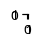

In [1]:
import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
f,a = plt.subplots(1,1,figsize=(1e-2, 1e-2))
mpl.rcParams['figure.dpi'] = 150
sns.set_style('darkgrid')
import os,sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import warnings
warnings.filterwarnings("ignore")
import glob
from tqdm.auto import tqdm
from datetime import datetime as dt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import LabelEncoder
import torch
from torch import nn
from torch.nn import functional as F
mpl.rcParams['figure.dpi'] = 180
# Load models together
%load_ext autoreload
%autoreload 2
    
from src.torch_utils import load_model_full
from src.utils import get_class_initcode_keys
from torch.utils.data import SequentialSampler
from src.datasets import *
from src.models import *
from src.utils import mkdirs, convert_path, pkl_dump, pkl_load, add_median_labels, get_palette
from src.sim_utils import make_dist_matrix
from src.torch_utils import save_checkpoint, load_checkpoint
from src.train_eval import predict_model, train_eval_loops
from src.models import FullTCRVAE, TwoStageVAECLF
from src.conv_models import CNNVAE, TwoStageCNNVAECLF
from src.metrics import reconstruction_accuracy, compute_cosine_distance
from src.cluster_utils import *
from src.networkx_utils import *

# TCRbase detour

In [294]:
exp_swap = pd.read_csv('../data/filtered/240326_nettcr_exp_paired_withswaps.csv')
old_swap = pd.read_csv('../data/filtered/231205_nettcr_old_26pep_with_swaps.csv')

In [343]:
from sklearn.metrics import roc_auc_score
from src.metrics import get_metrics
def read_tcrbase_results(peptide, original_df, partition=0, dir='../output/TCRBASE/tcrbase_expanded_ALL_swapped/'):
    cols = ['xx', 'xy', 'id_query'] + [f'q_{x}' for x in ['A1','A2','A3','B1','B2','B3']] + ['bs1', 'hit', 'id_db'] + [f'db_{x}' for x in ['A1','A2','A3','B1','B2','B3']] + ['score', 'bs2']
    df = pd.read_csv(f'{dir}{peptide}_p{partition}.txt', comment='#', sep='\s', header=None, names=cols)
    df['q_seq'] = df['q_A1']+df['q_A2']+df['q_A3']+df['q_B1']+df['q_B2']+df['q_B3']
    original_df = original_df.query('peptide==@peptide and partition==@partition')
    original_df['q_seq'] = original_df['A1']+original_df['A2']+original_df['A3']+original_df['B1']+original_df['B2']+original_df['B3']
    results = pd.merge(df.set_index('q_seq')[['score', 'id_db']+[f'db_{x}' for x in ['A1','A2','A3','B1','B2','B3']]],
                       original_df.set_index('q_seq')[['partition','binder', 'peptide', 'A1','A2','A3','B1','B2','B3']],
                       left_index=True, right_index=True)
    print(peptide, round(roc_auc_score(results['binder'], results['score']),4))
    tcrbase_metrics = {'peptide':peptide, 
                       'method':'tcrbase',
                       'n_pos':len(original_df.query('original_peptide==@peptide and partition==@partition'))}
    tcrbase_metrics.update(get_metrics(results['binder'], results['score'], round_digit=5))
    print(tcrbase_metrics)
    return tcrbase_metrics, results
        

In [345]:
total_exp=[]
total_old=[]
for partition in range(5):
    exp_results = []
    for p in exp_swap.peptide.unique():
        x, _ = read_tcrbase_results(p, exp_swap, partition=partition, dir='../output/TCRBASE/tcrbase_expanded_ALL_swapped/')
        exp_results.append(x)    
    exp_results = pd.DataFrame(exp_results)
    
    old_results = []
    for p in old_swap.peptide.unique():
        x, _ = read_tcrbase_results(p, old_swap, partition=partition, dir='../output/TCRBASE/tcrbase_old_ALL_swapped/')
        old_results.append(x)    
    old_results = pd.DataFrame(old_results)
    total_exp.append(exp_results.assign(partition=partition))
    total_old.append(old_results.assign(partition=partition))
    exp_results.sort_values('n_pos', ascending=False).to_csv(f'../output/TCRBASE/results_exp_partition_p{partition}.csv', index=False)
    old_results.sort_values('n_pos', ascending=False).to_csv(f'../output/TCRBASE/results_old_partition_p{partition}.csv', index=False)

AVFDRKSDAK 0.4855
{'peptide': 'AVFDRKSDAK', 'method': 'tcrbase', 'n_pos': 143, 'auc': 0.48551, 'auc_01': 0.50745, 'auc_01_real': 0.06416, 'precision': 0.16628, 'recall': 1.0, 'accuracy': 0.16628, 'AP': 0.18505}
KLGGALQAK 0.6103
{'peptide': 'KLGGALQAK', 'method': 'tcrbase', 'n_pos': 181, 'auc': 0.6103, 'auc_01': 0.55241, 'auc_01_real': 0.14958, 'precision': 0.16728, 'recall': 1.0, 'accuracy': 0.16728, 'AP': 0.29468}
ELAGIGILTV 0.932
{'peptide': 'ELAGIGILTV', 'method': 'tcrbase', 'n_pos': 92, 'auc': 0.93198, 'auc_01': 0.80832, 'auc_01_real': 0.63581, 'precision': 0.16758, 'recall': 1.0, 'accuracy': 0.16758, 'AP': 0.80004}
TTDPSFLGRY 0.6819
{'peptide': 'TTDPSFLGRY', 'method': 'tcrbase', 'n_pos': 78, 'auc': 0.68187, 'auc_01': 0.61969, 'auc_01_real': 0.27741, 'precision': 0.16774, 'recall': 1.0, 'accuracy': 0.16774, 'AP': 0.44064}
RAKFKQLL 0.8805
{'peptide': 'RAKFKQLL', 'method': 'tcrbase', 'n_pos': 166, 'auc': 0.88051, 'auc_01': 0.80623, 'auc_01_real': 0.63184, 'precision': 0.16667, 'recal

TypeError: Could not convert tcrbasetcrbasetcrbasetcrbasetcrbase to numeric

In [353]:
pd.concat(total_exp).drop(columns=['method']).groupby('peptide').mean().sort_values('n_pos',ascending=False).to_csv(f'../output/TCRBASE/total_mean_exp_results.csv', index=True)
pd.concat(total_old).drop(columns=['method']).groupby('peptide').mean().sort_values('n_pos',ascending=False).to_csv(f'../output/TCRBASE/total_mean_old_results.csv', index=True)

In [354]:
total_exp = pd.concat(total_exp).drop(columns=['method']).groupby('peptide').mean()
total_old = pd.concat(total_old).drop(columns=['method']).groupby('peptide').mean()

In [924]:
exp_filt = total_exp.query('n_pos>=75').sort_values('auc',ascending=False).head(17).index
total_exp.query('n_pos>75').sort_values('auc',ascending=False).head(17)


,n_pos,auc,auc_01,auc_01_real,precision,recall,accuracy,AP,partition
peptide,,,,,,,,,
ELAGIGILTV,91.4,0.913552,0.809742,0.638514,0.166668,1.0,0.166668,0.782364,2.0
RAKFKQLL,166.0,0.901230,0.833696,0.684024,0.166670,1.0,0.166670,0.779796,2.0
GILGFVFTL,233.0,0.829168,0.744974,0.515450,0.166670,1.0,0.166670,0.634484,2.0
YLQPRTFLL,79.8,0.731442,0.694864,0.420246,0.166662,1.0,0.166662,0.573052,2.0
TTDPSFLGRY,77.4,0.672200,0.632344,0.301454,0.166666,1.0,0.166666,0.458376,2.0
SPRWYFYYL,89.8,0.671422,0.649950,0.334904,0.166670,1.0,0.166670,0.475666,2.0
KLGGALQAK,180.2,0.583082,0.561664,0.167164,0.166664,1.0,0.166664,0.289294,2.0
AVFDRKSDAK,143.4,0.537760,0.523512,0.094672,0.166668,1.0,0.166668,0.216992,2.0


# inits

In [2]:
exp_df = pd.read_csv('../data/multimodal/240311_nettcr_pairedAB_expanded_noswap.csv')
exp78 = pd.read_csv('../data/filtered/240507_nettcr_exp_pruned_noswap_78peps.csv')
exp17 = pd.read_csv('../data/filtered/240418_nettcr_expanded_20binders_17pep_POSONLY.csv')
old_df = pd.read_csv('../data/filtered/240416_nettcr_old_26pep_no_swaps.csv')
old15 = pd.read_csv('../data/filtered/240416_nettcr_old_top15peps_no_swaps.csv')
old20 = pd.read_csv('../data/filtered/240507_nettcr_old_pruned_noswap_20peps.csv')

# Debug the return of my iterative cut functions

In [6]:
import networkx as nx
from datetime import datetime as dt
from src.cluster_utils import *
from src.networkx_utils import *

In [13]:
import random
# Take a much smaller subsample to debug because my function is obviously wrong
seed=131
random.seed(seed)
# Take test partition only, subsample
easy5peps = ['ELAGIGILTV', 'GILGFVFTL', 'LLWNGPMAV', 'RAKFKQLL', 'YLQPRTFLL']
testset = exp17.query('peptide in @easy5peps and partition==1')
# Randomly subsample between 60 and 74 datapoints for each peptide:
testset_subsample = []
for p in easy5peps:
    tmp = testset.query('peptide==@p')
    testset_subsample.append(tmp.sample(min(len(tmp), random.randint(50,70)), random_state=seed))
testset_subsample = pd.concat(testset_subsample)
testset_idx = testset_subsample.query('partition==1')['raw_index'].unique()
testset_subsample.groupby('peptide').count()

,Unnamed: 0.1,Unnamed: 0,A1,A2,A3,B1,B2,B3,allele,partition,binder,origin,original_peptide,raw_index,reference,source_organism,input_type,db
peptide,,,,,,,,,,,,,,,,,,
ELAGIGILTV,60,60,60,60,60,60,60,60,60,60,60,60,60,60,60,10,60,60
GILGFVFTL,61,61,61,61,61,61,61,61,61,61,61,61,61,61,61,13,61,61
LLWNGPMAV,66,66,66,66,66,66,66,66,66,66,66,66,66,66,66,66,66,66
RAKFKQLL,52,52,52,52,52,52,52,52,52,52,52,52,52,52,52,0,52,52
YLQPRTFLL,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62


In [17]:
# Best model picked on validation performance
model = load_model_full('../output/240618_NestedKCV_CNNVAE/Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj/epoch_5000_interval_checkpoint__kcv_fold_00_Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj.pt',
                        '../output/240618_NestedKCV_CNNVAE/Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj/checkpoint_best_kcv_fold_00_Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj_JSON_kwargs.json',
                        map_location='cpu', verbose=False)
latent_df_testset = get_latent_df(model, testset_subsample)
dm_ts128_testset, values_ts128_testset, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_df_testset, index_col='raw_index')

<class 'torch.nn.modules.batchnorm.BatchNorm1d'> 128 9 4 2 1 0 SELU()


In [18]:
# re-get the baseline and re-filter based on the subset test set
dm_tbcr_testset = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_140peps_labeled.csv', index_col=0).query('partition==1 and raw_index in @testset_idx')
dm_tcrdist_testset = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/tcrdist3_distmatrix_140peps_new_labeled.csv', index_col=0).query('partition==1 and raw_index in @testset_idx')
# Resort it just so that we can re-use the labels and indices in the same order
dm_tbcr_testset, values_tbcr_testset = resort_baseline(dm_tbcr_testset, dm_ts128_testset, 'raw_index')
dm_tcrdist_testset, values_tcrdist_testset = resort_baseline(dm_tcrdist_testset, dm_ts128_testset, 'raw_index')

In [77]:
G, tree, dist_matrix, values, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_ts128_testset)
tree.edges(data=True)

EdgeDataView([(0, 184, {'weight': 0.34623271226882935}), (0, 34, {'weight': 0.4306254982948303}), (1, 11, {'weight': 0.4081287384033203}), (1, 32, {'weight': 0.6517423391342163}), (2, 267, {'weight': 0.6811701059341431}), (3, 32, {'weight': 0.6503627896308899}), (4, 52, {'weight': 0.6852259039878845}), (5, 152, {'weight': 0.28540563583374023}), (6, 22, {'weight': 0.3681669235229492}), (7, 97, {'weight': 0.6620118021965027}), (8, 51, {'weight': 0.24915474653244019}), (8, 50, {'weight': 0.48686033487319946}), (9, 57, {'weight': 0.37865394353866577}), (9, 158, {'weight': 0.38035815954208374}), (10, 96, {'weight': 0.6821213960647583}), (10, 245, {'weight': 0.7033871412277222}), (11, 45, {'weight': 0.55698561668396}), (12, 34, {'weight': 0.545823335647583}), (12, 53, {'weight': 0.6230318546295166}), (12, 55, {'weight': 0.6314609050750732}), (12, 111, {'weight': 0.7528945207595825}), (13, 79, {'weight': 0.5132654905319214}), (13, 23, {'weight': 0.5228242874145508}), (14, 126, {'weight': 0.49

In [40]:
initial_cut_threshold=1
initial_cut_method='top'
size_tree_cut, size_subgraphs, size_clusters, size_edges_removed, size_nodes_removed, size_scores, size_purities, size_retentions = iterative_size_cut(values, tree, initial_cut_threshold, initial_cut_method, top_n=1, which='edge', 
                                                                                                                                                       weighted=True, verbose=0, max_size=4)
topn_tree_cut, topn_subgraphs, topn_clusters, topn_edges_removed, topn_nodes_removed, topn_scores, topn_purities, topn_retentions = iterative_topn_cut(values, tree, initial_cut_threshold, initial_cut_method, top_n=1, which='edge', 
                                                                                                                                                       weighted=True, verbose=0, score_threshold=.75)

print(len(size_clusters), len(topn_clusters))
print(len(list(nx.connected_components(size_tree_cut))), len(list(nx.connected_components(topn_tree_cut))))


Initial mean purity, silhouette score, retention
0.3555 0.0789 1.0
106 1
2 1


In [41]:
topn_clusters

[{'cluster_size': 2,
  'majority_label': 'LLWNGPMAV',
  'purity': 1.0,
  'counts': {'LLWNGPMAV': 2},
  'members': {139, 143}}]

In [42]:
topn_tree_cut.nodes()

NodeView((139, 143))

In [43]:
topn_tree_cut.edges()

EdgeView([(139, 143)])

## debug topn_cut

In [107]:
G, tree, dist_matrix, values, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_ts128_testset)
list(tree.edges(data=True))[:5]

[(0, 184, {'weight': 0.34623271226882935}),
 (0, 34, {'weight': 0.4306254982948303}),
 (1, 11, {'weight': 0.4081287384033203}),
 (1, 32, {'weight': 0.6517423391342163}),
 (2, 267, {'weight': 0.6811701059341431})]

In [123]:
topn_tree_cut, topn_subgraphs, topn_clusters, topn_edges_removed, topn_nodes_removed, topn_scores, topn_purities, topn_retentions = iterative_topn_cut(values, tree, initial_cut_threshold, initial_cut_method, top_n=1, which='edge', 
                                                                                                                                                       weighted=True, verbose=0, score_threshold=.75)

Initial mean purity, silhouette score, retention
0.3555 0.0789 1.0


In [90]:
# initial cut
dist_array=values
weighted=True
verbose=2
which='edge'
top_n=1
tree_cut, clusters, edges_removed, nodes_removed = betweenness_cut(tree, initial_cut_threshold, initial_cut_method,
                                                                   which, False, verbose)
current_silhouette_score = get_silhouette_score_at_cut(dist_array, clusters)
print('Initial mean purity, silhouette score, retention')
print(np.mean([x['purity'] for x in clusters]).round(4), current_silhouette_score, round(sum([x['cluster_size'] for x in clusters])/len(dist_array),4))
iter=-1
# Something is wrong about this. I probably shouldn't loop over every cluster but do a fullgraph cut at each iteration by taking the Top N edges
# TODO : --> Global edge cut
# Can do something about max_silhouette_score to save the "best" trees and clusters
scores = [current_silhouette_score]
purities = [np.mean([x['purity'] for x in clusters])]
retentions = [round(sum([x['cluster_size'] for x in clusters])/len(dist_array),4)]
best_silhouette_score = -1
best_tree, best_clusters, best_edges_removed, best_nodes_removed = tree_cut, clusters, edges_removed, nodes_removed
# Make a copy before starting the iteration to re-use the variable
tree_trimmed = tree_cut.copy()

		edges, nodes
before cutting:	300,	301
after cutting:	299,	301
N components before cutting:	 1
N components after cutting:	 2

Edges removed:
[((107, 204), 0.49563676633444076)]

Nodes removed:
[]
Initial mean purity, silhouette score, retention
0.3445 0.0751 1.0


In [98]:
def get_bet(tree):
    edge_betweenness = nx.edge_betweenness_centrality(tree)
    weighted_edge_betweenness = {k: tree.edges[k]['weight'] * v for k, v in edge_betweenness.items()}
    
    sorted_edges = sorted(edge_betweenness.items(), key=lambda item: item[1], reverse=True)
    sorted_weighted = sorted(weighted_edge_betweenness.items(), key=lambda item: item[1], reverse=True)
    print(sorted_edges[:3])
    print(sorted_weighted[:3])
    return sorted_edges, sorted_weighted

In [125]:
len(topn_subgraphs)

106

In [126]:
len(list(nx.connected_components(topn_tree_cut)))

106

In [127]:
len(topn_clusters)

106

In [101]:
normal, weight = get_bet(tree_trimmed)
normal, weight = get_bet(tree_trimmed_1)

[((94, 204), 0.1542857142857143), ((94, 109), 0.15348837209302327), ((75, 204), 0.15242524916943523)]
[((93, 199), 0.06993362770524136), ((75, 84), 0.06329388522626554), ((93, 118), 0.06298987355343132)]
[((168, 182), 0.09508305647840531), ((182, 184), 0.09056478405315616), ((0, 184), 0.08205980066445183)]
[((0, 34), 0.034793395742625494), ((182, 184), 0.03252628752955567), ((0, 184), 0.02841178735229264)]


In [100]:
# iteration 1 : manual
tree_trimmed_1, clusters_1, edges_trimmed_1, nodes_trimmed_1 = betweenness_cut(tree_trimmed, cut_threshold=top_n, cut_method='top',
                                                                       which=which, weighted=weighted, verbose=verbose)
tree_trimmed_2, clusters_2, edges_trimmed_2, nodes_trimmed_2 = betweenness_cut(tree_trimmed_1, cut_threshold=top_n, cut_method='top',
                                                                       which=which, weighted=weighted, verbose=verbose)

		edges, nodes
before cutting:	299,	301
after cutting:	298,	301
N components before cutting:	 2
N components after cutting:	 3

Edges removed:
[((93, 199), 0.06993362770524136)]

Nodes removed:
[]
		edges, nodes
before cutting:	298,	301
after cutting:	297,	301
N components before cutting:	 3
N components after cutting:	 4

Edges removed:
[((0, 34), 0.034793395742625494)]

Nodes removed:
[]


In [106]:
clusters_2

[{'cluster_size': 99,
  'majority_label': 'GILGFVFTL',
  'purity': 0.3838383838383838,
  'counts': {'ELAGIGILTV': 4,
   'GILGFVFTL': 38,
   'LLWNGPMAV': 14,
   'RAKFKQLL': 21,
   'YLQPRTFLL': 22},
  'members': {18,
   31,
   35,
   58,
   61,
   62,
   63,
   65,
   66,
   67,
   68,
   72,
   73,
   75,
   77,
   78,
   81,
   83,
   84,
   86,
   87,
   88,
   89,
   93,
   94,
   95,
   98,
   99,
   100,
   101,
   102,
   104,
   106,
   108,
   109,
   112,
   113,
   114,
   115,
   116,
   118,
   120,
   122,
   123,
   145,
   150,
   153,
   155,
   157,
   163,
   167,
   171,
   176,
   178,
   180,
   183,
   188,
   193,
   194,
   198,
   203,
   204,
   208,
   209,
   211,
   214,
   215,
   216,
   217,
   219,
   220,
   227,
   228,
   229,
   230,
   232,
   233,
   243,
   244,
   250,
   252,
   254,
   260,
   264,
   265,
   272,
   273,
   274,
   275,
   277,
   286,
   287,
   290,
   291,
   292,
   293,
   295,
   297,
   299}},
 {'cluster_size': 96,
  'm

In [104]:
len(clusters_1)

3

## debug size_cut

In [129]:
G, tree, dist_matrix, values, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_ts128_testset)
list(tree.edges(data=True))[:5]

[(0, 184, {'weight': 0.34623271226882935}),
 (0, 34, {'weight': 0.4306254982948303}),
 (1, 11, {'weight': 0.4081287384033203}),
 (1, 32, {'weight': 0.6517423391342163}),
 (2, 267, {'weight': 0.6811701059341431})]

In [136]:
size_tree_cut, size_subgraphs, size_clusters, size_edges_removed, size_nodes_removed, size_scores, size_purities, size_retentions = iterative_size_cut(values, tree, initial_cut_threshold, initial_cut_method, top_n=1, which='edge', 
                                                                                                                                                       weighted=True, verbose=0, max_size=4)
len(size_subgraphs)

141

In [141]:
tree_return = nx.Graph()
# Combine all subgraphs
for subgraph in size_subgraphs:
    tree_return = nx.compose(tree_return, subgraph)
    

In [146]:
size_subgraphs[0].nodes(), size_clusters[0]

(NodeView((2, 4, 6, 10, 13, 17, 18, 22, 23, 25, 27, 28, 31, 35, 37, 52, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 72, 73, 75, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 112, 113, 114, 115, 116, 117, 118, 119, 120, 122, 123, 127, 145, 149, 150, 153, 155, 157, 163, 167, 170, 171, 176, 178, 180, 181, 183, 188, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 239, 240, 241, 242, 243, 244, 245, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 259, 260, 262, 263, 264, 265, 266, 267, 268, 270, 271, 272, 273, 274, 275, 276, 277, 278, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300)),
 {'cluster_size': 3,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 3},
  'members': {7

In [143]:
list(nx.connected_components(tree_return))

[{2,
  4,
  10,
  17,
  25,
  28,
  37,
  52,
  76,
  92,
  96,
  110,
  117,
  119,
  127,
  149,
  170,
  190,
  191,
  192,
  196,
  199,
  200,
  201,
  202,
  205,
  206,
  207,
  212,
  213,
  218,
  221,
  225,
  226,
  231,
  234,
  239,
  240,
  241,
  242,
  245,
  248,
  249,
  251,
  253,
  256,
  257,
  259,
  262,
  263,
  266,
  267,
  268,
  270,
  271,
  276,
  278,
  281,
  282,
  283,
  284,
  285,
  288,
  289,
  294,
  296,
  298,
  300},
 {6,
  13,
  18,
  22,
  23,
  27,
  31,
  35,
  58,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  70,
  72,
  73,
  75,
  77,
  78,
  79,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  93,
  94,
  95,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  112,
  113,
  114,
  115,
  116,
  118,
  120,
  122,
  123,
  145,
  150,
  153,
  155,
  157,
  163,
  167,
  171,
  176,
  178,
  180,
  181,
  183,
  188,
  193,
  194,
  195,
  198,
  203,
  204,
  208,
  209,
  211,
  2

In [142]:
len(list(nx.connected_components(tree_return)))


4

In [137]:
len(list(nx.connected_components(size_tree_cut)))

4

In [132]:
len(list(nx.connected_components(size_tree_cut)))

2

# Comparisons of all CNN models for MST cuts

In [723]:
def get_agg_matrix(dm_vae, dm_base, index_col='raw_index', cols = ('peptide', 'original_peptide','raw_index', 'binder', 'partition')):
    if not all([x==y for x,y in zip(dm_vae[index_col].values, dm_base[index_col].values)]):
        dm_base, values_base = resort_baseline(dm_base, dm_vae, index_col)
    else:
        values_base = None
    values_vae = dm_vae.iloc[:len(dm_vae), :len(dm_vae)].values
    if values_base is None:
        values_base = dm_base.iloc[:len(dm_base), :len(dm_base)].values
    assert all([x==y for x,y in zip(dm_vae[index_col].values, dm_base[index_col].values)]) and len(dm_vae)==len(dm_base)
    agg_values = 1-np.multiply(1-values_vae, 1-values_base)
    agg_dm = pd.DataFrame(agg_values)
    agg_dm[list(cols)] = dm_vae[list(cols)].values
    return agg_dm, agg_dm.iloc[:len(agg_dm), :len(agg_dm)].values

In [718]:
dm_tbcr = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_140peps_labeled.csv', index_col=0)
dm_tcrdist = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/tcrdist3_distmatrix_140peps_new_labeled.csv', index_col=0)

In [719]:
model_ts128 = load_model_full('../output/240618_NestedKCV_CNNVAE/Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj/epoch_5000_interval_checkpoint__kcv_fold_00_Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj.pt',
                              '../output/240618_NestedKCV_CNNVAE/Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj/checkpoint_best_kcv_fold_00_Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj_JSON_kwargs.json',
                              map_location='cpu', verbose=False)
model_os128 = load_model_full('../output/240618_NestedKCV_CNNVAE/Nested_CNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1607_ER8wJ/checkpoint_best_fold00_kcv_240618_nettcr_exp_nested_posonly_train_p0234_f00_Nested_CNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1607_ER8wJ.pt',
                              '../output/240618_NestedKCV_CNNVAE/Nested_CNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1607_ER8wJ/checkpoint_best_fold00_kcv_240618_nettcr_exp_nested_posonly_train_p0234_f00_Nested_CNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1607_ER8wJ_JSON_kwargs.json',
                              map_location='cpu', verbose=False)
model_os256 = load_model_full('../output/240618_NestedKCV_CNNVAE/Nested_CNNVAE_latent_256_kld_1e-2_ExpData_KFold_0_240618_1607_vnN02/epoch_8000_interval_checkpoint__fold00_kcv_240618_nettcr_exp_nested_posonly_train_p0234_f00_Nested_CNNVAE_latent_256_kld_1e-2_ExpData_KFold_0_240618_1607_vnN02.pt',
                              '../output/240618_NestedKCV_CNNVAE/Nested_CNNVAE_latent_256_kld_1e-2_ExpData_KFold_0_240618_1607_vnN02/checkpoint_best_fold00_kcv_240618_nettcr_exp_nested_posonly_train_p0234_f00_Nested_CNNVAE_latent_256_kld_1e-2_ExpData_KFold_0_240618_1607_vnN02_JSON_kwargs.json',
                              map_location='cpu', verbose=False)


<class 'torch.nn.modules.batchnorm.BatchNorm1d'> 128 9 4 2 1 0 SELU()
<class 'torch.nn.modules.batchnorm.BatchNorm1d'> 128 9 4 2 1 0 SELU()
<class 'torch.nn.modules.batchnorm.BatchNorm1d'> 256 9 4 2 1 0 SELU()


## Valid set, 17 peps, no subsample

### Data reading and sorting

In [742]:
import random
seed=1
random.seed(seed)
# easy5peps = exp17.peptide.unique()#['ELAGIGILTV', 'GILGFVFTL', 'LLWNGPMAV', 'RAKFKQLL', 'YLQPRTFLL']
df = exp17.query('partition==0')
df_idx = df['raw_index'].unique()
df.groupby('peptide').count()
# Best model picked on validation performance
latent_ts128 = get_latent_df(model_ts128, df)
latent_os128 = get_latent_df(model_os128, df)
latent_os256 = get_latent_df(model_os256, df)
dm_ts128, values_ts128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_ts128, index_col='raw_index')
dm_os128, values_os128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os128, index_col='raw_index')
dm_os256, values_os256, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os256, index_col='raw_index')
# Assert all index are in the same order prior to refiltering+resorting the baselines
assert all(dm_os128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os128.raw_index), 'wtf'
# re-get the baseline and re-filter based on the subset test set
dm_tbcr_testset = dm_tbcr.query('partition==0 and raw_index in @df_idx')
dm_tcrdist_testset = dm_tcrdist.query('partition==0 and raw_index in @df_idx')
# Resort it just so that we can re-use the labels and indices in the same order
dm_tbcr_testset, values_tbcr_testset = resort_baseline(dm_tbcr_testset, dm_ts128, 'raw_index')
dm_tcrdist_testset, values_tcrdist_testset = resort_baseline(dm_tcrdist_testset, dm_ts128, 'raw_index')
# Aggregate the "best" model which is the two-stage 128 and the TBCRalign matrix
dm_agg, values_agg = get_agg_matrix(dm_ts128, dm_tbcr_testset)
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(dm_ts128), len(dm_os128), len(dm_os256), len(dm_agg))

1471 1471 1471 1471 1471 1471


### params

In [743]:
initial_cut_threshold=1
initial_cut_method='top'
filename='240715_17peps_nosub_partition0_validation_'

### Running the algos for baselines

In [744]:
# TBCRALIGN

G, tree, dist_matrix, values_tbcr_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tbcr_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tbcr_it_scores, tbcr_it_purities, tbcr_it_rets = iterative_size_cut(values_tbcr_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tbcr_sh_scores, tbcr_sh_purities, tbcr_sh_rets = iterative_topn_cut(values_tbcr_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

# Running TCRdist distmatrix
G, tree, dist_matrix, values_tcrdist_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tcrdist_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tcrdist_it_scores, tcrdist_it_purities, tcrdist_it_rets = iterative_size_cut(values_tcrdist_testset, tree, 
                                                                                                                                 initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                 initial_cut_method=initial_cut_method, 
                                                                                                                                 top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tcrdist_sh_scores, tcrdist_sh_purities, tcrdist_sh_rets = iterative_topn_cut(values_tcrdist_testset, tree, 
                                                                                                                                            initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                            initial_cut_method=initial_cut_method, 
                                                                                                                                            top_n=1, which='edge', weighted=True, 
                                                                                                                                            verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

Initial mean purity, silhouette score, retention
0.1774 0.022 1.0
2.15506958250497 2.5247524752475248
Initial mean purity, silhouette score, retention
0.2566 0.0246 1.0
2.2172131147540983 2.531568228105906


### Running for VAEs

In [745]:
# Two-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_ts128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_ts128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_ts128, it_purities_ts128, it_rets_ts128 = iterative_size_cut(values_ts128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_ts128, sh_purities_ts128, sh_rets_ts128 = iterative_topn_cut(values_ts128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.1821 0.0274 1.0
2.263157894736842 2.4738805970149254


In [746]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os128, it_purities_os128, it_rets_os128 = iterative_size_cut(values_os128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os128, sh_purities_os128, sh_rets_os128 = iterative_topn_cut(values_os128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.2267 0.0216 1.0
2.211320754716981 2.472897196261682


In [747]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os256_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os256, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os256, it_purities_os256, it_rets_os256 = iterative_size_cut(values_os256_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os256, sh_purities_os256, sh_rets_os256 = iterative_topn_cut(values_os256_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.2304 0.0262 1.0
2.1348747591522157 2.5067178502879077


### Run the aggregate

In [748]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_agg_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_agg, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_agg, it_purities_agg, it_rets_agg = iterative_size_cut(values_agg_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_agg, sh_purities_agg, sh_rets_agg = iterative_topn_cut(values_agg_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.1745 0.0239 1.0
2.2504604051565376 2.448717948717949


In [749]:
ts128_cluster_testset = cluster_all_thresholds(values_ts128_testset, values_ts128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os128_cluster_testset = cluster_all_thresholds(values_os128_testset, values_os128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os256_cluster_testset = cluster_all_thresholds(values_os256_testset, values_os256_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tcrdist_cluster_testset = cluster_all_thresholds(values_tcrdist_testset, values_tcrdist_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tbcr_cluster_testset = cluster_all_thresholds(values_tbcr_testset, values_tbcr_testset, labels, encoded_labels, label_encoder, n_jobs=8)
agg_cluster_testset = cluster_all_thresholds(values_agg_testset, values_agg_testset, labels, encoded_labels, label_encoder, n_jobs=8)

HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.47it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:17<00:00, 27.90it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:18<00:00, 27.12it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.77it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.78it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.99it/s]


### silhouette score plots

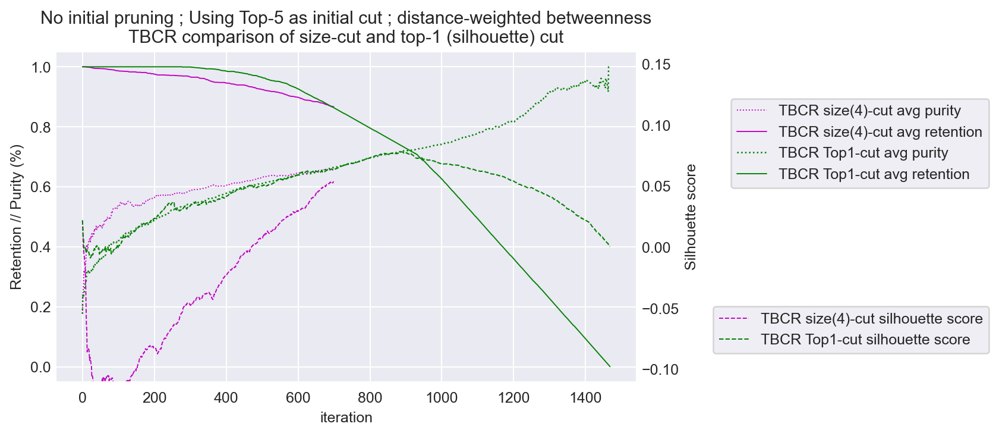

In [750]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\nTBCR comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tbcr_it_purities)), tbcr_it_purities, lw=.75, ls=':', c='m',
       label='TBCR size(4)-cut avg purity')
a.plot(range(len(tbcr_it_rets)), tbcr_it_rets, lw=.75, ls='-', c='m',
       label='TBCR size(4)-cut avg retention')
a2.plot(range(len(tbcr_it_scores)), tbcr_it_scores, lw=.75, ls='--', c='m',
       label='TBCR size(4)-cut silhouette score')

a.plot(range(len(tbcr_sh_purities)), tbcr_sh_purities, lw=1, ls=':', c='g',
       label='TBCR Top1-cut avg purity')
a.plot(range(len(tbcr_sh_rets)), tbcr_sh_rets, lw=.75, ls='-', c='g',
       label='TBCR Top1-cut avg retention')
a2.plot(range(len(tbcr_sh_scores)), tbcr_sh_scores, lw=.8, ls='--', c='g',
       label='TBCR Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}TBCR_silhouette.png', dpi=150, bbox_inches='tight')


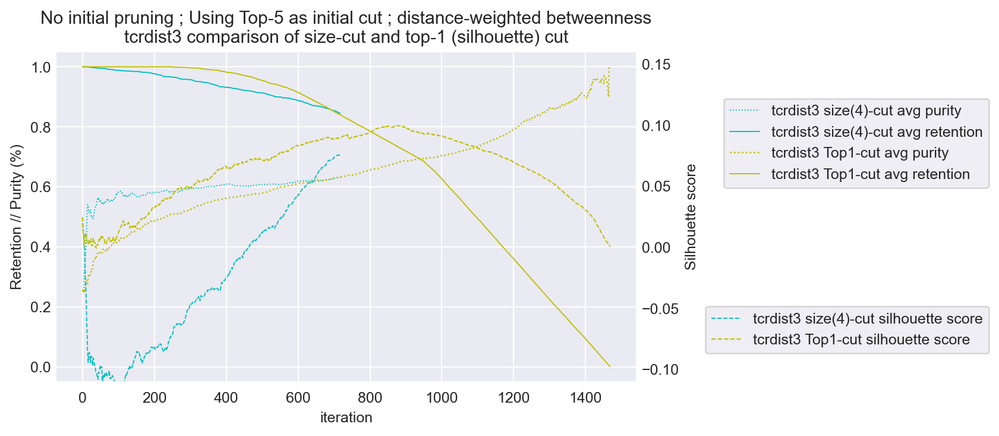

In [751]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\ntcrdist3 comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tcrdist_it_purities)), tcrdist_it_purities, lw=.75, ls=':', c='c',
       label='tcrdist3 size(4)-cut avg purity')
a.plot(range(len(tcrdist_it_rets)), tcrdist_it_rets, lw=.75, ls='-', c='c',
       label='tcrdist3 size(4)-cut avg retention')
a2.plot(range(len(tcrdist_it_scores)), tcrdist_it_scores, lw=.75, ls='--', c='c',
       label='tcrdist3 size(4)-cut silhouette score')

a.plot(range(len(tcrdist_sh_purities)), tcrdist_sh_purities, lw=1, ls=':', c='y',
       label='tcrdist3 Top1-cut avg purity')
a.plot(range(len(tcrdist_sh_rets)), tcrdist_sh_rets, lw=.75, ls='-', c='y',
       label='tcrdist3 Top1-cut avg retention')
a2.plot(range(len(tcrdist_sh_scores)), tcrdist_sh_scores, lw=.8, ls='--', c='y',
       label='tcrdist3 Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}tcrdist3_silhouette.png', dpi=150, bbox_inches='tight')


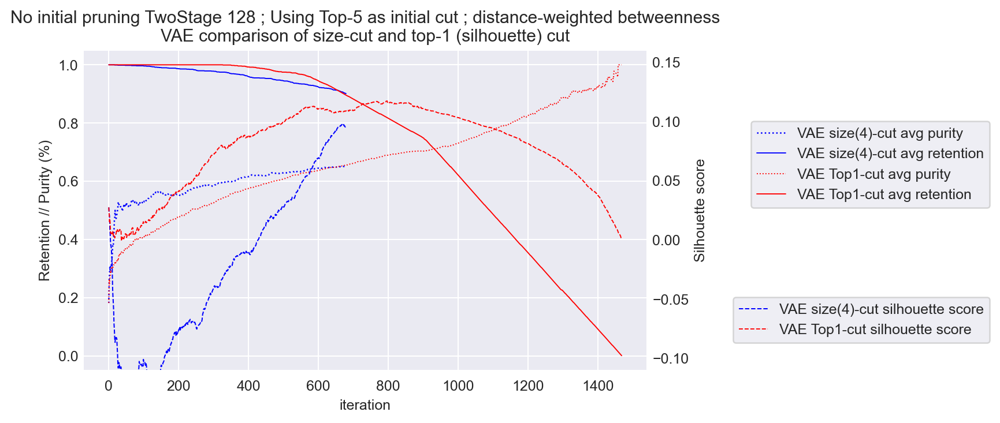

In [752]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning TwoStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_ts128)), it_purities_ts128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_ts128)), it_rets_ts128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_ts128)), it_scores_ts128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_ts128)), sh_purities_ts128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_ts128)), sh_rets_ts128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_ts128)), sh_scores_ts128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_ts128_silhouette.png', dpi=150, bbox_inches='tight')


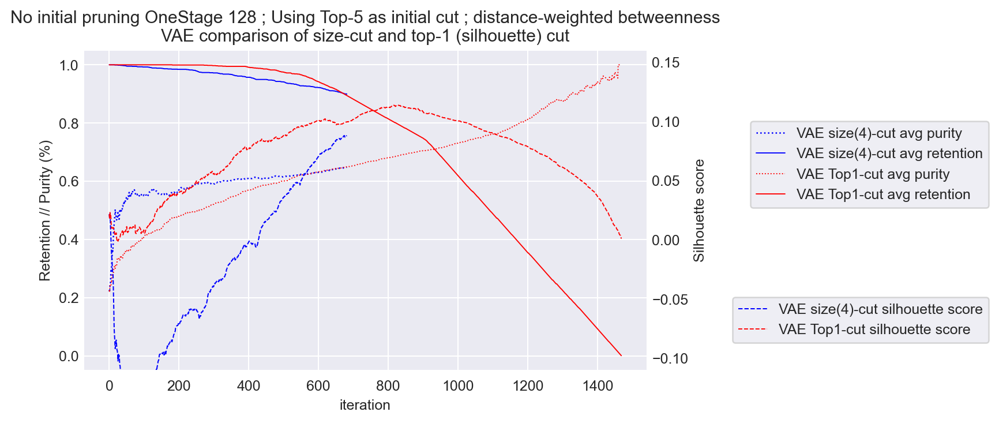

In [753]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os128)), it_purities_os128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os128)), it_rets_os128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os128)), it_scores_os128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os128)), sh_purities_os128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os128)), sh_rets_os128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os128)), sh_scores_os128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os128_silhouette.png', dpi=150, bbox_inches='tight')


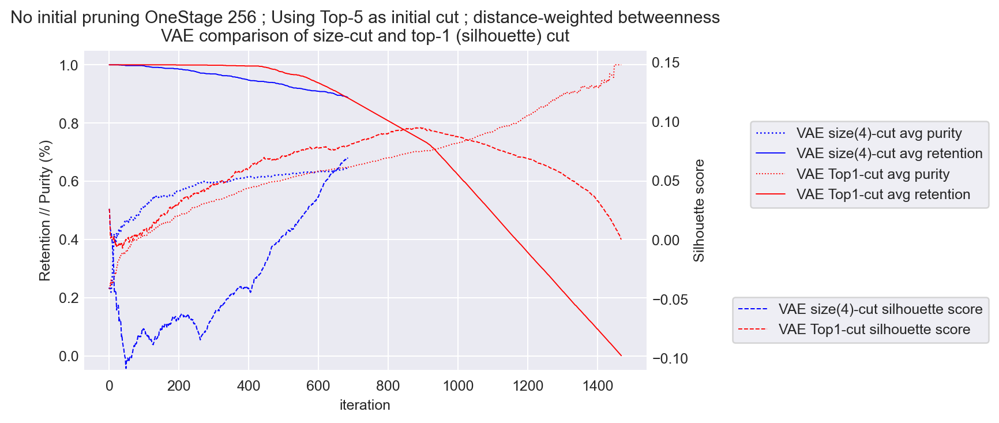

In [754]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 256 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os256)), it_purities_os256, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os256)), it_rets_os256, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os256)), it_scores_os256, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os256)), sh_purities_os256, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os256)), sh_rets_os256, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os256)), sh_scores_os256, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os256_silhouette.png', dpi=150, bbox_inches='tight')


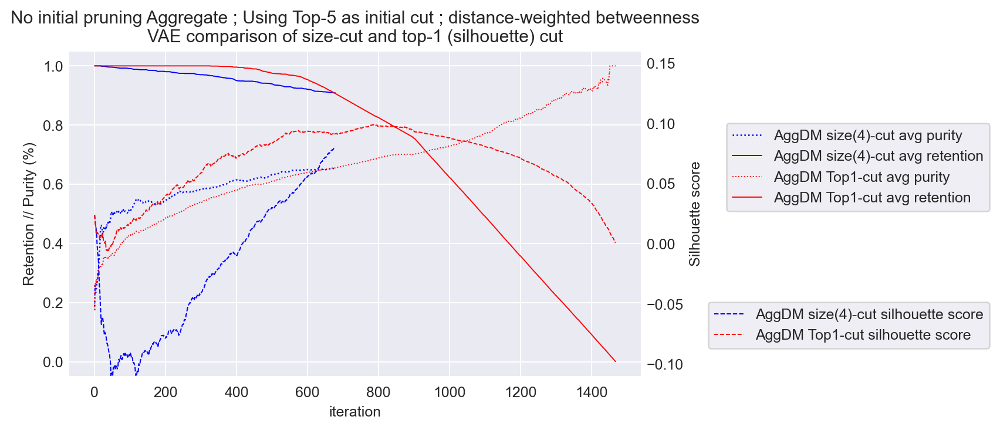

In [755]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning Aggregate ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_agg)), it_purities_agg, lw=1, ls=':', c='b',
       label='AggDM size(4)-cut avg purity')
a.plot(range(len(it_rets_agg)), it_rets_agg, lw=.75, ls='-', c='b',
       label='AggDM size(4)-cut avg retention')
a2.plot(range(len(it_scores_agg)), it_scores_agg, lw=.8, ls='--', c='b',
       label='AggDM size(4)-cut silhouette score')

a.plot(range(len(sh_purities_agg)), sh_purities_agg, lw=.75, ls=':', c='r',
       label='AggDM Top1-cut avg purity')
a.plot(range(len(sh_rets_agg)), sh_rets_agg, lw=.75, ls='-', c='r',
       label='AggDM Top1-cut avg retention')
a2.plot(range(len(sh_scores_agg)), sh_scores_agg, lw=.75, ls='--', c='r',
       label='AggDM Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_agg_silhouette.png', dpi=150, bbox_inches='tight')


### retpur curves

In [756]:
# Identify best point (based on Silhouette score) for each of the 4 conditions and add them as scatter points
best_sh_ts128 = sh_rets_ts128[np.argmax(sh_scores_ts128)], sh_purities_ts128[np.argmax(sh_scores_ts128)]
best_it_ts128 = it_rets_ts128[np.argmax(it_scores_ts128)], it_purities_ts128[np.argmax(it_scores_ts128)]
best_sh_os128 = sh_rets_os128[np.argmax(sh_scores_os128)], sh_purities_os128[np.argmax(sh_scores_os128)]
best_it_os128 = it_rets_os128[np.argmax(it_scores_os128)], it_purities_os128[np.argmax(it_scores_os128)]
best_sh_os256 = sh_rets_os256[np.argmax(sh_scores_os256)], sh_purities_os256[np.argmax(sh_scores_os256)]
best_it_os256 = it_rets_os256[np.argmax(it_scores_os256)], it_purities_os256[np.argmax(it_scores_os256)]
best_sh_agg = sh_rets_agg[np.argmax(sh_scores_agg)], sh_purities_agg[np.argmax(sh_scores_agg)]
best_it_agg = it_rets_agg[np.argmax(it_scores_agg)], it_purities_agg[np.argmax(it_scores_agg)]
best_tbcr_sh = tbcr_sh_rets[np.argmax(tbcr_sh_scores)], tbcr_sh_purities[np.argmax(tbcr_sh_scores)]
best_tbcr_it = tbcr_it_rets[np.argmax(tbcr_it_scores)], tbcr_it_purities[np.argmax(tbcr_it_scores)]
best_tcrdist_sh = tcrdist_sh_rets[np.argmax(tcrdist_sh_scores)], tcrdist_sh_purities[np.argmax(tcrdist_sh_scores)]
best_tcrdist_it = tcrdist_it_rets[np.argmax(tcrdist_it_scores)], tcrdist_it_purities[np.argmax(tcrdist_it_scores)]



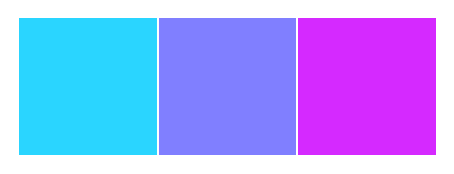

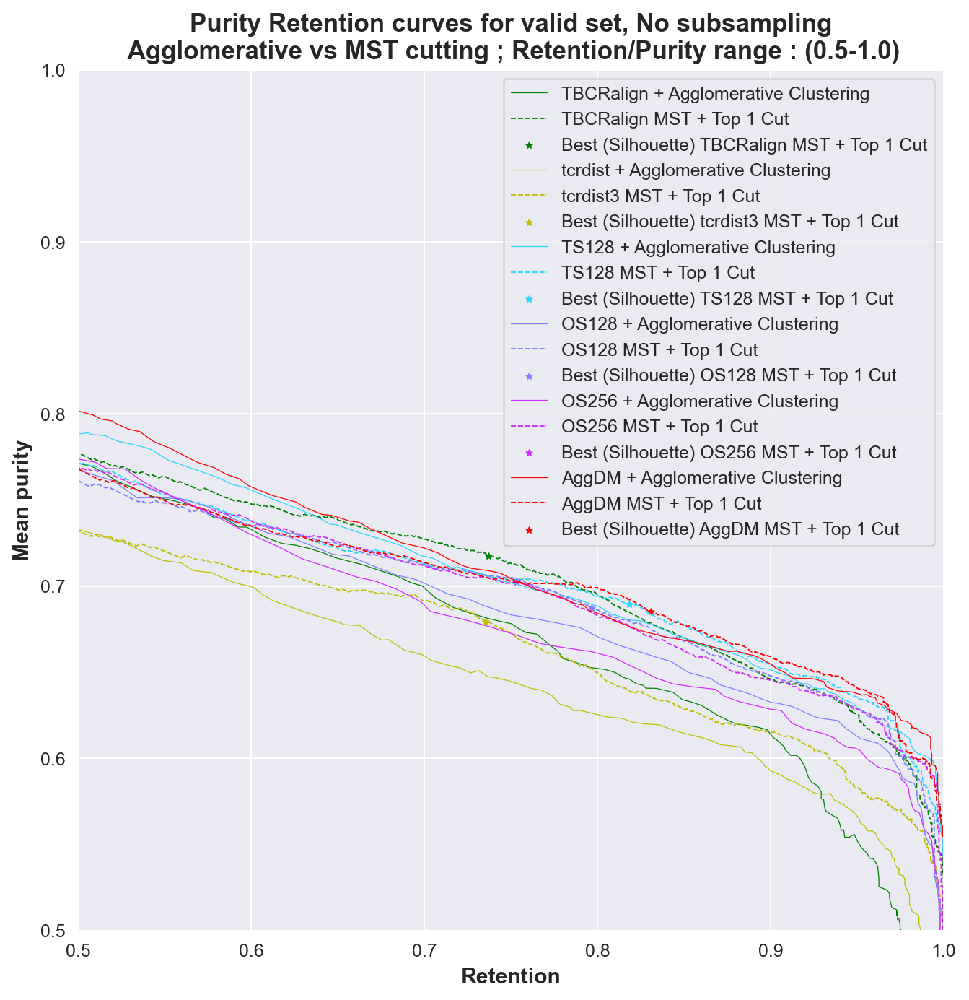

In [757]:
palette=get_palette('cool', 3)
sns.palplot(palette)
c_ts128 = palette[0]
c_os128 = palette[1]
c_os256 = palette[2]
c_agg = 'r'
c_tbcr='g'
c_tcrdist='y'
f,a = plt.subplots(1,1, figsize=(8.6,8.6))
lw=.75
marker_size=12
marker='*'
# TBCRalign
a.plot(tbcr_cluster_testset['retention'].values[1:-1], tbcr_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TBCRalign + Agglomerative Clustering', lw=0.5, ls='-', c=c_tbcr)
a.plot(tbcr_sh_rets, tbcr_sh_purities, label = 'TBCRalign MST + Top 1 Cut', lw = lw, ls='--', c=c_tbcr)
a.scatter(best_tbcr_sh[0], best_tbcr_sh[1], c=c_tbcr, label = 'Best (Silhouette) TBCRalign MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)

# tcrdist3
a.plot(tcrdist_cluster_testset['retention'].values[1:-1], tcrdist_cluster_testset['mean_purity'].values[1:-1], 
       label = 'tcrdist + Agglomerative Clustering', lw=0.5, ls='-', c=c_tcrdist)
a.plot(tcrdist_sh_rets, tcrdist_sh_purities, label = 'tcrdist3 MST + Top 1 Cut', lw = lw, ls='--', c=c_tcrdist)
a.scatter(best_tcrdist_sh[0], best_tcrdist_sh[1], c=c_tcrdist, label = 'Best (Silhouette) tcrdist3 MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)


# TS128
a.plot(ts128_cluster_testset['retention'].values[1:-1], ts128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_ts128)
a.plot(sh_rets_ts128, sh_purities_ts128, label = 'TS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_ts128)
a.scatter(best_sh_ts128[0], best_sh_ts128[1], c=c_ts128, label = 'Best (Silhouette) TS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS128
a.plot(os128_cluster_testset['retention'].values[1:-1], os128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os128)

a.plot(sh_rets_os128, sh_purities_os128, label = 'OS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_os128)
a.scatter(best_sh_os128[0], best_sh_os128[1], c=c_os128, label = 'Best (Silhouette) OS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS256
a.plot(os256_cluster_testset['retention'].values[1:-1], os256_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS256 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os256)

a.plot(sh_rets_os256, sh_purities_os256, label = 'OS256 MST + Top 1 Cut', lw = lw, ls='--', c=c_os256)
a.scatter(best_sh_os256[0], best_sh_os256[1], c=c_os256, label = 'Best (Silhouette) OS256 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# Aggregated
a.plot(agg_cluster_testset['retention'].values[1:-1], agg_cluster_testset['mean_purity'].values[1:-1], 
       label = 'AggDM + Agglomerative Clustering', lw=0.5, ls='-', c=c_agg)

a.plot(sh_rets_agg, sh_purities_agg, label = 'AggDM MST + Top 1 Cut', lw = lw, ls='--', c=c_agg)
a.scatter(best_sh_agg[0], best_sh_agg[1], c=c_agg, label = 'Best (Silhouette) AggDM MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

a.legend()
a.set_ylim([.5,1.])
a.set_xlim([.5,1.])
a.set_xlabel('Retention', fontsize=12, fontweight='semibold')
a.set_ylabel('Mean purity', fontsize=12, fontweight='semibold')
a.set_title('Purity Retention curves for valid set, No subsampling\n Agglomerative vs MST cutting ; Retention/Purity range : (0.5-1.0)', fontweight='semibold', fontsize=14)
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_retpur_curves.png', dpi=200, bbox_inches='tight')

## Test set, 17 peps, no subsample

### Data reading and sorting

In [758]:
import random
seed=1
random.seed(seed)
# easy5peps = exp17.peptide.unique()#['ELAGIGILTV', 'GILGFVFTL', 'LLWNGPMAV', 'RAKFKQLL', 'YLQPRTFLL']
df = exp17.query('partition==1')
df_idx = df['raw_index'].unique()
df.groupby('peptide').count()

,Unnamed: 0.1,Unnamed: 0,A1,A2,A3,B1,B2,B3,allele,partition,binder,origin,original_peptide,raw_index,reference,source_organism,input_type,db
peptide,,,,,,,,,,,,,,,,,,
ATDALMTGF,20,20,20,20,20,20,20,20,20,20,20,20,20,20,0,20,20,20
AVFDRKSDAK,144,144,144,144,144,144,144,144,144,144,144,144,144,144,144,0,144,144
CINGVCWTV,45,45,45,45,45,45,45,45,45,45,45,45,45,45,16,45,45,45
ELAGIGILTV,92,92,92,92,92,92,92,92,92,92,92,92,92,92,92,13,92,92
GILGFVFTL,233,233,233,233,233,233,233,233,233,233,233,233,233,233,233,76,233,233
GLCTLVAML,54,54,54,54,54,54,54,54,54,54,54,54,54,54,54,33,54,54
IVTDFSVIK,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,0,64,64
KLGGALQAK,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,0,180,180
KTFPPTEPK,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24


In [759]:
# Best model picked on validation performance
latent_ts128 = get_latent_df(model_ts128, df)
latent_os128 = get_latent_df(model_os128, df)
latent_os256 = get_latent_df(model_os256, df)
dm_ts128, values_ts128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_ts128, index_col='raw_index')
dm_os128, values_os128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os128, index_col='raw_index')
dm_os256, values_os256, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os256, index_col='raw_index')
# Assert all index are in the same order prior to refiltering+resorting the baselines
assert all(dm_os128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os128.raw_index), 'wtf'
# re-get the baseline and re-filter based on the subset test set
dm_tbcr_testset = dm_tbcr.query('raw_index in @df_idx')
dm_tcrdist_testset = dm_tcrdist.query('raw_index in @df_idx')
# Resort it just so that we can re-use the labels and indices in the same order
dm_tbcr_testset, values_tbcr_testset = resort_baseline(dm_tbcr_testset, dm_ts128, 'raw_index')
dm_tcrdist_testset, values_tcrdist_testset = resort_baseline(dm_tcrdist_testset, dm_ts128, 'raw_index')
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(dm_ts128), len(dm_os128), len(dm_os256))

1470 1470 1470 1470 1470


In [760]:
# Aggregate the "best" model which is the two-stage 128 and the TBCRalign matrix
dm_agg, values_agg = get_agg_matrix(dm_ts128, dm_tbcr_testset)
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(dm_ts128), len(dm_os128), len(dm_os256), len(dm_agg))

1470 1470 1470 1470 1470 1470


### params

In [761]:
initial_cut_threshold=1
initial_cut_method='top'
filename='240715_17peps_nosub_partition1_test_'

### Running the algos for baselines

In [762]:
# TBCRALIGN

G, tree, dist_matrix, values_tbcr_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tbcr_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tbcr_it_scores, tbcr_it_purities, tbcr_it_rets = iterative_size_cut(values_tbcr_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tbcr_sh_scores, tbcr_sh_purities, tbcr_sh_rets = iterative_topn_cut(values_tbcr_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

# Running TCRdist distmatrix
G, tree, dist_matrix, values_tcrdist_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tcrdist_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tcrdist_it_scores, tcrdist_it_purities, tcrdist_it_rets = iterative_size_cut(values_tcrdist_testset, tree, 
                                                                                                                                 initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                 initial_cut_method=initial_cut_method, 
                                                                                                                                 top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tcrdist_sh_scores, tcrdist_sh_purities, tcrdist_sh_rets = iterative_topn_cut(values_tcrdist_testset, tree, 
                                                                                                                                            initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                            initial_cut_method=initial_cut_method, 
                                                                                                                                            top_n=1, which='edge', weighted=True, 
                                                                                                                                            verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

Initial mean purity, silhouette score, retention
0.179 0.0123 1.0
2.1267605633802815 2.5291750503018107
Initial mean purity, silhouette score, retention
0.1758 0.0181 1.0
2.1975560081466394 2.5304878048780486


### Running for VAEs

In [763]:
# Two-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_ts128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_ts128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_ts128, it_purities_ts128, it_rets_ts128 = iterative_size_cut(values_ts128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_ts128, sh_purities_ts128, sh_rets_ts128 = iterative_topn_cut(values_ts128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.2128 0.0151 1.0
2.2193784277879343 2.4663023679417124


In [764]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os128, it_purities_os128, it_rets_os128 = iterative_size_cut(values_os128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os128, sh_purities_os128, sh_rets_os128 = iterative_topn_cut(values_os128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.1944 0.016 1.0
2.1553030303030303 2.503787878787879


In [765]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os256_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os256, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os256, it_purities_os256, it_rets_os256 = iterative_size_cut(values_os256_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os256, sh_purities_os256, sh_rets_os256 = iterative_topn_cut(values_os256_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.1946 0.0204 1.0
2.25891181988743 2.457089552238806


### Run the aggregate

In [766]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_agg_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_agg, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_agg, it_purities_agg, it_rets_agg = iterative_size_cut(values_agg_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_agg, sh_purities_agg, sh_rets_agg = iterative_topn_cut(values_agg_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.2194 0.0126 1.0
2.23731884057971 2.4655797101449277


In [767]:
ts128_cluster_testset = cluster_all_thresholds(values_ts128_testset, values_ts128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os128_cluster_testset = cluster_all_thresholds(values_os128_testset, values_os128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os256_cluster_testset = cluster_all_thresholds(values_os256_testset, values_os256_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tcrdist_cluster_testset = cluster_all_thresholds(values_tcrdist_testset, values_tcrdist_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tbcr_cluster_testset = cluster_all_thresholds(values_tbcr_testset, values_tbcr_testset, labels, encoded_labels, label_encoder, n_jobs=8)
agg_cluster_testset = cluster_all_thresholds(values_agg_testset, values_agg_testset, labels, encoded_labels, label_encoder, n_jobs=8)

HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.05it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:19<00:00, 25.37it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:22<00:00, 21.96it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.77it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.54it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.34it/s]


### silhouette score plots

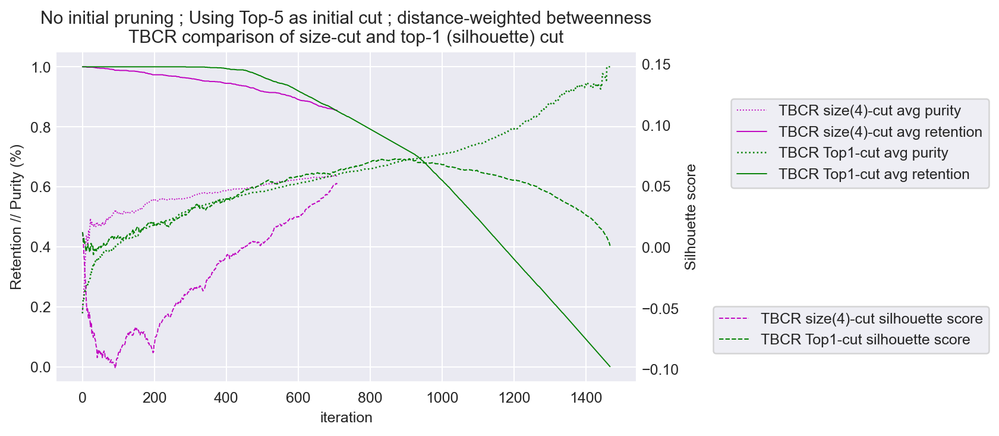

In [768]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\nTBCR comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tbcr_it_purities)), tbcr_it_purities, lw=.75, ls=':', c='m',
       label='TBCR size(4)-cut avg purity')
a.plot(range(len(tbcr_it_rets)), tbcr_it_rets, lw=.75, ls='-', c='m',
       label='TBCR size(4)-cut avg retention')
a2.plot(range(len(tbcr_it_scores)), tbcr_it_scores, lw=.75, ls='--', c='m',
       label='TBCR size(4)-cut silhouette score')

a.plot(range(len(tbcr_sh_purities)), tbcr_sh_purities, lw=1, ls=':', c='g',
       label='TBCR Top1-cut avg purity')
a.plot(range(len(tbcr_sh_rets)), tbcr_sh_rets, lw=.75, ls='-', c='g',
       label='TBCR Top1-cut avg retention')
a2.plot(range(len(tbcr_sh_scores)), tbcr_sh_scores, lw=.8, ls='--', c='g',
       label='TBCR Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}TBCR_silhouette.png', dpi=150, bbox_inches='tight')


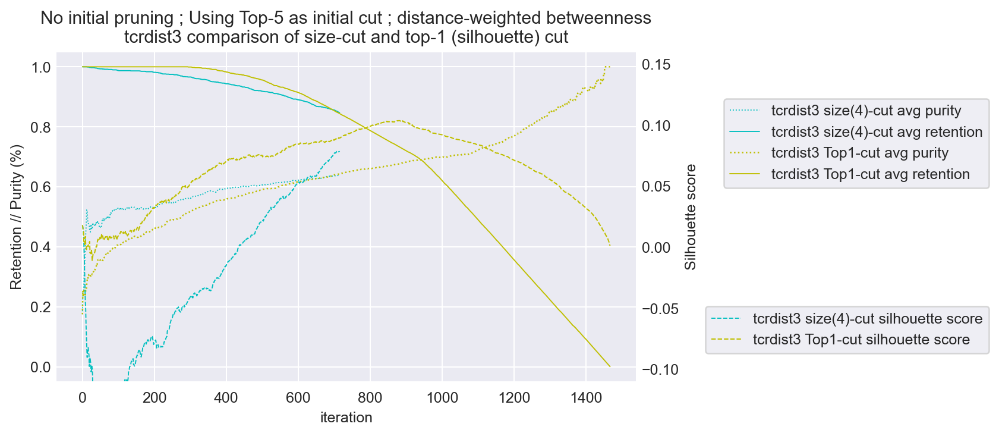

In [769]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\ntcrdist3 comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tcrdist_it_purities)), tcrdist_it_purities, lw=.75, ls=':', c='c',
       label='tcrdist3 size(4)-cut avg purity')
a.plot(range(len(tcrdist_it_rets)), tcrdist_it_rets, lw=.75, ls='-', c='c',
       label='tcrdist3 size(4)-cut avg retention')
a2.plot(range(len(tcrdist_it_scores)), tcrdist_it_scores, lw=.75, ls='--', c='c',
       label='tcrdist3 size(4)-cut silhouette score')

a.plot(range(len(tcrdist_sh_purities)), tcrdist_sh_purities, lw=1, ls=':', c='y',
       label='tcrdist3 Top1-cut avg purity')
a.plot(range(len(tcrdist_sh_rets)), tcrdist_sh_rets, lw=.75, ls='-', c='y',
       label='tcrdist3 Top1-cut avg retention')
a2.plot(range(len(tcrdist_sh_scores)), tcrdist_sh_scores, lw=.8, ls='--', c='y',
       label='tcrdist3 Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}tcrdist3_silhouette.png', dpi=150, bbox_inches='tight')


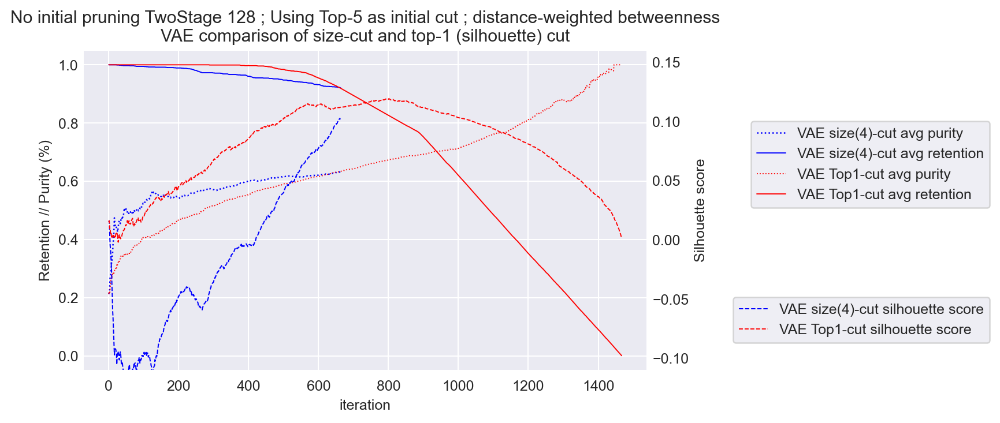

In [770]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning TwoStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_ts128)), it_purities_ts128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_ts128)), it_rets_ts128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_ts128)), it_scores_ts128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_ts128)), sh_purities_ts128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_ts128)), sh_rets_ts128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_ts128)), sh_scores_ts128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_ts128_silhouette.png', dpi=150, bbox_inches='tight')


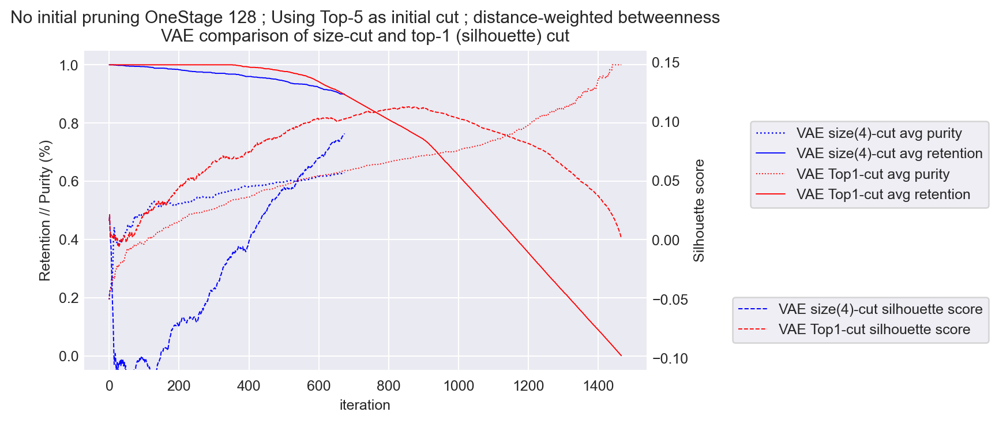

In [771]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os128)), it_purities_os128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os128)), it_rets_os128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os128)), it_scores_os128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os128)), sh_purities_os128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os128)), sh_rets_os128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os128)), sh_scores_os128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os128_silhouette.png', dpi=150, bbox_inches='tight')


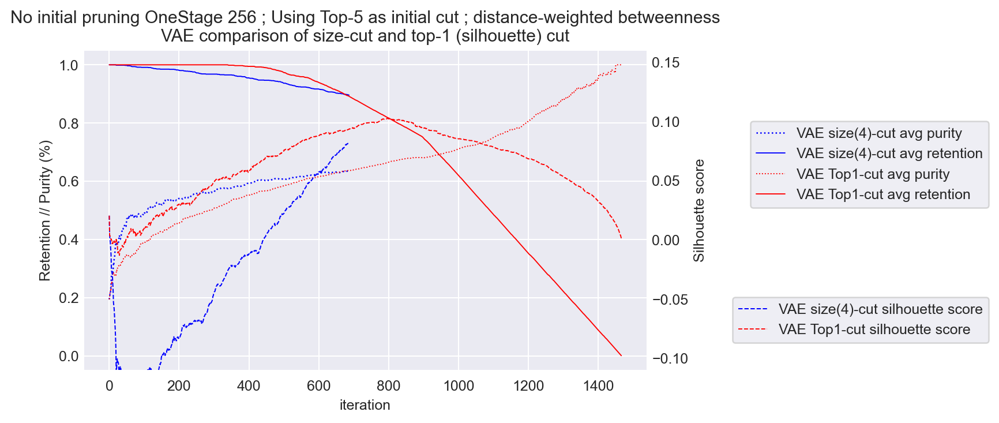

In [772]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 256 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os256)), it_purities_os256, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os256)), it_rets_os256, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os256)), it_scores_os256, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os256)), sh_purities_os256, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os256)), sh_rets_os256, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os256)), sh_scores_os256, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os256_silhouette.png', dpi=150, bbox_inches='tight')


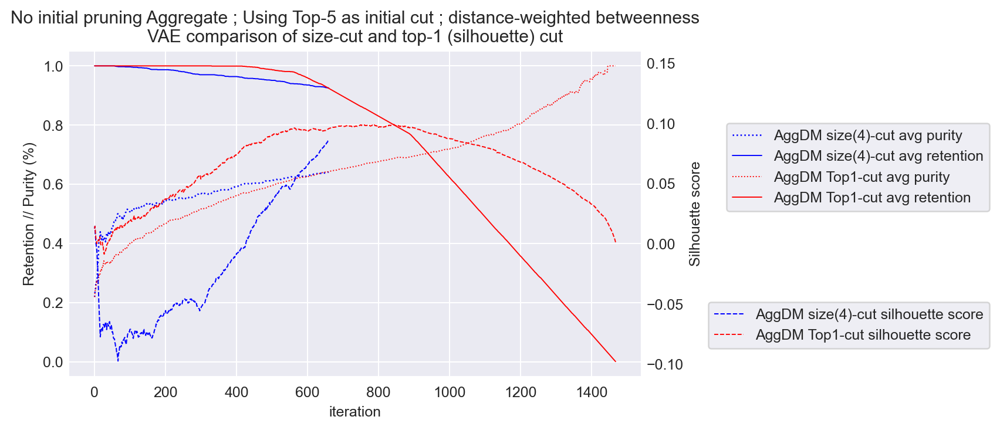

In [773]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning Aggregate ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_agg)), it_purities_agg, lw=1, ls=':', c='b',
       label='AggDM size(4)-cut avg purity')
a.plot(range(len(it_rets_agg)), it_rets_agg, lw=.75, ls='-', c='b',
       label='AggDM size(4)-cut avg retention')
a2.plot(range(len(it_scores_agg)), it_scores_agg, lw=.8, ls='--', c='b',
       label='AggDM size(4)-cut silhouette score')

a.plot(range(len(sh_purities_agg)), sh_purities_agg, lw=.75, ls=':', c='r',
       label='AggDM Top1-cut avg purity')
a.plot(range(len(sh_rets_agg)), sh_rets_agg, lw=.75, ls='-', c='r',
       label='AggDM Top1-cut avg retention')
a2.plot(range(len(sh_scores_agg)), sh_scores_agg, lw=.75, ls='--', c='r',
       label='AggDM Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_agg_silhouette.png', dpi=150, bbox_inches='tight')


### retpur curves

In [774]:
# Identify best point (based on Silhouette score) for each of the 4 conditions and add them as scatter points
best_sh_ts128 = sh_rets_ts128[np.argmax(sh_scores_ts128)], sh_purities_ts128[np.argmax(sh_scores_ts128)]
best_it_ts128 = it_rets_ts128[np.argmax(it_scores_ts128)], it_purities_ts128[np.argmax(it_scores_ts128)]
best_sh_os128 = sh_rets_os128[np.argmax(sh_scores_os128)], sh_purities_os128[np.argmax(sh_scores_os128)]
best_it_os128 = it_rets_os128[np.argmax(it_scores_os128)], it_purities_os128[np.argmax(it_scores_os128)]
best_sh_os256 = sh_rets_os256[np.argmax(sh_scores_os256)], sh_purities_os256[np.argmax(sh_scores_os256)]
best_it_os256 = it_rets_os256[np.argmax(it_scores_os256)], it_purities_os256[np.argmax(it_scores_os256)]
best_sh_agg = sh_rets_agg[np.argmax(sh_scores_agg)], sh_purities_agg[np.argmax(sh_scores_agg)]
best_it_agg = it_rets_agg[np.argmax(it_scores_agg)], it_purities_agg[np.argmax(it_scores_agg)]
best_tbcr_sh = tbcr_sh_rets[np.argmax(tbcr_sh_scores)], tbcr_sh_purities[np.argmax(tbcr_sh_scores)]
best_tbcr_it = tbcr_it_rets[np.argmax(tbcr_it_scores)], tbcr_it_purities[np.argmax(tbcr_it_scores)]
best_tcrdist_sh = tcrdist_sh_rets[np.argmax(tcrdist_sh_scores)], tcrdist_sh_purities[np.argmax(tcrdist_sh_scores)]
best_tcrdist_it = tcrdist_it_rets[np.argmax(tcrdist_it_scores)], tcrdist_it_purities[np.argmax(tcrdist_it_scores)]



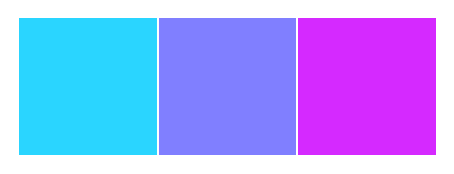

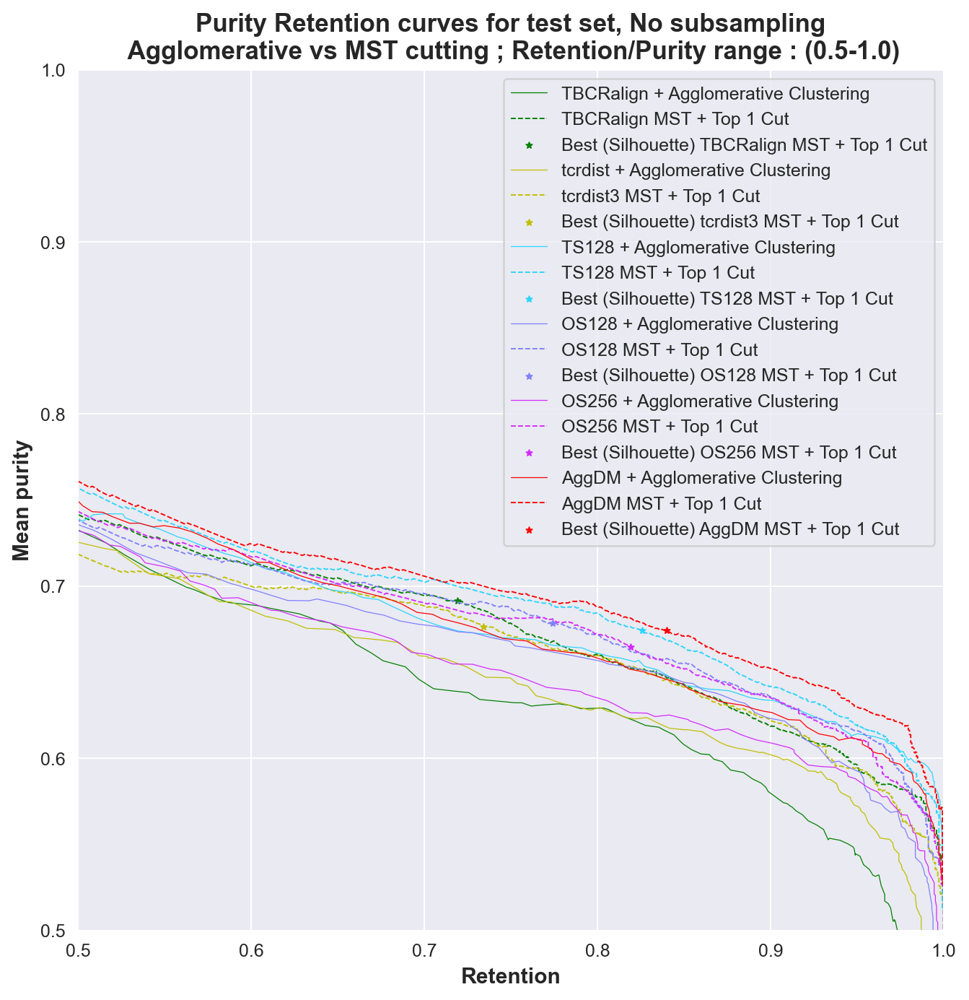

In [775]:
palette=get_palette('cool', 3)
sns.palplot(palette)
c_ts128 = palette[0]
c_os128 = palette[1]
c_os256 = palette[2]
c_agg = 'r'
c_tbcr='g'
c_tcrdist='y'
f,a = plt.subplots(1,1, figsize=(8.6,8.6))
lw=.75
marker_size=12
marker='*'
# TBCRalign
a.plot(tbcr_cluster_testset['retention'].values[1:-1], tbcr_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TBCRalign + Agglomerative Clustering', lw=0.5, ls='-', c=c_tbcr)
a.plot(tbcr_sh_rets, tbcr_sh_purities, label = 'TBCRalign MST + Top 1 Cut', lw = lw, ls='--', c=c_tbcr)
a.scatter(best_tbcr_sh[0], best_tbcr_sh[1], c=c_tbcr, label = 'Best (Silhouette) TBCRalign MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)

# tcrdist3
a.plot(tcrdist_cluster_testset['retention'].values[1:-1], tcrdist_cluster_testset['mean_purity'].values[1:-1], 
       label = 'tcrdist + Agglomerative Clustering', lw=0.5, ls='-', c=c_tcrdist)
a.plot(tcrdist_sh_rets, tcrdist_sh_purities, label = 'tcrdist3 MST + Top 1 Cut', lw = lw, ls='--', c=c_tcrdist)
a.scatter(best_tcrdist_sh[0], best_tcrdist_sh[1], c=c_tcrdist, label = 'Best (Silhouette) tcrdist3 MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)


# TS128
a.plot(ts128_cluster_testset['retention'].values[1:-1], ts128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_ts128)
a.plot(sh_rets_ts128, sh_purities_ts128, label = 'TS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_ts128)
a.scatter(best_sh_ts128[0], best_sh_ts128[1], c=c_ts128, label = 'Best (Silhouette) TS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS128
a.plot(os128_cluster_testset['retention'].values[1:-1], os128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os128)

a.plot(sh_rets_os128, sh_purities_os128, label = 'OS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_os128)
a.scatter(best_sh_os128[0], best_sh_os128[1], c=c_os128, label = 'Best (Silhouette) OS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS256
a.plot(os256_cluster_testset['retention'].values[1:-1], os256_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS256 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os256)

a.plot(sh_rets_os256, sh_purities_os256, label = 'OS256 MST + Top 1 Cut', lw = lw, ls='--', c=c_os256)
a.scatter(best_sh_os256[0], best_sh_os256[1], c=c_os256, label = 'Best (Silhouette) OS256 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# Aggregated
a.plot(agg_cluster_testset['retention'].values[1:-1], agg_cluster_testset['mean_purity'].values[1:-1], 
       label = 'AggDM + Agglomerative Clustering', lw=0.5, ls='-', c=c_agg)

a.plot(sh_rets_agg, sh_purities_agg, label = 'AggDM MST + Top 1 Cut', lw = lw, ls='--', c=c_agg)
a.scatter(best_sh_agg[0], best_sh_agg[1], c=c_agg, label = 'Best (Silhouette) AggDM MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

a.legend()
a.set_ylim([.5,1.])
a.set_xlim([.5,1.])
a.set_xlabel('Retention', fontsize=12, fontweight='semibold')
a.set_ylabel('Mean purity', fontsize=12, fontweight='semibold')
a.set_title('Purity Retention curves for test set, No subsampling\n Agglomerative vs MST cutting ; Retention/Purity range : (0.5-1.0)', fontweight='semibold', fontsize=14)
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_retpur_curves.png', dpi=200, bbox_inches='tight')

## Test set, Subsampled + Filtered to some peps

### Data reading and sorting

In [776]:
import random
seed=1
random.seed(seed)
# See TCRBase detour for exp_filt
print(exp_filt)
df = exp17.query('peptide in @exp_filt and partition==1')
testset_subsample = []
for p in easy5peps:
    tmp = df.query('peptide==@p')
    testset_subsample.append(tmp.sample(min(len(tmp), random.randint(70,90)), random_state=seed))
df = pd.concat(testset_subsample)
df_idx = df['raw_index'].unique()
df.groupby('peptide').count()

Index(['ELAGIGILTV', 'RAKFKQLL', 'GILGFVFTL', 'YLQPRTFLL', 'TTDPSFLGRY',
       'SPRWYFYYL', 'KLGGALQAK', 'AVFDRKSDAK'],
      dtype='object', name='peptide')


,Unnamed: 0.1,Unnamed: 0,A1,A2,A3,B1,B2,B3,allele,partition,binder,origin,original_peptide,raw_index,reference,source_organism,input_type,db
peptide,,,,,,,,,,,,,,,,,,
ELAGIGILTV,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,11,74,74
GILGFVFTL,88,88,88,88,88,88,88,88,88,88,88,88,88,88,88,34,88,88
RAKFKQLL,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78,0,78,78
YLQPRTFLL,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73


In [777]:
# Best model picked on validation performance
latent_ts128 = get_latent_df(model_ts128, df)
latent_os128 = get_latent_df(model_os128, df)
latent_os256 = get_latent_df(model_os256, df)
dm_ts128, values_ts128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_ts128, index_col='raw_index')
dm_os128, values_os128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os128, index_col='raw_index')
dm_os256, values_os256, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os256, index_col='raw_index')
# Assert all index are in the same order prior to refiltering+resorting the baselines
assert all(dm_os128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os128.raw_index), 'wtf'
# re-get the baseline and re-filter based on the subset test set
dm_tbcr_testset = dm_tbcr.query('raw_index in @df_idx')
dm_tcrdist_testset = dm_tcrdist.query('raw_index in @df_idx')
# Resort it just so that we can re-use the labels and indices in the same order
dm_tbcr_testset, values_tbcr_testset = resort_baseline(dm_tbcr_testset, dm_ts128, 'raw_index')
dm_tcrdist_testset, values_tcrdist_testset = resort_baseline(dm_tcrdist_testset, dm_ts128, 'raw_index')
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(dm_ts128), len(dm_os128), len(dm_os256))

313 313 313 313 313


In [778]:
# Aggregate the "best" model which is the two-stage 128 and the TBCRalign matrix
dm_agg, values_agg = get_agg_matrix(dm_ts128, dm_tbcr_testset)
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(dm_ts128), len(dm_os128), len(dm_os256), len(dm_agg))

313 313 313 313 313 313


### params

In [779]:
initial_cut_threshold=1
initial_cut_method='top'
filename='240715_8peps_subsampled_partition1_test_'

### Running the algos for baselines

In [780]:
# TBCRALIGN

G, tree, dist_matrix, values_tbcr_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tbcr_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tbcr_it_scores, tbcr_it_purities, tbcr_it_rets = iterative_size_cut(values_tbcr_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tbcr_sh_scores, tbcr_sh_purities, tbcr_sh_rets = iterative_topn_cut(values_tbcr_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

# Running TCRdist distmatrix
G, tree, dist_matrix, values_tcrdist_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tcrdist_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tcrdist_it_scores, tcrdist_it_purities, tcrdist_it_rets = iterative_size_cut(values_tcrdist_testset, tree, 
                                                                                                                                 initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                 initial_cut_method=initial_cut_method, 
                                                                                                                                 top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tcrdist_sh_scores, tcrdist_sh_purities, tcrdist_sh_rets = iterative_topn_cut(values_tcrdist_testset, tree, 
                                                                                                                                            initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                            initial_cut_method=initial_cut_method, 
                                                                                                                                            top_n=1, which='edge', weighted=True, 
                                                                                                                                            verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

Initial mean purity, silhouette score, retention
0.4373 0.0537 1.0
2.284313725490196 2.5686274509803924
Initial mean purity, silhouette score, retention
0.4003 0.0404 1.0
2.342857142857143 2.466666666666667


### Running for VAEs

In [781]:
# Two-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_ts128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_ts128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_ts128, it_purities_ts128, it_rets_ts128 = iterative_size_cut(values_ts128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_ts128, sh_purities_ts128, sh_rets_ts128 = iterative_topn_cut(values_ts128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.426 0.0523 1.0
2.262135922330097 2.576923076923077


In [782]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os128, it_purities_os128, it_rets_os128 = iterative_size_cut(values_os128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os128, sh_purities_os128, sh_rets_os128 = iterative_topn_cut(values_os128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.381 0.0481 1.0
2.2589285714285716 2.4690265486725664


In [783]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os256_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os256, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os256, it_purities_os256, it_rets_os256 = iterative_size_cut(values_os256_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os256, sh_purities_os256, sh_rets_os256 = iterative_topn_cut(values_os256_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.4103 0.0553 1.0
2.3106796116504853 2.548076923076923


### Run the aggregate

In [784]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_agg_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_agg, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_agg, it_purities_agg, it_rets_agg = iterative_size_cut(values_agg_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_agg, sh_purities_agg, sh_rets_agg = iterative_topn_cut(values_agg_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.3954 0.0593 1.0
2.2660550458715596 2.5454545454545454


In [785]:
ts128_cluster_testset = cluster_all_thresholds(values_ts128_testset, values_ts128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os128_cluster_testset = cluster_all_thresholds(values_os128_testset, values_os128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os256_cluster_testset = cluster_all_thresholds(values_os256_testset, values_os256_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tcrdist_cluster_testset = cluster_all_thresholds(values_tcrdist_testset, values_tcrdist_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tbcr_cluster_testset = cluster_all_thresholds(values_tbcr_testset, values_tbcr_testset, labels, encoded_labels, label_encoder, n_jobs=8)
agg_cluster_testset = cluster_all_thresholds(values_agg_testset, values_agg_testset, labels, encoded_labels, label_encoder, n_jobs=8)

HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 161.56it/s]


HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 180.55it/s]


HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 185.72it/s]


HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 208.28it/s]


HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 218.87it/s]


HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 184.43it/s]


### silhouette score plots

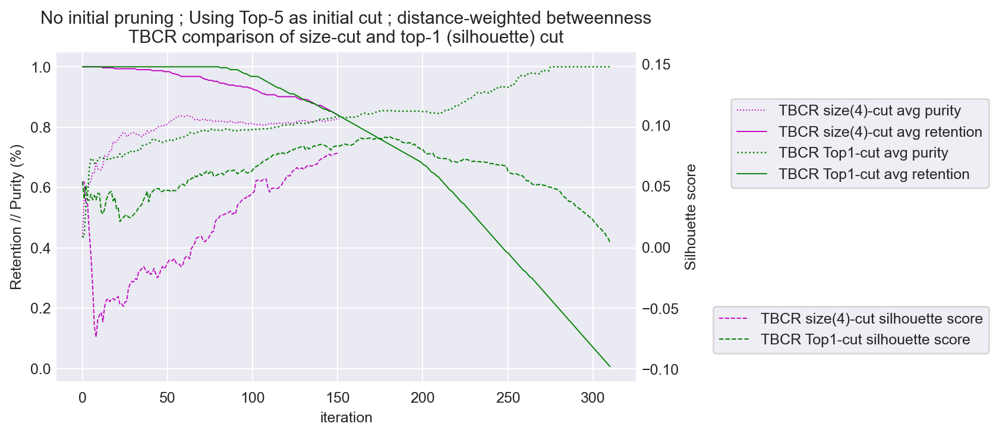

In [786]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\nTBCR comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tbcr_it_purities)), tbcr_it_purities, lw=.75, ls=':', c='m',
       label='TBCR size(4)-cut avg purity')
a.plot(range(len(tbcr_it_rets)), tbcr_it_rets, lw=.75, ls='-', c='m',
       label='TBCR size(4)-cut avg retention')
a2.plot(range(len(tbcr_it_scores)), tbcr_it_scores, lw=.75, ls='--', c='m',
       label='TBCR size(4)-cut silhouette score')

a.plot(range(len(tbcr_sh_purities)), tbcr_sh_purities, lw=1, ls=':', c='g',
       label='TBCR Top1-cut avg purity')
a.plot(range(len(tbcr_sh_rets)), tbcr_sh_rets, lw=.75, ls='-', c='g',
       label='TBCR Top1-cut avg retention')
a2.plot(range(len(tbcr_sh_scores)), tbcr_sh_scores, lw=.8, ls='--', c='g',
       label='TBCR Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}TBCR_silhouette.png', dpi=150, bbox_inches='tight')


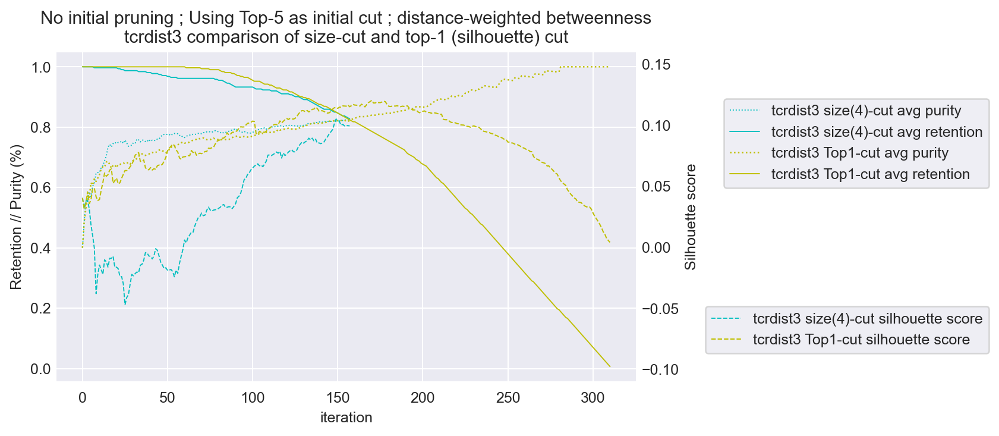

In [787]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\ntcrdist3 comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tcrdist_it_purities)), tcrdist_it_purities, lw=.75, ls=':', c='c',
       label='tcrdist3 size(4)-cut avg purity')
a.plot(range(len(tcrdist_it_rets)), tcrdist_it_rets, lw=.75, ls='-', c='c',
       label='tcrdist3 size(4)-cut avg retention')
a2.plot(range(len(tcrdist_it_scores)), tcrdist_it_scores, lw=.75, ls='--', c='c',
       label='tcrdist3 size(4)-cut silhouette score')

a.plot(range(len(tcrdist_sh_purities)), tcrdist_sh_purities, lw=1, ls=':', c='y',
       label='tcrdist3 Top1-cut avg purity')
a.plot(range(len(tcrdist_sh_rets)), tcrdist_sh_rets, lw=.75, ls='-', c='y',
       label='tcrdist3 Top1-cut avg retention')
a2.plot(range(len(tcrdist_sh_scores)), tcrdist_sh_scores, lw=.8, ls='--', c='y',
       label='tcrdist3 Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}tcrdist3_silhouette.png', dpi=150, bbox_inches='tight')


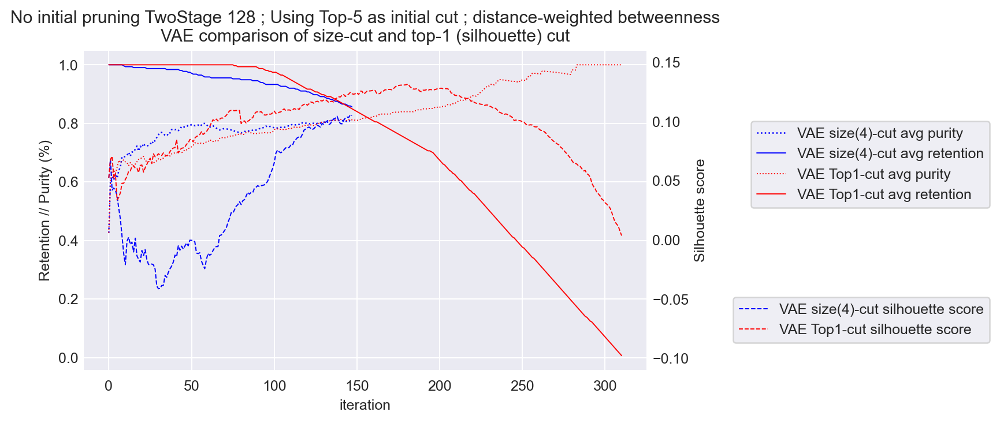

In [788]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning TwoStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_ts128)), it_purities_ts128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_ts128)), it_rets_ts128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_ts128)), it_scores_ts128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_ts128)), sh_purities_ts128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_ts128)), sh_rets_ts128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_ts128)), sh_scores_ts128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_ts128_silhouette.png', dpi=150, bbox_inches='tight')


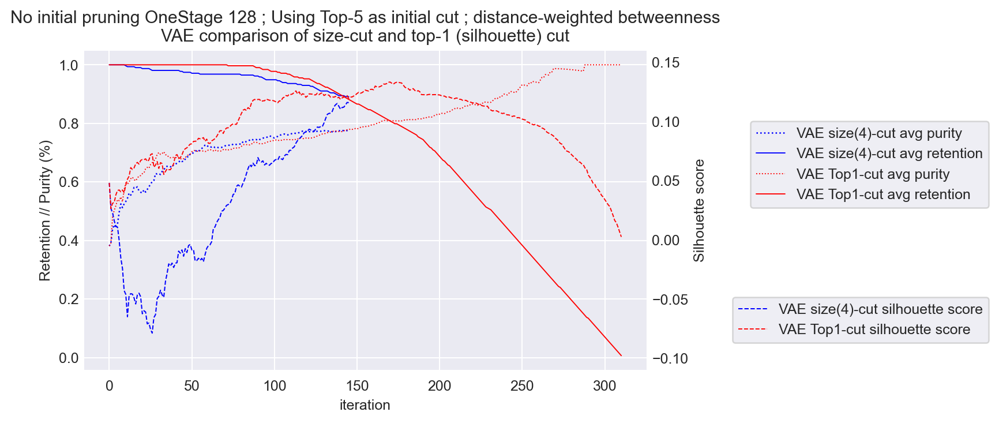

In [789]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os128)), it_purities_os128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os128)), it_rets_os128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os128)), it_scores_os128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os128)), sh_purities_os128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os128)), sh_rets_os128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os128)), sh_scores_os128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os128_silhouette.png', dpi=150, bbox_inches='tight')


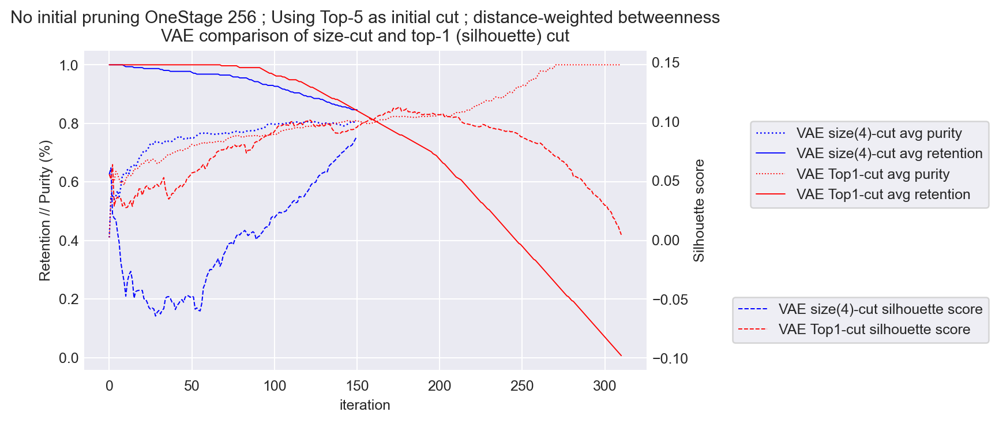

In [790]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 256 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os256)), it_purities_os256, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os256)), it_rets_os256, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os256)), it_scores_os256, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os256)), sh_purities_os256, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os256)), sh_rets_os256, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os256)), sh_scores_os256, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os256_silhouette.png', dpi=150, bbox_inches='tight')


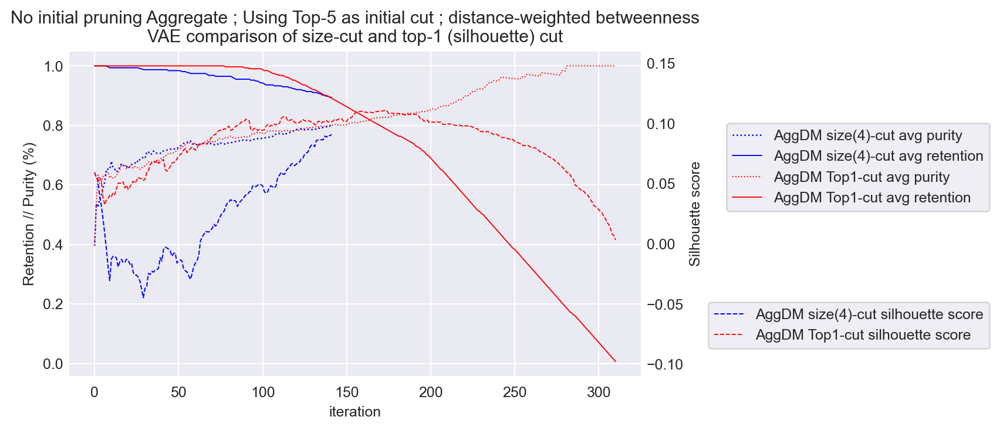

In [791]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning Aggregate ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_agg)), it_purities_agg, lw=1, ls=':', c='b',
       label='AggDM size(4)-cut avg purity')
a.plot(range(len(it_rets_agg)), it_rets_agg, lw=.75, ls='-', c='b',
       label='AggDM size(4)-cut avg retention')
a2.plot(range(len(it_scores_agg)), it_scores_agg, lw=.8, ls='--', c='b',
       label='AggDM size(4)-cut silhouette score')

a.plot(range(len(sh_purities_agg)), sh_purities_agg, lw=.75, ls=':', c='r',
       label='AggDM Top1-cut avg purity')
a.plot(range(len(sh_rets_agg)), sh_rets_agg, lw=.75, ls='-', c='r',
       label='AggDM Top1-cut avg retention')
a2.plot(range(len(sh_scores_agg)), sh_scores_agg, lw=.75, ls='--', c='r',
       label='AggDM Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_agg_silhouette.png', dpi=150, bbox_inches='tight')


### retpur curves

In [792]:
# Identify best point (based on Silhouette score) for each of the 4 conditions and add them as scatter points
best_sh_ts128 = sh_rets_ts128[np.argmax(sh_scores_ts128)], sh_purities_ts128[np.argmax(sh_scores_ts128)]
best_it_ts128 = it_rets_ts128[np.argmax(it_scores_ts128)], it_purities_ts128[np.argmax(it_scores_ts128)]
best_sh_os128 = sh_rets_os128[np.argmax(sh_scores_os128)], sh_purities_os128[np.argmax(sh_scores_os128)]
best_it_os128 = it_rets_os128[np.argmax(it_scores_os128)], it_purities_os128[np.argmax(it_scores_os128)]
best_sh_os256 = sh_rets_os256[np.argmax(sh_scores_os256)], sh_purities_os256[np.argmax(sh_scores_os256)]
best_it_os256 = it_rets_os256[np.argmax(it_scores_os256)], it_purities_os256[np.argmax(it_scores_os256)]
best_sh_agg = sh_rets_agg[np.argmax(sh_scores_agg)], sh_purities_agg[np.argmax(sh_scores_agg)]
best_it_agg = it_rets_agg[np.argmax(it_scores_agg)], it_purities_agg[np.argmax(it_scores_agg)]
best_tbcr_sh = tbcr_sh_rets[np.argmax(tbcr_sh_scores)], tbcr_sh_purities[np.argmax(tbcr_sh_scores)]
best_tbcr_it = tbcr_it_rets[np.argmax(tbcr_it_scores)], tbcr_it_purities[np.argmax(tbcr_it_scores)]
best_tcrdist_sh = tcrdist_sh_rets[np.argmax(tcrdist_sh_scores)], tcrdist_sh_purities[np.argmax(tcrdist_sh_scores)]
best_tcrdist_it = tcrdist_it_rets[np.argmax(tcrdist_it_scores)], tcrdist_it_purities[np.argmax(tcrdist_it_scores)]



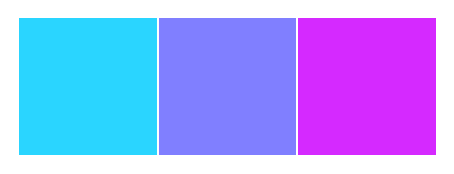

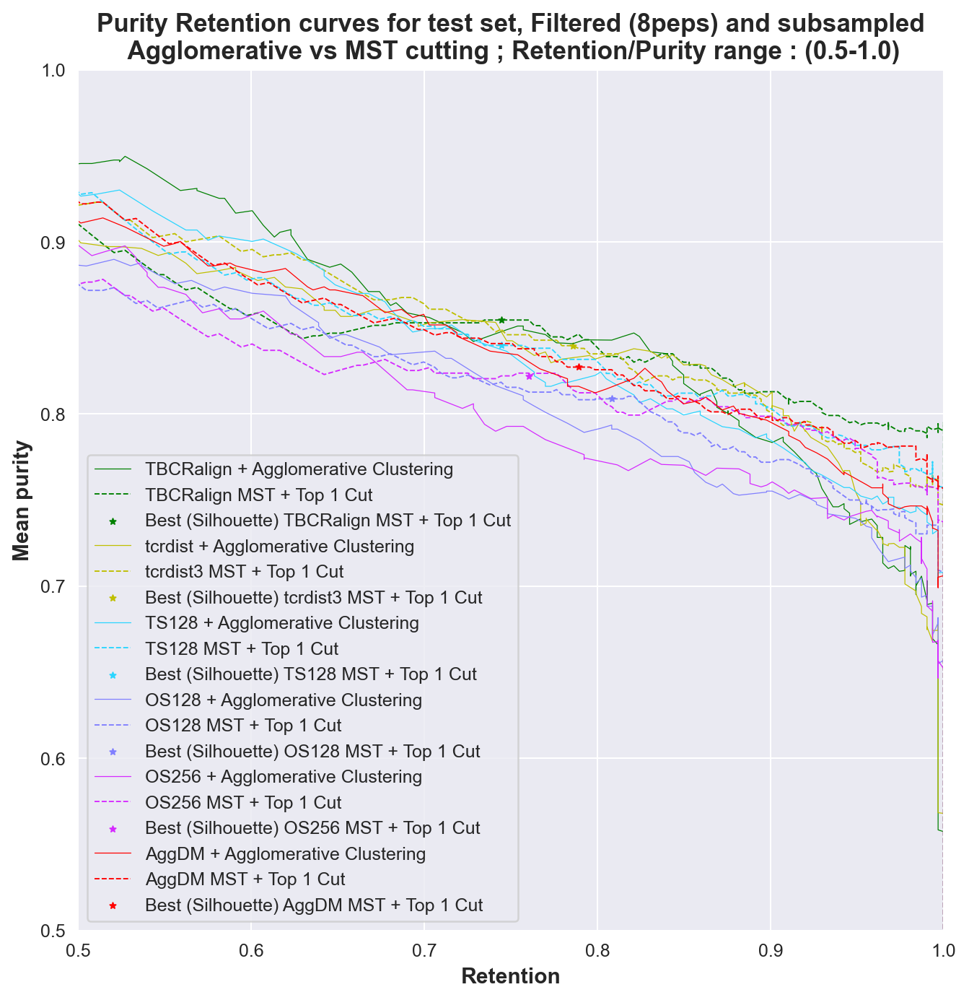

In [793]:
palette=get_palette('cool', 3)
sns.palplot(palette)
c_ts128 = palette[0]
c_os128 = palette[1]
c_os256 = palette[2]
c_agg = 'r'
c_tbcr='g'
c_tcrdist='y'
f,a = plt.subplots(1,1, figsize=(8.6,8.6))
lw=.75
marker_size=12
marker='*'
# TBCRalign
a.plot(tbcr_cluster_testset['retention'].values[1:-1], tbcr_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TBCRalign + Agglomerative Clustering', lw=0.5, ls='-', c=c_tbcr)
a.plot(tbcr_sh_rets, tbcr_sh_purities, label = 'TBCRalign MST + Top 1 Cut', lw = lw, ls='--', c=c_tbcr)
a.scatter(best_tbcr_sh[0], best_tbcr_sh[1], c=c_tbcr, label = 'Best (Silhouette) TBCRalign MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)

# tcrdist3
a.plot(tcrdist_cluster_testset['retention'].values[1:-1], tcrdist_cluster_testset['mean_purity'].values[1:-1], 
       label = 'tcrdist + Agglomerative Clustering', lw=0.5, ls='-', c=c_tcrdist)
a.plot(tcrdist_sh_rets, tcrdist_sh_purities, label = 'tcrdist3 MST + Top 1 Cut', lw = lw, ls='--', c=c_tcrdist)
a.scatter(best_tcrdist_sh[0], best_tcrdist_sh[1], c=c_tcrdist, label = 'Best (Silhouette) tcrdist3 MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)


# TS128
a.plot(ts128_cluster_testset['retention'].values[1:-1], ts128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_ts128)
a.plot(sh_rets_ts128, sh_purities_ts128, label = 'TS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_ts128)
a.scatter(best_sh_ts128[0], best_sh_ts128[1], c=c_ts128, label = 'Best (Silhouette) TS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS128
a.plot(os128_cluster_testset['retention'].values[1:-1], os128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os128)

a.plot(sh_rets_os128, sh_purities_os128, label = 'OS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_os128)
a.scatter(best_sh_os128[0], best_sh_os128[1], c=c_os128, label = 'Best (Silhouette) OS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS256
a.plot(os256_cluster_testset['retention'].values[1:-1], os256_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS256 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os256)

a.plot(sh_rets_os256, sh_purities_os256, label = 'OS256 MST + Top 1 Cut', lw = lw, ls='--', c=c_os256)
a.scatter(best_sh_os256[0], best_sh_os256[1], c=c_os256, label = 'Best (Silhouette) OS256 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# Aggregated
a.plot(agg_cluster_testset['retention'].values[1:-1], agg_cluster_testset['mean_purity'].values[1:-1], 
       label = 'AggDM + Agglomerative Clustering', lw=0.5, ls='-', c=c_agg)

a.plot(sh_rets_agg, sh_purities_agg, label = 'AggDM MST + Top 1 Cut', lw = lw, ls='--', c=c_agg)
a.scatter(best_sh_agg[0], best_sh_agg[1], c=c_agg, label = 'Best (Silhouette) AggDM MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

a.legend()
a.set_ylim([.5,1.])
a.set_xlim([.5,1.])
a.set_xlabel('Retention', fontsize=12, fontweight='semibold')
a.set_ylabel('Mean purity', fontsize=12, fontweight='semibold')
a.set_title('Purity Retention curves for test set, Filtered (8peps) and subsampled\n Agglomerative vs MST cutting ; Retention/Purity range : (0.5-1.0)', fontweight='semibold', fontsize=14)
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_retpur_curves.png', dpi=200, bbox_inches='tight')

## Valid set, Subsampled + Filtered to some peps

### Data reading and sorting

In [794]:
import random
seed=1
random.seed(seed)
# See TCRBase detour for exp_filt
print(exp_filt)
df = exp17.query('peptide in @exp_filt and partition==0')
testset_subsample = []
for p in easy5peps:
    tmp = df.query('peptide==@p')
    testset_subsample.append(tmp.sample(min(len(tmp), random.randint(70,90)), random_state=seed))
df = pd.concat(testset_subsample)
df_idx = df['raw_index'].unique()
df.groupby('peptide').count()

Index(['ELAGIGILTV', 'RAKFKQLL', 'GILGFVFTL', 'YLQPRTFLL', 'TTDPSFLGRY',
       'SPRWYFYYL', 'KLGGALQAK', 'AVFDRKSDAK'],
      dtype='object', name='peptide')


,Unnamed: 0.1,Unnamed: 0,A1,A2,A3,B1,B2,B3,allele,partition,binder,origin,original_peptide,raw_index,reference,source_organism,input_type,db
peptide,,,,,,,,,,,,,,,,,,
ELAGIGILTV,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,6,74,74
GILGFVFTL,88,88,88,88,88,88,88,88,88,88,88,88,88,88,88,32,88,88
RAKFKQLL,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78,0,78,78
YLQPRTFLL,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73,73


In [795]:
# Best model picked on validation performance
latent_ts128 = get_latent_df(model_ts128, df)
latent_os128 = get_latent_df(model_os128, df)
latent_os256 = get_latent_df(model_os256, df)
dm_ts128, values_ts128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_ts128, index_col='raw_index')
dm_os128, values_os128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os128, index_col='raw_index')
dm_os256, values_os256, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os256, index_col='raw_index')
# Assert all index are in the same order prior to refiltering+resorting the baselines
assert all(dm_os128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os128.raw_index), 'wtf'
# re-get the baseline and re-filter based on the subset test set
dm_tbcr_testset = dm_tbcr.query('raw_index in @df_idx')
dm_tcrdist_testset = dm_tcrdist.query('raw_index in @df_idx')
# Resort it just so that we can re-use the labels and indices in the same order
dm_tbcr_testset, values_tbcr_testset = resort_baseline(dm_tbcr_testset, dm_ts128, 'raw_index')
dm_tcrdist_testset, values_tcrdist_testset = resort_baseline(dm_tcrdist_testset, dm_ts128, 'raw_index')
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(dm_ts128), len(dm_os128), len(dm_os256))

313 313 313 313 313


In [796]:
# Aggregate the "best" model which is the two-stage 128 and the TBCRalign matrix
dm_agg, values_agg = get_agg_matrix(dm_ts128, dm_tbcr_testset)
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(dm_ts128), len(dm_os128), len(dm_os256), len(dm_agg))

313 313 313 313 313 313


### params

In [797]:
initial_cut_threshold=1
initial_cut_method='top'
filename='240715_8peps_subsampled_partition0_validation_'

### Running the algos for baselines

In [798]:
# TBCRALIGN

G, tree, dist_matrix, values_tbcr_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tbcr_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tbcr_it_scores, tbcr_it_purities, tbcr_it_rets = iterative_size_cut(values_tbcr_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tbcr_sh_scores, tbcr_sh_purities, tbcr_sh_rets = iterative_topn_cut(values_tbcr_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

# Running TCRdist distmatrix
G, tree, dist_matrix, values_tcrdist_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tcrdist_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tcrdist_it_scores, tcrdist_it_purities, tcrdist_it_rets = iterative_size_cut(values_tcrdist_testset, tree, 
                                                                                                                                 initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                 initial_cut_method=initial_cut_method, 
                                                                                                                                 top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tcrdist_sh_scores, tcrdist_sh_purities, tcrdist_sh_rets = iterative_topn_cut(values_tcrdist_testset, tree, 
                                                                                                                                            initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                            initial_cut_method=initial_cut_method, 
                                                                                                                                            top_n=1, which='edge', weighted=True, 
                                                                                                                                            verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

Initial mean purity, silhouette score, retention
0.4514 0.0459 1.0
2.2545454545454544 2.518181818181818
Initial mean purity, silhouette score, retention
0.411 0.0423 1.0
2.308411214953271 2.5462962962962963


### Running for VAEs

In [799]:
# Two-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_ts128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_ts128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_ts128, it_purities_ts128, it_rets_ts128 = iterative_size_cut(values_ts128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_ts128, sh_purities_ts128, sh_rets_ts128 = iterative_topn_cut(values_ts128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.4632 0.0607 1.0
2.324561403508772 2.4695652173913043


In [800]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os128, it_purities_os128, it_rets_os128 = iterative_size_cut(values_os128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os128, sh_purities_os128, sh_rets_os128 = iterative_topn_cut(values_os128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.4282 0.0408 1.0
2.3392857142857144 2.52212389380531


In [801]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os256_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os256, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os256, it_purities_os256, it_rets_os256 = iterative_size_cut(values_os256_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os256, sh_purities_os256, sh_rets_os256 = iterative_topn_cut(values_os256_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.4269 0.0671 1.0
2.293577981651376 2.541284403669725


### Run the aggregate

In [802]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_agg_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_agg, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_agg, it_purities_agg, it_rets_agg = iterative_size_cut(values_agg_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_agg, sh_purities_agg, sh_rets_agg = iterative_topn_cut(values_agg_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.426 0.0457 1.0
2.211864406779661 2.457627118644068


In [803]:
ts128_cluster_testset = cluster_all_thresholds(values_ts128_testset, values_ts128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os128_cluster_testset = cluster_all_thresholds(values_os128_testset, values_os128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os256_cluster_testset = cluster_all_thresholds(values_os256_testset, values_os256_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tcrdist_cluster_testset = cluster_all_thresholds(values_tcrdist_testset, values_tcrdist_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tbcr_cluster_testset = cluster_all_thresholds(values_tbcr_testset, values_tbcr_testset, labels, encoded_labels, label_encoder, n_jobs=8)
agg_cluster_testset = cluster_all_thresholds(values_agg_testset, values_agg_testset, labels, encoded_labels, label_encoder, n_jobs=8)

HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 173.18it/s]


HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 175.03it/s]


HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 175.19it/s]


HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 220.76it/s]


HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 222.99it/s]


HERE


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 182.37it/s]


### silhouette score plots

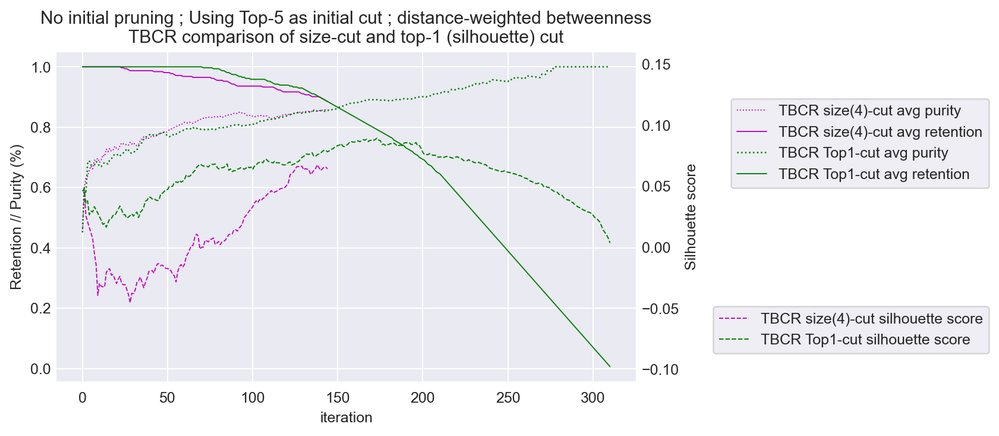

In [804]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\nTBCR comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tbcr_it_purities)), tbcr_it_purities, lw=.75, ls=':', c='m',
       label='TBCR size(4)-cut avg purity')
a.plot(range(len(tbcr_it_rets)), tbcr_it_rets, lw=.75, ls='-', c='m',
       label='TBCR size(4)-cut avg retention')
a2.plot(range(len(tbcr_it_scores)), tbcr_it_scores, lw=.75, ls='--', c='m',
       label='TBCR size(4)-cut silhouette score')

a.plot(range(len(tbcr_sh_purities)), tbcr_sh_purities, lw=1, ls=':', c='g',
       label='TBCR Top1-cut avg purity')
a.plot(range(len(tbcr_sh_rets)), tbcr_sh_rets, lw=.75, ls='-', c='g',
       label='TBCR Top1-cut avg retention')
a2.plot(range(len(tbcr_sh_scores)), tbcr_sh_scores, lw=.8, ls='--', c='g',
       label='TBCR Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}TBCR_silhouette.png', dpi=150, bbox_inches='tight')


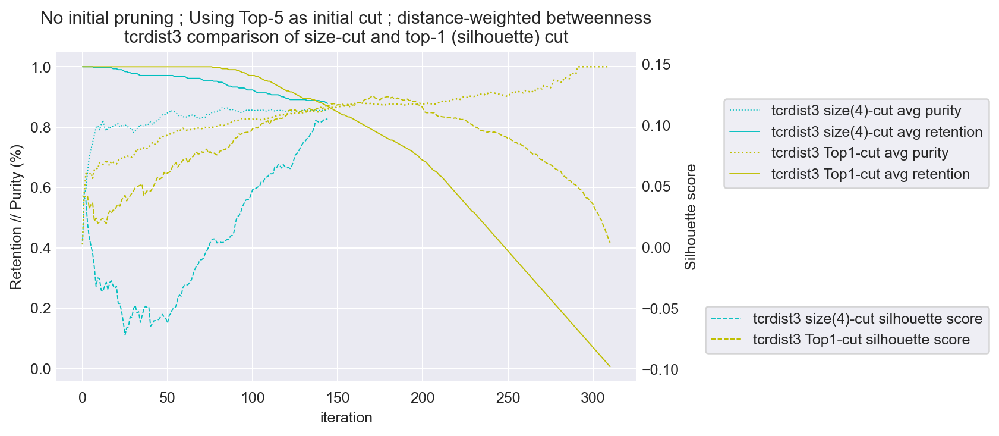

In [805]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\ntcrdist3 comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tcrdist_it_purities)), tcrdist_it_purities, lw=.75, ls=':', c='c',
       label='tcrdist3 size(4)-cut avg purity')
a.plot(range(len(tcrdist_it_rets)), tcrdist_it_rets, lw=.75, ls='-', c='c',
       label='tcrdist3 size(4)-cut avg retention')
a2.plot(range(len(tcrdist_it_scores)), tcrdist_it_scores, lw=.75, ls='--', c='c',
       label='tcrdist3 size(4)-cut silhouette score')

a.plot(range(len(tcrdist_sh_purities)), tcrdist_sh_purities, lw=1, ls=':', c='y',
       label='tcrdist3 Top1-cut avg purity')
a.plot(range(len(tcrdist_sh_rets)), tcrdist_sh_rets, lw=.75, ls='-', c='y',
       label='tcrdist3 Top1-cut avg retention')
a2.plot(range(len(tcrdist_sh_scores)), tcrdist_sh_scores, lw=.8, ls='--', c='y',
       label='tcrdist3 Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}tcrdist3_silhouette.png', dpi=150, bbox_inches='tight')


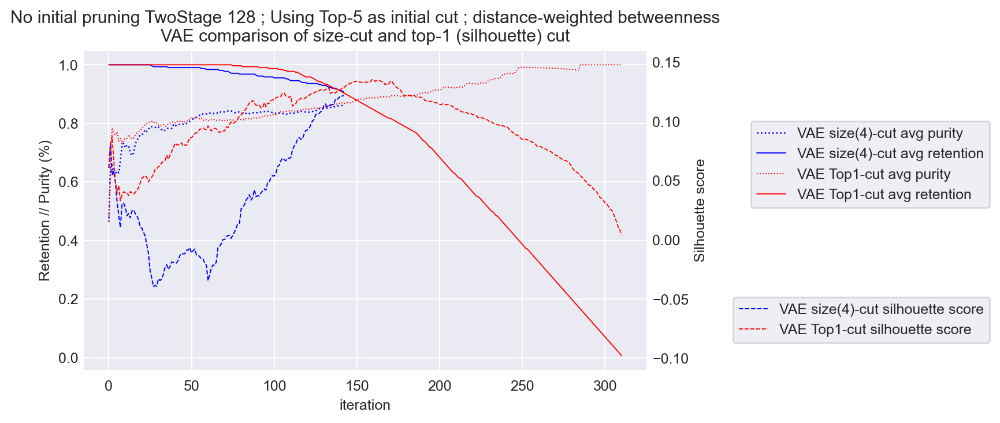

In [806]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning TwoStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_ts128)), it_purities_ts128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_ts128)), it_rets_ts128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_ts128)), it_scores_ts128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_ts128)), sh_purities_ts128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_ts128)), sh_rets_ts128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_ts128)), sh_scores_ts128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_ts128_silhouette.png', dpi=150, bbox_inches='tight')


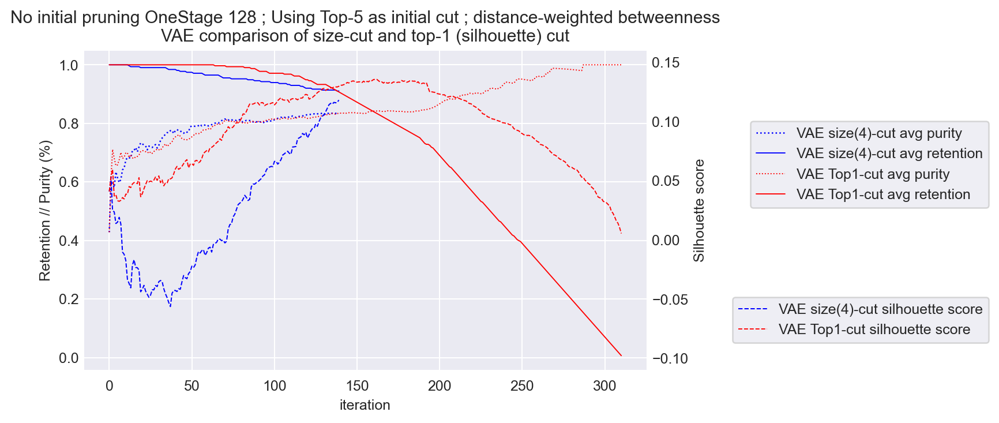

In [807]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os128)), it_purities_os128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os128)), it_rets_os128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os128)), it_scores_os128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os128)), sh_purities_os128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os128)), sh_rets_os128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os128)), sh_scores_os128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os128_silhouette.png', dpi=150, bbox_inches='tight')


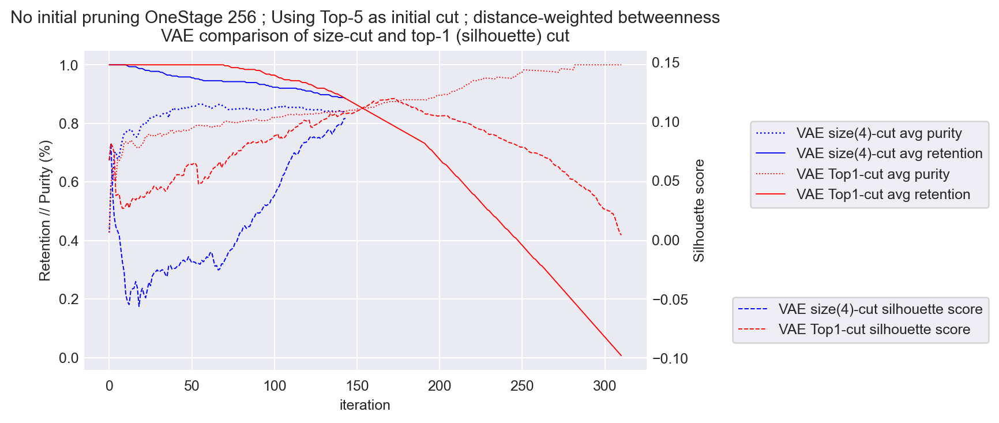

In [808]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 256 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os256)), it_purities_os256, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os256)), it_rets_os256, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os256)), it_scores_os256, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os256)), sh_purities_os256, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os256)), sh_rets_os256, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os256)), sh_scores_os256, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os256_silhouette.png', dpi=150, bbox_inches='tight')


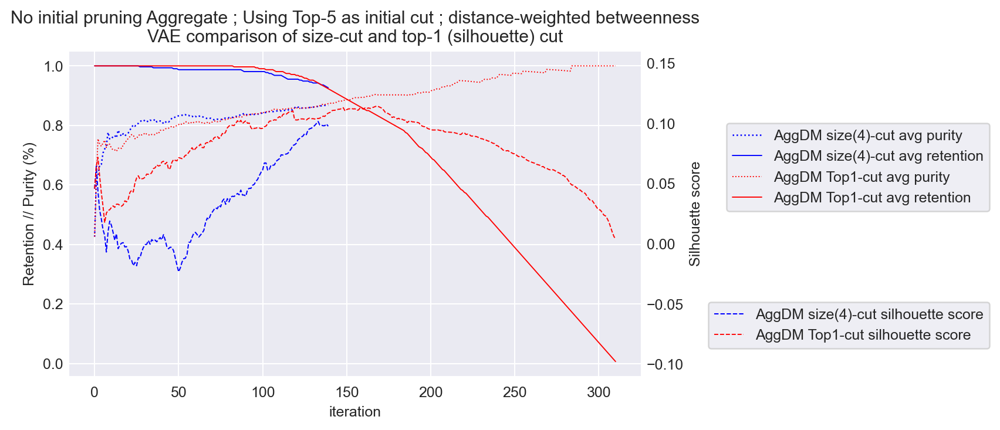

In [809]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning Aggregate ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_agg)), it_purities_agg, lw=1, ls=':', c='b',
       label='AggDM size(4)-cut avg purity')
a.plot(range(len(it_rets_agg)), it_rets_agg, lw=.75, ls='-', c='b',
       label='AggDM size(4)-cut avg retention')
a2.plot(range(len(it_scores_agg)), it_scores_agg, lw=.8, ls='--', c='b',
       label='AggDM size(4)-cut silhouette score')

a.plot(range(len(sh_purities_agg)), sh_purities_agg, lw=.75, ls=':', c='r',
       label='AggDM Top1-cut avg purity')
a.plot(range(len(sh_rets_agg)), sh_rets_agg, lw=.75, ls='-', c='r',
       label='AggDM Top1-cut avg retention')
a2.plot(range(len(sh_scores_agg)), sh_scores_agg, lw=.75, ls='--', c='r',
       label='AggDM Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_agg_silhouette.png', dpi=150, bbox_inches='tight')


### retpur curves

In [810]:
# Identify best point (based on Silhouette score) for each of the 4 conditions and add them as scatter points
best_sh_ts128 = sh_rets_ts128[np.argmax(sh_scores_ts128)], sh_purities_ts128[np.argmax(sh_scores_ts128)]
best_it_ts128 = it_rets_ts128[np.argmax(it_scores_ts128)], it_purities_ts128[np.argmax(it_scores_ts128)]
best_sh_os128 = sh_rets_os128[np.argmax(sh_scores_os128)], sh_purities_os128[np.argmax(sh_scores_os128)]
best_it_os128 = it_rets_os128[np.argmax(it_scores_os128)], it_purities_os128[np.argmax(it_scores_os128)]
best_sh_os256 = sh_rets_os256[np.argmax(sh_scores_os256)], sh_purities_os256[np.argmax(sh_scores_os256)]
best_it_os256 = it_rets_os256[np.argmax(it_scores_os256)], it_purities_os256[np.argmax(it_scores_os256)]
best_sh_agg = sh_rets_agg[np.argmax(sh_scores_agg)], sh_purities_agg[np.argmax(sh_scores_agg)]
best_it_agg = it_rets_agg[np.argmax(it_scores_agg)], it_purities_agg[np.argmax(it_scores_agg)]
best_tbcr_sh = tbcr_sh_rets[np.argmax(tbcr_sh_scores)], tbcr_sh_purities[np.argmax(tbcr_sh_scores)]
best_tbcr_it = tbcr_it_rets[np.argmax(tbcr_it_scores)], tbcr_it_purities[np.argmax(tbcr_it_scores)]
best_tcrdist_sh = tcrdist_sh_rets[np.argmax(tcrdist_sh_scores)], tcrdist_sh_purities[np.argmax(tcrdist_sh_scores)]
best_tcrdist_it = tcrdist_it_rets[np.argmax(tcrdist_it_scores)], tcrdist_it_purities[np.argmax(tcrdist_it_scores)]



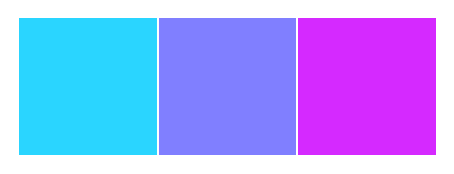

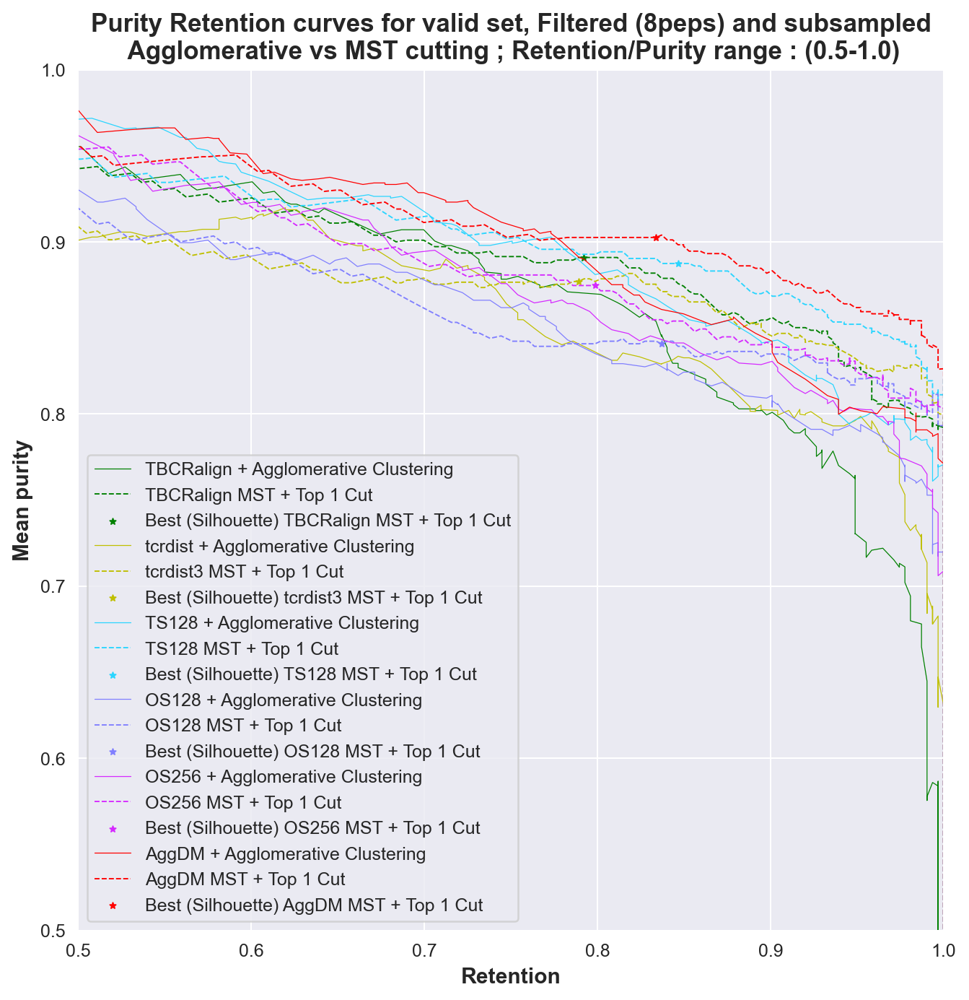

In [811]:
palette=get_palette('cool', 3)
sns.palplot(palette)
c_ts128 = palette[0]
c_os128 = palette[1]
c_os256 = palette[2]
c_agg = 'r'
c_tbcr='g'
c_tcrdist='y'
f,a = plt.subplots(1,1, figsize=(8.6,8.6))
lw=.75
marker_size=12
marker='*'
# TBCRalign
a.plot(tbcr_cluster_testset['retention'].values[1:-1], tbcr_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TBCRalign + Agglomerative Clustering', lw=0.5, ls='-', c=c_tbcr)
a.plot(tbcr_sh_rets, tbcr_sh_purities, label = 'TBCRalign MST + Top 1 Cut', lw = lw, ls='--', c=c_tbcr)
a.scatter(best_tbcr_sh[0], best_tbcr_sh[1], c=c_tbcr, label = 'Best (Silhouette) TBCRalign MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)

# tcrdist3
a.plot(tcrdist_cluster_testset['retention'].values[1:-1], tcrdist_cluster_testset['mean_purity'].values[1:-1], 
       label = 'tcrdist + Agglomerative Clustering', lw=0.5, ls='-', c=c_tcrdist)
a.plot(tcrdist_sh_rets, tcrdist_sh_purities, label = 'tcrdist3 MST + Top 1 Cut', lw = lw, ls='--', c=c_tcrdist)
a.scatter(best_tcrdist_sh[0], best_tcrdist_sh[1], c=c_tcrdist, label = 'Best (Silhouette) tcrdist3 MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)


# TS128
a.plot(ts128_cluster_testset['retention'].values[1:-1], ts128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_ts128)
a.plot(sh_rets_ts128, sh_purities_ts128, label = 'TS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_ts128)
a.scatter(best_sh_ts128[0], best_sh_ts128[1], c=c_ts128, label = 'Best (Silhouette) TS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS128
a.plot(os128_cluster_testset['retention'].values[1:-1], os128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os128)

a.plot(sh_rets_os128, sh_purities_os128, label = 'OS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_os128)
a.scatter(best_sh_os128[0], best_sh_os128[1], c=c_os128, label = 'Best (Silhouette) OS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS256
a.plot(os256_cluster_testset['retention'].values[1:-1], os256_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS256 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os256)

a.plot(sh_rets_os256, sh_purities_os256, label = 'OS256 MST + Top 1 Cut', lw = lw, ls='--', c=c_os256)
a.scatter(best_sh_os256[0], best_sh_os256[1], c=c_os256, label = 'Best (Silhouette) OS256 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# Aggregated
a.plot(agg_cluster_testset['retention'].values[1:-1], agg_cluster_testset['mean_purity'].values[1:-1], 
       label = 'AggDM + Agglomerative Clustering', lw=0.5, ls='-', c=c_agg)

a.plot(sh_rets_agg, sh_purities_agg, label = 'AggDM MST + Top 1 Cut', lw = lw, ls='--', c=c_agg)
a.scatter(best_sh_agg[0], best_sh_agg[1], c=c_agg, label = 'Best (Silhouette) AggDM MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

a.legend()
a.set_ylim([.5,1.])
a.set_xlim([.5,1.])
a.set_xlabel('Retention', fontsize=12, fontweight='semibold')
a.set_ylabel('Mean purity', fontsize=12, fontweight='semibold')
a.set_title('Purity Retention curves for valid set, Filtered (8peps) and subsampled\n Agglomerative vs MST cutting ; Retention/Purity range : (0.5-1.0)', fontweight='semibold', fontsize=14)
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_retpur_curves.png', dpi=200, bbox_inches='tight')

## Test set, Filtered to some peps no subsampling

### Data reading and sorting

In [813]:
import random
seed=1
random.seed(seed)
# See TCRBase detour for exp_filt
print(exp_filt)
df = exp17.query('peptide in @exp_filt and partition==1')
# testset_subsample = []
# for p in easy5peps:
#     tmp = df.query('peptide==@p')
#     testset_subsample.append(tmp.sample(min(len(tmp), random.randint(70,90)), random_state=seed))
# df = pd.concat(testset_subsample)
df_idx = df['raw_index'].unique()
df.groupby('peptide').count()

Index(['ELAGIGILTV', 'RAKFKQLL', 'GILGFVFTL', 'YLQPRTFLL', 'TTDPSFLGRY',
       'SPRWYFYYL', 'KLGGALQAK', 'AVFDRKSDAK'],
      dtype='object', name='peptide')


,Unnamed: 0.1,Unnamed: 0,A1,A2,A3,B1,B2,B3,allele,partition,binder,origin,original_peptide,raw_index,reference,source_organism,input_type,db
peptide,,,,,,,,,,,,,,,,,,
AVFDRKSDAK,144,144,144,144,144,144,144,144,144,144,144,144,144,144,144,0,144,144
ELAGIGILTV,92,92,92,92,92,92,92,92,92,92,92,92,92,92,92,13,92,92
GILGFVFTL,233,233,233,233,233,233,233,233,233,233,233,233,233,233,233,76,233,233
KLGGALQAK,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180,0,180,180
RAKFKQLL,166,166,166,166,166,166,166,166,166,166,166,166,166,166,166,0,166,166
SPRWYFYYL,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90
TTDPSFLGRY,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78
YLQPRTFLL,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80


In [814]:
# Best model picked on validation performance
latent_ts128 = get_latent_df(model_ts128, df)
latent_os128 = get_latent_df(model_os128, df)
latent_os256 = get_latent_df(model_os256, df)
dm_ts128, values_ts128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_ts128, index_col='raw_index')
dm_os128, values_os128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os128, index_col='raw_index')
dm_os256, values_os256, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os256, index_col='raw_index')
# Assert all index are in the same order prior to refiltering+resorting the baselines
assert all(dm_os128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os128.raw_index), 'wtf'
# re-get the baseline and re-filter based on the subset test set
dm_tbcr_testset = dm_tbcr.query('raw_index in @df_idx')
dm_tcrdist_testset = dm_tcrdist.query('raw_index in @df_idx')
# Resort it just so that we can re-use the labels and indices in the same order
dm_tbcr_testset, values_tbcr_testset = resort_baseline(dm_tbcr_testset, dm_ts128, 'raw_index')
dm_tcrdist_testset, values_tcrdist_testset = resort_baseline(dm_tcrdist_testset, dm_ts128, 'raw_index')
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(dm_ts128), len(dm_os128), len(dm_os256))

1063 1063 1063 1063 1063


In [815]:
# Aggregate the "best" model which is the two-stage 128 and the TBCRalign matrix
dm_agg, values_agg = get_agg_matrix(dm_ts128, dm_tbcr_testset)
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(dm_ts128), len(dm_os128), len(dm_os256), len(dm_agg))

1063 1063 1063 1063 1063 1063


### params

In [816]:
initial_cut_threshold=1
initial_cut_method='top'
filename='240715_8peps_nosub_partition1_test'

### Running the algos for baselines

In [817]:
# TBCRALIGN

G, tree, dist_matrix, values_tbcr_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tbcr_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tbcr_it_scores, tbcr_it_purities, tbcr_it_rets = iterative_size_cut(values_tbcr_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tbcr_sh_scores, tbcr_sh_purities, tbcr_sh_rets = iterative_topn_cut(values_tbcr_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

# Running TCRdist distmatrix
G, tree, dist_matrix, values_tcrdist_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tcrdist_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tcrdist_it_scores, tcrdist_it_purities, tcrdist_it_rets = iterative_size_cut(values_tcrdist_testset, tree, 
                                                                                                                                 initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                 initial_cut_method=initial_cut_method, 
                                                                                                                                 top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tcrdist_sh_scores, tcrdist_sh_purities, tcrdist_sh_rets = iterative_topn_cut(values_tcrdist_testset, tree, 
                                                                                                                                            initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                            initial_cut_method=initial_cut_method, 
                                                                                                                                            top_n=1, which='edge', weighted=True, 
                                                                                                                                            verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

Initial mean purity, silhouette score, retention
0.2397 0.019 1.0
2.175792507204611 2.564841498559078
Initial mean purity, silhouette score, retention
0.2493 0.0198 1.0
2.197674418604651 2.5681159420289856


### Running for VAEs

In [818]:
# Two-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_ts128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_ts128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_ts128, it_purities_ts128, it_rets_ts128 = iterative_size_cut(values_ts128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_ts128, sh_purities_ts128, sh_rets_ts128 = iterative_topn_cut(values_ts128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.2861 0.0221 1.0
2.212658227848101 2.4522613065326633


In [819]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os128, it_purities_os128, it_rets_os128 = iterative_size_cut(values_os128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os128, sh_purities_os128, sh_rets_os128 = iterative_topn_cut(values_os128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.274 0.0255 1.0
2.282321899736148 2.4803149606299213


In [820]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os256_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os256, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os256, it_purities_os256, it_rets_os256 = iterative_size_cut(values_os256_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os256, sh_purities_os256, sh_rets_os256 = iterative_topn_cut(values_os256_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.2963 0.0249 1.0
2.221052631578947 2.4895287958115184


### Run the aggregate

In [821]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_agg_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_agg, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_agg, it_purities_agg, it_rets_agg = iterative_size_cut(values_agg_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_agg, sh_purities_agg, sh_rets_agg = iterative_topn_cut(values_agg_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.2991 0.019 1.0
2.215 2.463840399002494


In [822]:
ts128_cluster_testset = cluster_all_thresholds(values_ts128_testset, values_ts128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os128_cluster_testset = cluster_all_thresholds(values_os128_testset, values_os128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os256_cluster_testset = cluster_all_thresholds(values_os256_testset, values_os256_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tcrdist_cluster_testset = cluster_all_thresholds(values_tcrdist_testset, values_tcrdist_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tbcr_cluster_testset = cluster_all_thresholds(values_tbcr_testset, values_tbcr_testset, labels, encoded_labels, label_encoder, n_jobs=8)
agg_cluster_testset = cluster_all_thresholds(values_agg_testset, values_agg_testset, labels, encoded_labels, label_encoder, n_jobs=8)

HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:17<00:00, 28.98it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:12<00:00, 41.45it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:13<00:00, 36.30it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:13<00:00, 38.25it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:13<00:00, 36.18it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:15<00:00, 32.04it/s]


### silhouette score plots

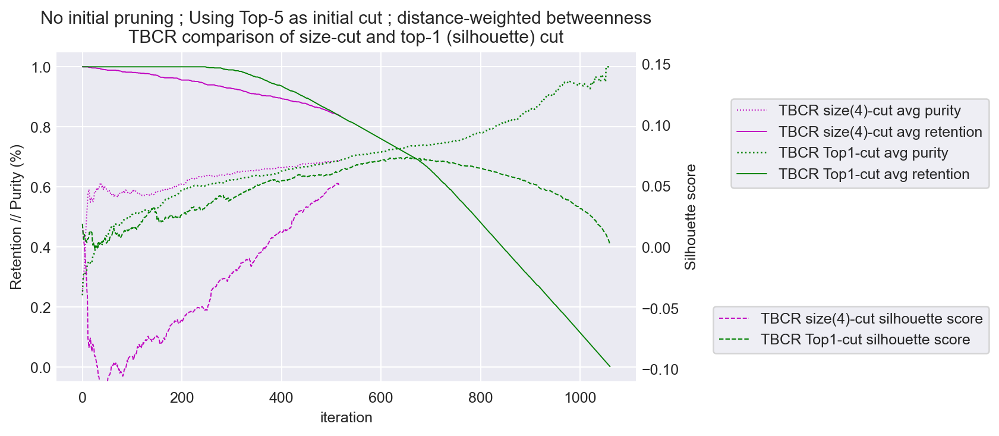

In [823]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\nTBCR comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tbcr_it_purities)), tbcr_it_purities, lw=.75, ls=':', c='m',
       label='TBCR size(4)-cut avg purity')
a.plot(range(len(tbcr_it_rets)), tbcr_it_rets, lw=.75, ls='-', c='m',
       label='TBCR size(4)-cut avg retention')
a2.plot(range(len(tbcr_it_scores)), tbcr_it_scores, lw=.75, ls='--', c='m',
       label='TBCR size(4)-cut silhouette score')

a.plot(range(len(tbcr_sh_purities)), tbcr_sh_purities, lw=1, ls=':', c='g',
       label='TBCR Top1-cut avg purity')
a.plot(range(len(tbcr_sh_rets)), tbcr_sh_rets, lw=.75, ls='-', c='g',
       label='TBCR Top1-cut avg retention')
a2.plot(range(len(tbcr_sh_scores)), tbcr_sh_scores, lw=.8, ls='--', c='g',
       label='TBCR Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}TBCR_silhouette.png', dpi=150, bbox_inches='tight')


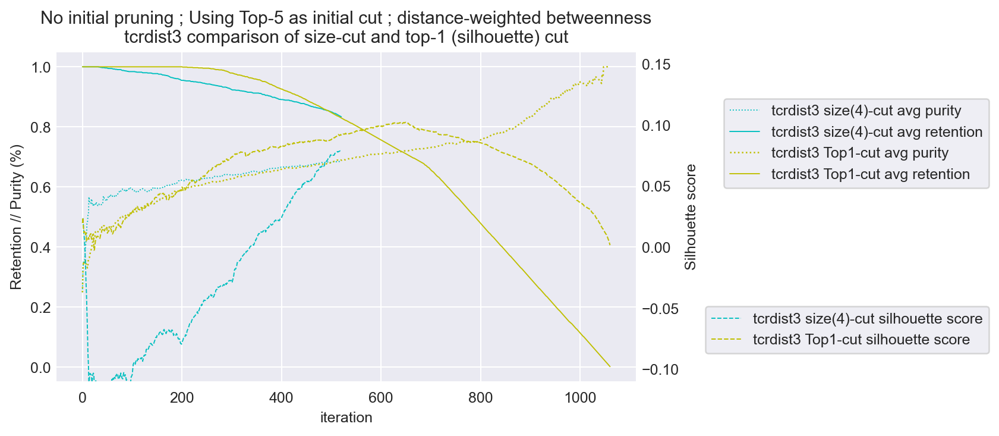

In [824]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\ntcrdist3 comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tcrdist_it_purities)), tcrdist_it_purities, lw=.75, ls=':', c='c',
       label='tcrdist3 size(4)-cut avg purity')
a.plot(range(len(tcrdist_it_rets)), tcrdist_it_rets, lw=.75, ls='-', c='c',
       label='tcrdist3 size(4)-cut avg retention')
a2.plot(range(len(tcrdist_it_scores)), tcrdist_it_scores, lw=.75, ls='--', c='c',
       label='tcrdist3 size(4)-cut silhouette score')

a.plot(range(len(tcrdist_sh_purities)), tcrdist_sh_purities, lw=1, ls=':', c='y',
       label='tcrdist3 Top1-cut avg purity')
a.plot(range(len(tcrdist_sh_rets)), tcrdist_sh_rets, lw=.75, ls='-', c='y',
       label='tcrdist3 Top1-cut avg retention')
a2.plot(range(len(tcrdist_sh_scores)), tcrdist_sh_scores, lw=.8, ls='--', c='y',
       label='tcrdist3 Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}tcrdist3_silhouette.png', dpi=150, bbox_inches='tight')


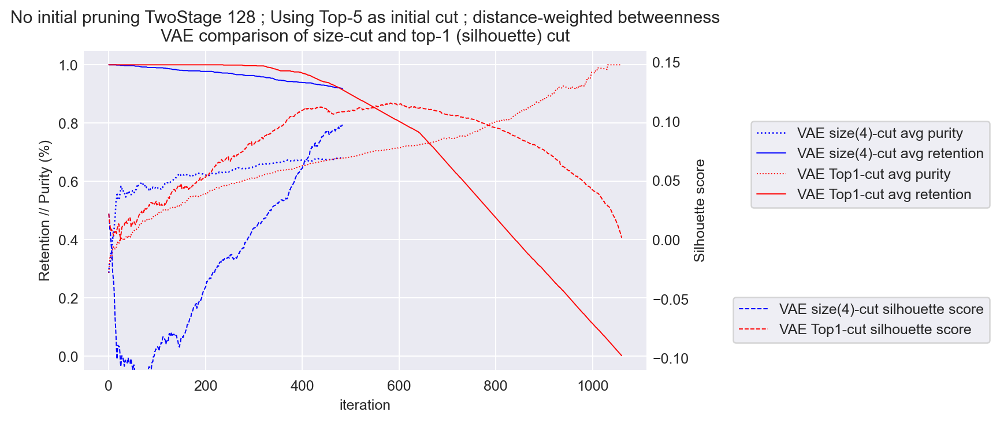

In [825]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning TwoStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_ts128)), it_purities_ts128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_ts128)), it_rets_ts128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_ts128)), it_scores_ts128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_ts128)), sh_purities_ts128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_ts128)), sh_rets_ts128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_ts128)), sh_scores_ts128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_ts128_silhouette.png', dpi=150, bbox_inches='tight')


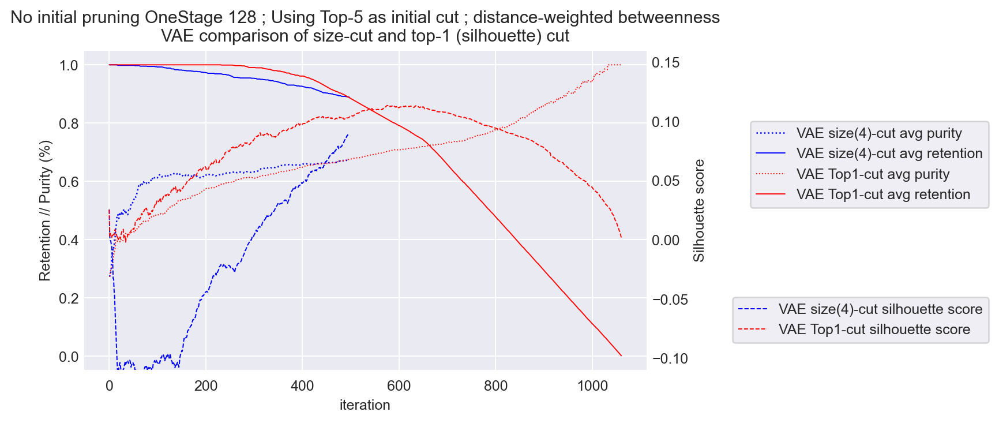

In [826]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os128)), it_purities_os128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os128)), it_rets_os128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os128)), it_scores_os128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os128)), sh_purities_os128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os128)), sh_rets_os128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os128)), sh_scores_os128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os128_silhouette.png', dpi=150, bbox_inches='tight')


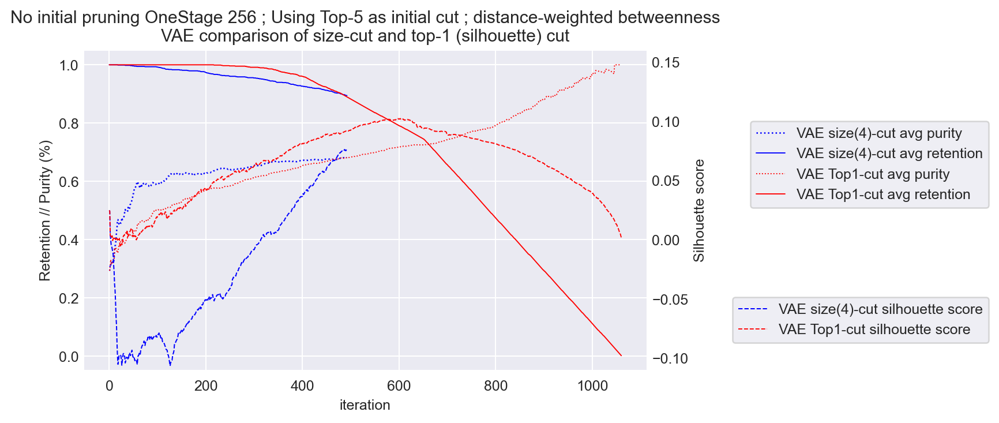

In [827]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 256 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os256)), it_purities_os256, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os256)), it_rets_os256, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os256)), it_scores_os256, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os256)), sh_purities_os256, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os256)), sh_rets_os256, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os256)), sh_scores_os256, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os256_silhouette.png', dpi=150, bbox_inches='tight')


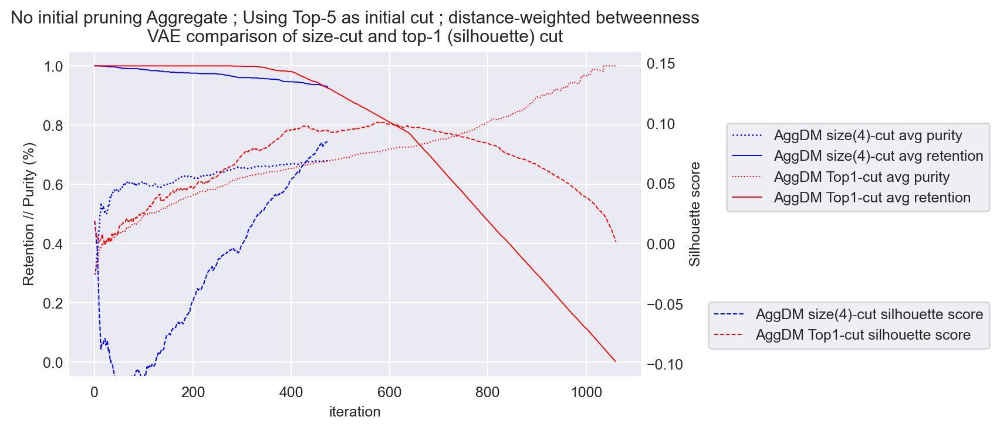

In [828]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning Aggregate ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_agg)), it_purities_agg, lw=1, ls=':', c='b',
       label='AggDM size(4)-cut avg purity')
a.plot(range(len(it_rets_agg)), it_rets_agg, lw=.75, ls='-', c='b',
       label='AggDM size(4)-cut avg retention')
a2.plot(range(len(it_scores_agg)), it_scores_agg, lw=.8, ls='--', c='b',
       label='AggDM size(4)-cut silhouette score')

a.plot(range(len(sh_purities_agg)), sh_purities_agg, lw=.75, ls=':', c='r',
       label='AggDM Top1-cut avg purity')
a.plot(range(len(sh_rets_agg)), sh_rets_agg, lw=.75, ls='-', c='r',
       label='AggDM Top1-cut avg retention')
a2.plot(range(len(sh_scores_agg)), sh_scores_agg, lw=.75, ls='--', c='r',
       label='AggDM Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_agg_silhouette.png', dpi=150, bbox_inches='tight')


### retpur curves

In [829]:
# Identify best point (based on Silhouette score) for each of the 4 conditions and add them as scatter points
best_sh_ts128 = sh_rets_ts128[np.argmax(sh_scores_ts128)], sh_purities_ts128[np.argmax(sh_scores_ts128)]
best_it_ts128 = it_rets_ts128[np.argmax(it_scores_ts128)], it_purities_ts128[np.argmax(it_scores_ts128)]
best_sh_os128 = sh_rets_os128[np.argmax(sh_scores_os128)], sh_purities_os128[np.argmax(sh_scores_os128)]
best_it_os128 = it_rets_os128[np.argmax(it_scores_os128)], it_purities_os128[np.argmax(it_scores_os128)]
best_sh_os256 = sh_rets_os256[np.argmax(sh_scores_os256)], sh_purities_os256[np.argmax(sh_scores_os256)]
best_it_os256 = it_rets_os256[np.argmax(it_scores_os256)], it_purities_os256[np.argmax(it_scores_os256)]
best_sh_agg = sh_rets_agg[np.argmax(sh_scores_agg)], sh_purities_agg[np.argmax(sh_scores_agg)]
best_it_agg = it_rets_agg[np.argmax(it_scores_agg)], it_purities_agg[np.argmax(it_scores_agg)]
best_tbcr_sh = tbcr_sh_rets[np.argmax(tbcr_sh_scores)], tbcr_sh_purities[np.argmax(tbcr_sh_scores)]
best_tbcr_it = tbcr_it_rets[np.argmax(tbcr_it_scores)], tbcr_it_purities[np.argmax(tbcr_it_scores)]
best_tcrdist_sh = tcrdist_sh_rets[np.argmax(tcrdist_sh_scores)], tcrdist_sh_purities[np.argmax(tcrdist_sh_scores)]
best_tcrdist_it = tcrdist_it_rets[np.argmax(tcrdist_it_scores)], tcrdist_it_purities[np.argmax(tcrdist_it_scores)]



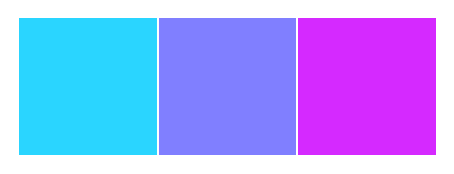

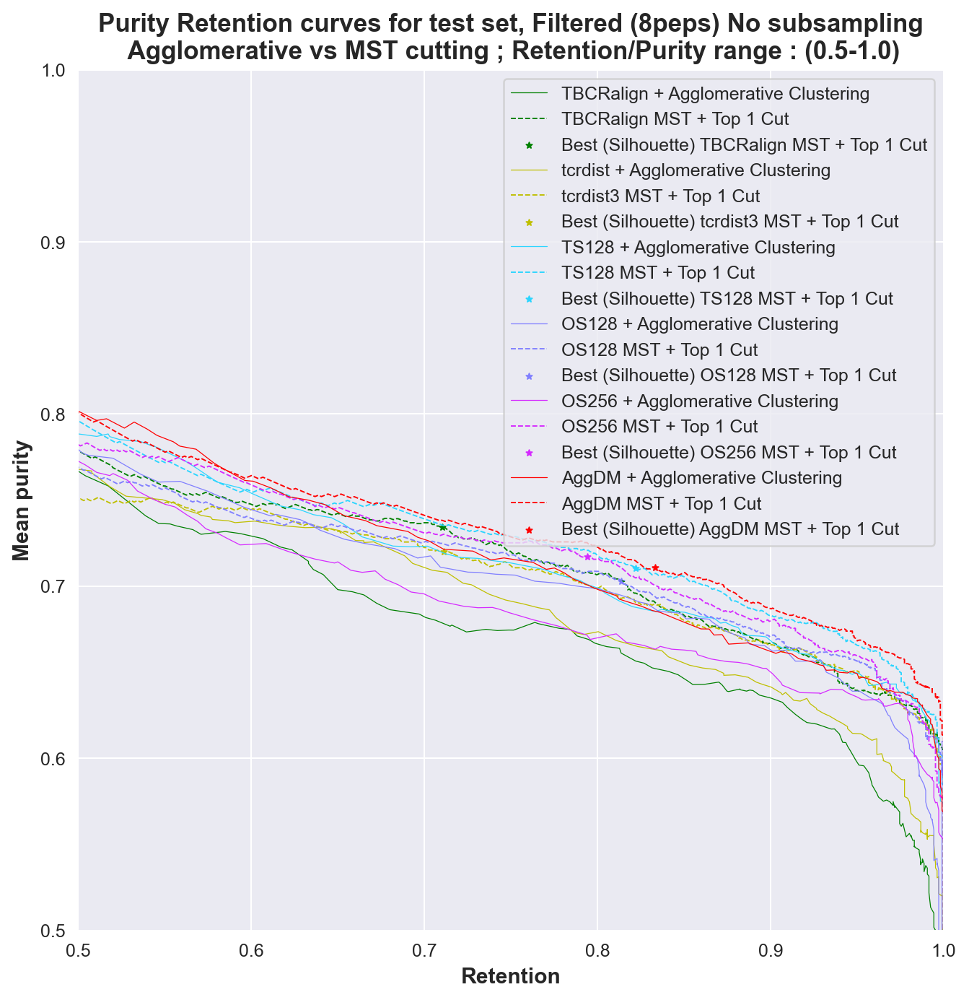

In [830]:
palette=get_palette('cool', 3)
sns.palplot(palette)
c_ts128 = palette[0]
c_os128 = palette[1]
c_os256 = palette[2]
c_agg = 'r'
c_tbcr='g'
c_tcrdist='y'
f,a = plt.subplots(1,1, figsize=(8.6,8.6))
lw=.75
marker_size=12
marker='*'
# TBCRalign
a.plot(tbcr_cluster_testset['retention'].values[1:-1], tbcr_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TBCRalign + Agglomerative Clustering', lw=0.5, ls='-', c=c_tbcr)
a.plot(tbcr_sh_rets, tbcr_sh_purities, label = 'TBCRalign MST + Top 1 Cut', lw = lw, ls='--', c=c_tbcr)
a.scatter(best_tbcr_sh[0], best_tbcr_sh[1], c=c_tbcr, label = 'Best (Silhouette) TBCRalign MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)

# tcrdist3
a.plot(tcrdist_cluster_testset['retention'].values[1:-1], tcrdist_cluster_testset['mean_purity'].values[1:-1], 
       label = 'tcrdist + Agglomerative Clustering', lw=0.5, ls='-', c=c_tcrdist)
a.plot(tcrdist_sh_rets, tcrdist_sh_purities, label = 'tcrdist3 MST + Top 1 Cut', lw = lw, ls='--', c=c_tcrdist)
a.scatter(best_tcrdist_sh[0], best_tcrdist_sh[1], c=c_tcrdist, label = 'Best (Silhouette) tcrdist3 MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)


# TS128
a.plot(ts128_cluster_testset['retention'].values[1:-1], ts128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_ts128)
a.plot(sh_rets_ts128, sh_purities_ts128, label = 'TS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_ts128)
a.scatter(best_sh_ts128[0], best_sh_ts128[1], c=c_ts128, label = 'Best (Silhouette) TS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS128
a.plot(os128_cluster_testset['retention'].values[1:-1], os128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os128)

a.plot(sh_rets_os128, sh_purities_os128, label = 'OS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_os128)
a.scatter(best_sh_os128[0], best_sh_os128[1], c=c_os128, label = 'Best (Silhouette) OS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS256
a.plot(os256_cluster_testset['retention'].values[1:-1], os256_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS256 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os256)

a.plot(sh_rets_os256, sh_purities_os256, label = 'OS256 MST + Top 1 Cut', lw = lw, ls='--', c=c_os256)
a.scatter(best_sh_os256[0], best_sh_os256[1], c=c_os256, label = 'Best (Silhouette) OS256 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# Aggregated
a.plot(agg_cluster_testset['retention'].values[1:-1], agg_cluster_testset['mean_purity'].values[1:-1], 
       label = 'AggDM + Agglomerative Clustering', lw=0.5, ls='-', c=c_agg)

a.plot(sh_rets_agg, sh_purities_agg, label = 'AggDM MST + Top 1 Cut', lw = lw, ls='--', c=c_agg)
a.scatter(best_sh_agg[0], best_sh_agg[1], c=c_agg, label = 'Best (Silhouette) AggDM MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

a.legend()
a.set_ylim([.5,1.])
a.set_xlim([.5,1.])
a.set_xlabel('Retention', fontsize=12, fontweight='semibold')
a.set_ylabel('Mean purity', fontsize=12, fontweight='semibold')
a.set_title('Purity Retention curves for test set, Filtered (8peps) No subsampling\n Agglomerative vs MST cutting ; Retention/Purity range : (0.5-1.0)', fontweight='semibold', fontsize=14)
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_retpur_curves.png', dpi=200, bbox_inches='tight')

## Valid set, Filtered to some peps no subsampling

### Data reading and sorting

In [831]:
import random
seed=1
random.seed(seed)
# See TCRBase detour for exp_filt
print(exp_filt)
df = exp17.query('peptide in @exp_filt and partition==0')
# testset_subsample = []
# for p in easy5peps:
#     tmp = df.query('peptide==@p')
#     testset_subsample.append(tmp.sample(min(len(tmp), random.randint(70,90)), random_state=seed))
# df = pd.concat(testset_subsample)
df_idx = df['raw_index'].unique()
df.groupby('peptide').count()

Index(['ELAGIGILTV', 'RAKFKQLL', 'GILGFVFTL', 'YLQPRTFLL', 'TTDPSFLGRY',
       'SPRWYFYYL', 'KLGGALQAK', 'AVFDRKSDAK'],
      dtype='object', name='peptide')


,Unnamed: 0.1,Unnamed: 0,A1,A2,A3,B1,B2,B3,allele,partition,binder,origin,original_peptide,raw_index,reference,source_organism,input_type,db
peptide,,,,,,,,,,,,,,,,,,
AVFDRKSDAK,143,143,143,143,143,143,143,143,143,143,143,143,143,143,143,0,143,143
ELAGIGILTV,92,92,92,92,92,92,92,92,92,92,92,92,92,92,92,7,92,92
GILGFVFTL,233,233,233,233,233,233,233,233,233,233,233,233,233,233,233,98,233,233
KLGGALQAK,181,181,181,181,181,181,181,181,181,181,181,181,181,181,181,0,181,181
RAKFKQLL,166,166,166,166,166,166,166,166,166,166,166,166,166,166,166,0,166,166
SPRWYFYYL,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89
TTDPSFLGRY,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78
YLQPRTFLL,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80


In [832]:
# Best model picked on validation performance
latent_ts128 = get_latent_df(model_ts128, df)
latent_os128 = get_latent_df(model_os128, df)
latent_os256 = get_latent_df(model_os256, df)
dm_ts128, values_ts128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_ts128, index_col='raw_index')
dm_os128, values_os128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os128, index_col='raw_index')
dm_os256, values_os256, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os256, index_col='raw_index')
# Assert all index are in the same order prior to refiltering+resorting the baselines
assert all(dm_os128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os256.raw_index) and all(dm_ts128.raw_index == dm_os128.raw_index), 'wtf'
# re-get the baseline and re-filter based on the subset test set
dm_tbcr_testset = dm_tbcr.query('raw_index in @df_idx')
dm_tcrdist_testset = dm_tcrdist.query('raw_index in @df_idx')
# Resort it just so that we can re-use the labels and indices in the same order
dm_tbcr_testset, values_tbcr_testset = resort_baseline(dm_tbcr_testset, dm_ts128, 'raw_index')
dm_tcrdist_testset, values_tcrdist_testset = resort_baseline(dm_tcrdist_testset, dm_ts128, 'raw_index')
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(dm_ts128), len(dm_os128), len(dm_os256))

1062 1062 1062 1062 1062


In [833]:
# Aggregate the "best" model which is the two-stage 128 and the TBCRalign matrix
dm_agg, values_agg = get_agg_matrix(dm_ts128, dm_tbcr_testset)
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(dm_ts128), len(dm_os128), len(dm_os256), len(dm_agg))

1062 1062 1062 1062 1062 1062


### params

In [834]:
initial_cut_threshold=1
initial_cut_method='top'
filename='240715_8peps_nosub_partition0_validation_'

### Running the algos for baselines

In [835]:
# TBCRALIGN

G, tree, dist_matrix, values_tbcr_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tbcr_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tbcr_it_scores, tbcr_it_purities, tbcr_it_rets = iterative_size_cut(values_tbcr_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tbcr_sh_scores, tbcr_sh_purities, tbcr_sh_rets = iterative_topn_cut(values_tbcr_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

# Running TCRdist distmatrix
G, tree, dist_matrix, values_tcrdist_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tcrdist_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, tcrdist_it_scores, tcrdist_it_purities, tcrdist_it_rets = iterative_size_cut(values_tcrdist_testset, tree, 
                                                                                                                                 initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                 initial_cut_method=initial_cut_method, 
                                                                                                                                 top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, tcrdist_sh_scores, tcrdist_sh_purities, tcrdist_sh_rets = iterative_topn_cut(values_tcrdist_testset, tree, 
                                                                                                                                            initial_cut_threshold=initial_cut_threshold, 
                                                                                                                                            initial_cut_method=initial_cut_method, 
                                                                                                                                            top_n=1, which='edge', weighted=True, 
                                                                                                                                            verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))

Initial mean purity, silhouette score, retention
0.3279 0.0239 1.0
2.1055555555555556 2.522099447513812
Initial mean purity, silhouette score, retention
0.324 0.0276 1.0
2.1732954545454546 2.5480225988700567


### Running for VAEs

In [836]:
# Two-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_ts128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_ts128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_ts128, it_purities_ts128, it_rets_ts128 = iterative_size_cut(values_ts128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_ts128, sh_purities_ts128, sh_rets_ts128 = iterative_topn_cut(values_ts128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.326 0.0267 1.0
2.3034300791556728 2.492146596858639


In [837]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os128_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os128, it_purities_os128, it_rets_os128 = iterative_size_cut(values_os128_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os128, sh_purities_os128, sh_rets_os128 = iterative_topn_cut(values_os128_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.3034 0.0278 1.0
2.236559139784946 2.518617021276596


In [838]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_os256_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os256, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_os256, it_purities_os256, it_rets_os256 = iterative_size_cut(values_os256_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_os256, sh_purities_os256, sh_rets_os256 = iterative_topn_cut(values_os256_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.3128 0.0317 1.0
2.143617021276596 2.497354497354497


### Run the aggregate

In [839]:
# One-Stage 128
# Same starting point as usual : Create a graph, mst, then prune it by distance (that might or might not just be useless)
G, tree, dist_matrix, values_agg_testset, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_agg, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tree_cut, subgraphs, size_clusters, edges_cut, nodes_cut, it_scores_agg, it_purities_agg, it_rets_agg = iterative_size_cut(values_agg_testset, tree, 
                                                                                                         initial_cut_threshold=initial_cut_threshold, 
                                                                                                         initial_cut_method=initial_cut_method, 
                                                                        top_n=1, which='edge', weighted=True, verbose=0, max_size=4)

tree_cut, subgraphs, topn_clusters, edges_removed, nodes_removed, sh_scores_agg, sh_purities_agg, sh_rets_agg = iterative_topn_cut(values_agg_testset, tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print(np.mean([x['cluster_size'] for x in topn_clusters]), np.mean([x['cluster_size'] for x in size_clusters]))


Initial mean purity, silhouette score, retention
0.3344 0.0241 1.0
2.2256410256410257 2.4642857142857144


In [840]:
ts128_cluster_testset = cluster_all_thresholds(values_ts128_testset, values_ts128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os128_cluster_testset = cluster_all_thresholds(values_os128_testset, values_os128_testset, labels, encoded_labels, label_encoder, n_jobs=8)
os256_cluster_testset = cluster_all_thresholds(values_os256_testset, values_os256_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tcrdist_cluster_testset = cluster_all_thresholds(values_tcrdist_testset, values_tcrdist_testset, labels, encoded_labels, label_encoder, n_jobs=8)
tbcr_cluster_testset = cluster_all_thresholds(values_tbcr_testset, values_tbcr_testset, labels, encoded_labels, label_encoder, n_jobs=8)
agg_cluster_testset = cluster_all_thresholds(values_agg_testset, values_agg_testset, labels, encoded_labels, label_encoder, n_jobs=8)

HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:19<00:00, 26.08it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:10<00:00, 48.83it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:10<00:00, 46.32it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:13<00:00, 38.05it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:13<00:00, 37.48it/s]


HERE


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:14<00:00, 33.35it/s]


### silhouette score plots

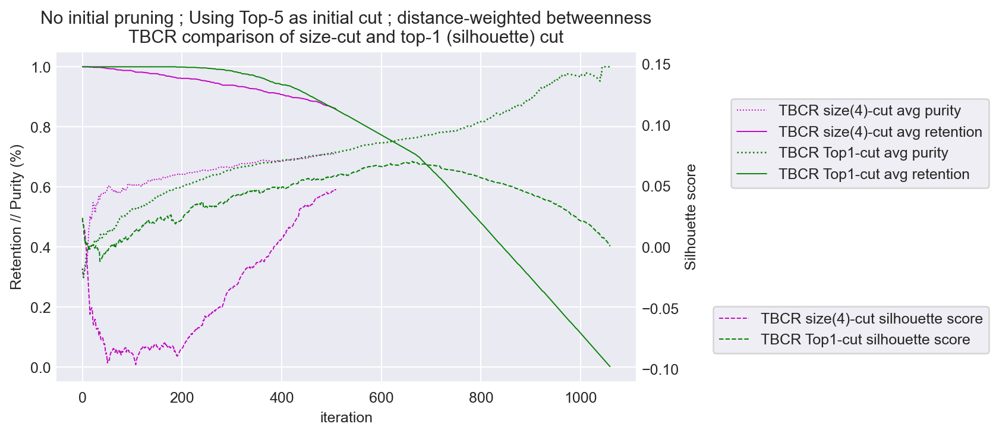

In [841]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\nTBCR comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tbcr_it_purities)), tbcr_it_purities, lw=.75, ls=':', c='m',
       label='TBCR size(4)-cut avg purity')
a.plot(range(len(tbcr_it_rets)), tbcr_it_rets, lw=.75, ls='-', c='m',
       label='TBCR size(4)-cut avg retention')
a2.plot(range(len(tbcr_it_scores)), tbcr_it_scores, lw=.75, ls='--', c='m',
       label='TBCR size(4)-cut silhouette score')

a.plot(range(len(tbcr_sh_purities)), tbcr_sh_purities, lw=1, ls=':', c='g',
       label='TBCR Top1-cut avg purity')
a.plot(range(len(tbcr_sh_rets)), tbcr_sh_rets, lw=.75, ls='-', c='g',
       label='TBCR Top1-cut avg retention')
a2.plot(range(len(tbcr_sh_scores)), tbcr_sh_scores, lw=.8, ls='--', c='g',
       label='TBCR Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}TBCR_silhouette.png', dpi=150, bbox_inches='tight')


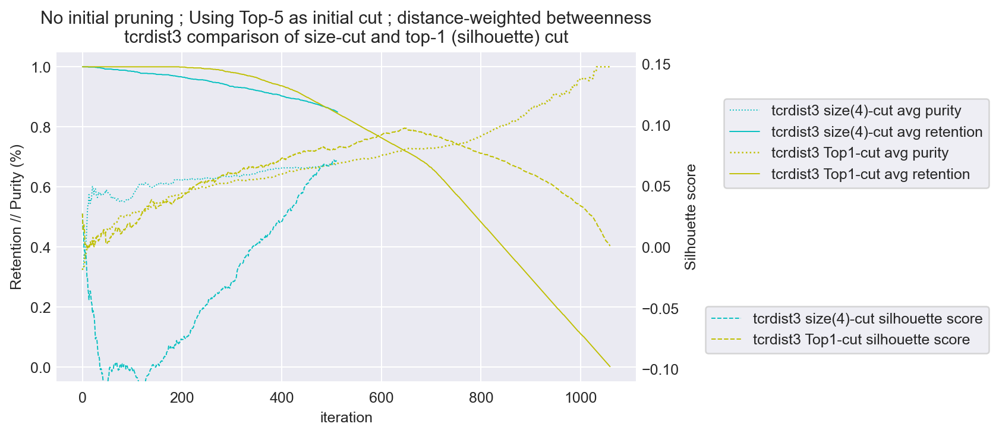

In [842]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning ; Using Top-5 as initial cut ; distance-weighted betweenness\ntcrdist3 comparison of size-cut and top-1 (silhouette) cut')

a.plot(range(len(tcrdist_it_purities)), tcrdist_it_purities, lw=.75, ls=':', c='c',
       label='tcrdist3 size(4)-cut avg purity')
a.plot(range(len(tcrdist_it_rets)), tcrdist_it_rets, lw=.75, ls='-', c='c',
       label='tcrdist3 size(4)-cut avg retention')
a2.plot(range(len(tcrdist_it_scores)), tcrdist_it_scores, lw=.75, ls='--', c='c',
       label='tcrdist3 size(4)-cut silhouette score')

a.plot(range(len(tcrdist_sh_purities)), tcrdist_sh_purities, lw=1, ls=':', c='y',
       label='tcrdist3 Top1-cut avg purity')
a.plot(range(len(tcrdist_sh_rets)), tcrdist_sh_rets, lw=.75, ls='-', c='y',
       label='tcrdist3 Top1-cut avg retention')
a2.plot(range(len(tcrdist_sh_scores)), tcrdist_sh_scores, lw=.8, ls='--', c='y',
       label='tcrdist3 Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.88))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}tcrdist3_silhouette.png', dpi=150, bbox_inches='tight')


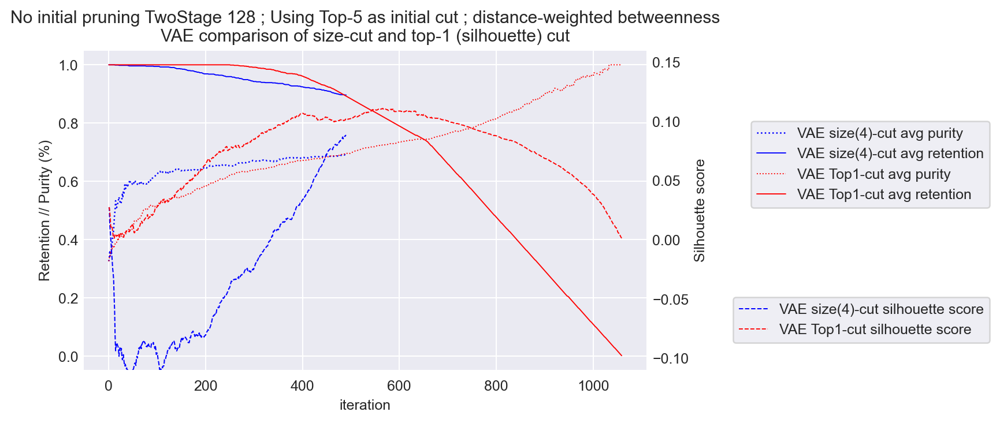

In [843]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning TwoStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_ts128)), it_purities_ts128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_ts128)), it_rets_ts128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_ts128)), it_scores_ts128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_ts128)), sh_purities_ts128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_ts128)), sh_rets_ts128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_ts128)), sh_scores_ts128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_ts128_silhouette.png', dpi=150, bbox_inches='tight')


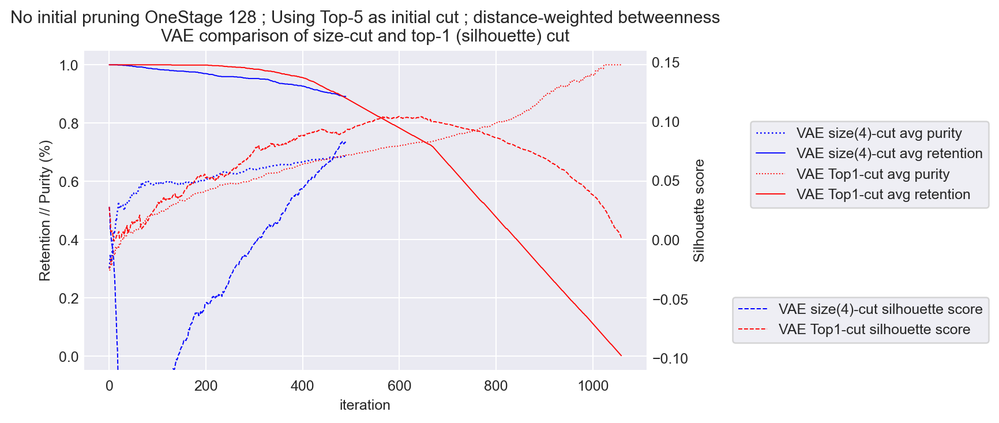

In [844]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 128 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os128)), it_purities_os128, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os128)), it_rets_os128, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os128)), it_scores_os128, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os128)), sh_purities_os128, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os128)), sh_rets_os128, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os128)), sh_scores_os128, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os128_silhouette.png', dpi=150, bbox_inches='tight')


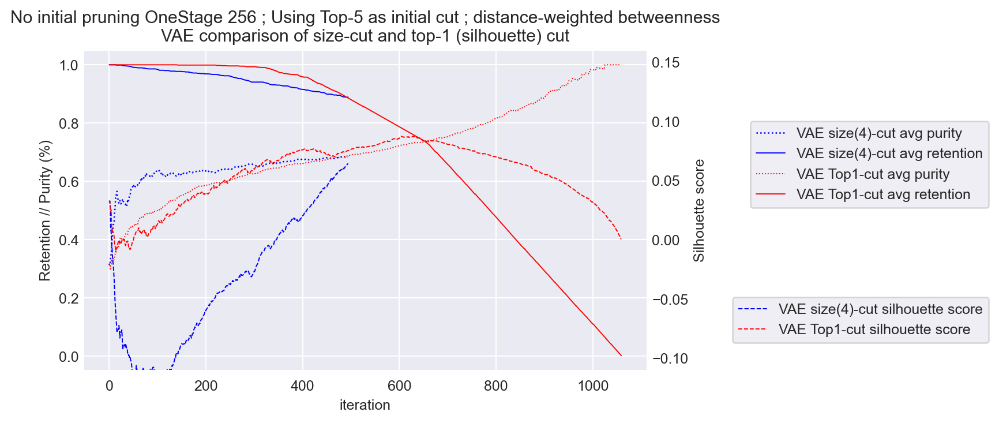

In [845]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning OneStage 256 ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_os256)), it_purities_os256, lw=1, ls=':', c='b',
       label='VAE size(4)-cut avg purity')
a.plot(range(len(it_rets_os256)), it_rets_os256, lw=.75, ls='-', c='b',
       label='VAE size(4)-cut avg retention')
a2.plot(range(len(it_scores_os256)), it_scores_os256, lw=.8, ls='--', c='b',
       label='VAE size(4)-cut silhouette score')

a.plot(range(len(sh_purities_os256)), sh_purities_os256, lw=.75, ls=':', c='r',
       label='VAE Top1-cut avg purity')
a.plot(range(len(sh_rets_os256)), sh_rets_os256, lw=.75, ls='-', c='r',
       label='VAE Top1-cut avg retention')
a2.plot(range(len(sh_scores_os256)), sh_scores_os256, lw=.75, ls='--', c='r',
       label='VAE Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_os256_silhouette.png', dpi=150, bbox_inches='tight')


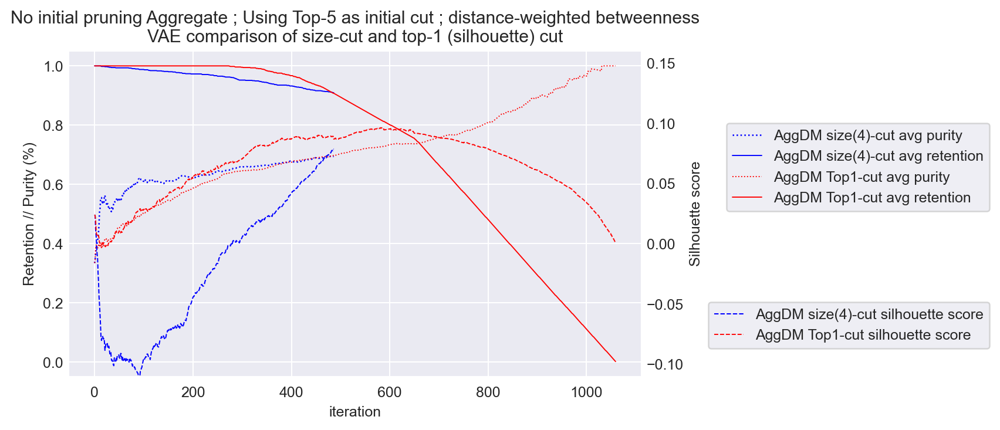

In [846]:
f,a = plt.subplots(1,1, figsize=(7,4))
a2 = a.twinx()
a.set_title('No initial pruning Aggregate ; Using Top-5 as initial cut ; distance-weighted betweenness\nVAE comparison of size-cut and top-1 (silhouette) cut')
a.plot(range(len(it_purities_agg)), it_purities_agg, lw=1, ls=':', c='b',
       label='AggDM size(4)-cut avg purity')
a.plot(range(len(it_rets_agg)), it_rets_agg, lw=.75, ls='-', c='b',
       label='AggDM size(4)-cut avg retention')
a2.plot(range(len(it_scores_agg)), it_scores_agg, lw=.8, ls='--', c='b',
       label='AggDM size(4)-cut silhouette score')

a.plot(range(len(sh_purities_agg)), sh_purities_agg, lw=.75, ls=':', c='r',
       label='AggDM Top1-cut avg purity')
a.plot(range(len(sh_rets_agg)), sh_rets_agg, lw=.75, ls='-', c='r',
       label='AggDM Top1-cut avg retention')
a2.plot(range(len(sh_scores_agg)), sh_scores_agg, lw=.75, ls='--', c='r',
       label='AggDM Top1-cut silhouette score')

# Align the tick marks
a.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from primary y-axis
a2.yaxis.set_tick_params(which='both', length=0)  # Remove tick marks from secondary y-axis
# Align the gridlines
a.grid(True)
a2.grid(False)  # Disable secondary y-axis gridlines
a.set_ylabel('Retention // Purity (%)')
a2.set_ylabel('Silhouette score')
a2.set_ylim([-0.11,0.16])
a2.legend(bbox_to_anchor=(1.62,.25))
a.set_xlabel('iteration')
a.legend(bbox_to_anchor=(1.62,.8))
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_agg_silhouette.png', dpi=150, bbox_inches='tight')


### retpur curves

In [847]:
# Identify best point (based on Silhouette score) for each of the 4 conditions and add them as scatter points
best_sh_ts128 = sh_rets_ts128[np.argmax(sh_scores_ts128)], sh_purities_ts128[np.argmax(sh_scores_ts128)]
best_it_ts128 = it_rets_ts128[np.argmax(it_scores_ts128)], it_purities_ts128[np.argmax(it_scores_ts128)]
best_sh_os128 = sh_rets_os128[np.argmax(sh_scores_os128)], sh_purities_os128[np.argmax(sh_scores_os128)]
best_it_os128 = it_rets_os128[np.argmax(it_scores_os128)], it_purities_os128[np.argmax(it_scores_os128)]
best_sh_os256 = sh_rets_os256[np.argmax(sh_scores_os256)], sh_purities_os256[np.argmax(sh_scores_os256)]
best_it_os256 = it_rets_os256[np.argmax(it_scores_os256)], it_purities_os256[np.argmax(it_scores_os256)]
best_sh_agg = sh_rets_agg[np.argmax(sh_scores_agg)], sh_purities_agg[np.argmax(sh_scores_agg)]
best_it_agg = it_rets_agg[np.argmax(it_scores_agg)], it_purities_agg[np.argmax(it_scores_agg)]
best_tbcr_sh = tbcr_sh_rets[np.argmax(tbcr_sh_scores)], tbcr_sh_purities[np.argmax(tbcr_sh_scores)]
best_tbcr_it = tbcr_it_rets[np.argmax(tbcr_it_scores)], tbcr_it_purities[np.argmax(tbcr_it_scores)]
best_tcrdist_sh = tcrdist_sh_rets[np.argmax(tcrdist_sh_scores)], tcrdist_sh_purities[np.argmax(tcrdist_sh_scores)]
best_tcrdist_it = tcrdist_it_rets[np.argmax(tcrdist_it_scores)], tcrdist_it_purities[np.argmax(tcrdist_it_scores)]



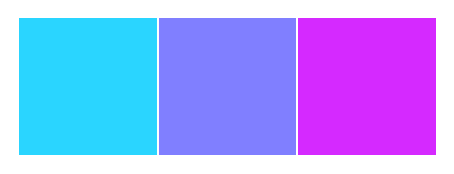

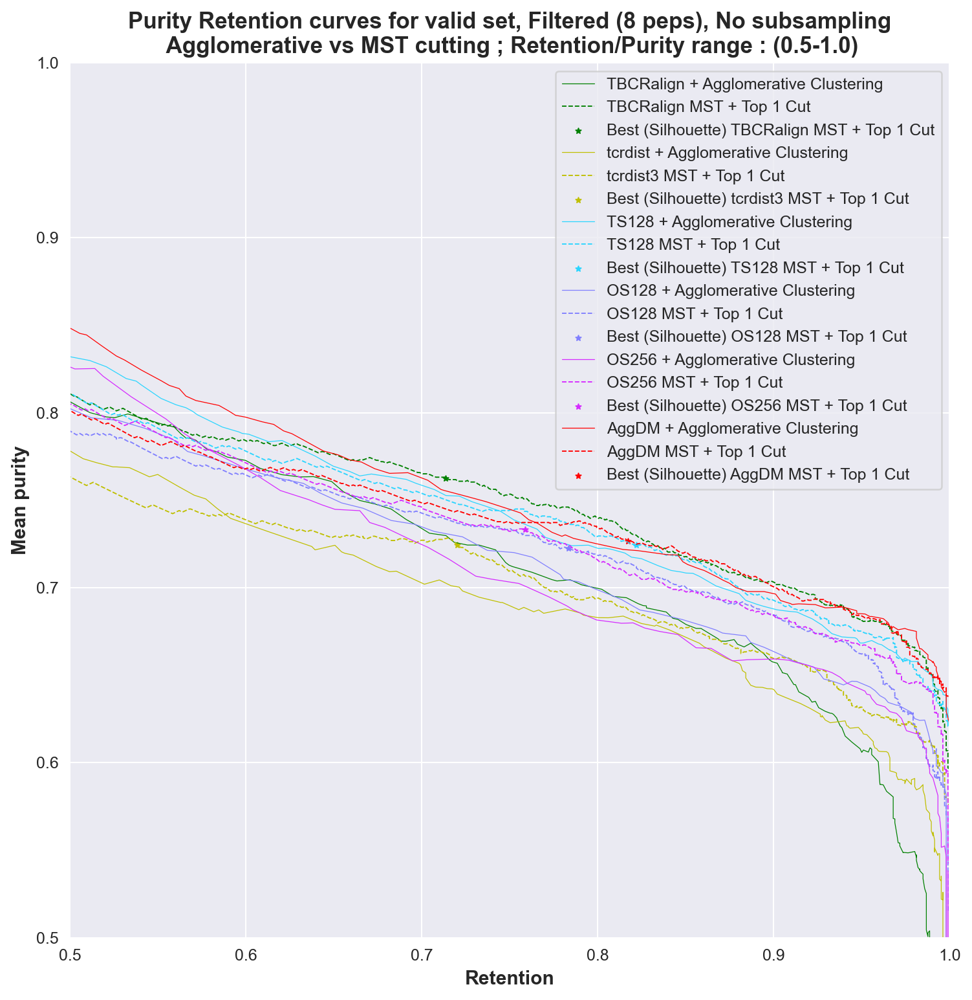

In [855]:
palette=get_palette('cool', 3)
sns.palplot(palette)
c_ts128 = palette[0]
c_os128 = palette[1]
c_os256 = palette[2]
c_agg = 'r'
c_tbcr='g'
c_tcrdist='y'
f,a = plt.subplots(1,1, figsize=(9.75,9.75))
lw=.75
marker_size=12
marker='*'
# TBCRalign
a.plot(tbcr_cluster_testset['retention'].values[1:-1], tbcr_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TBCRalign + Agglomerative Clustering', lw=0.5, ls='-', c=c_tbcr)
a.plot(tbcr_sh_rets, tbcr_sh_purities, label = 'TBCRalign MST + Top 1 Cut', lw = lw, ls='--', c=c_tbcr)
a.scatter(best_tbcr_sh[0], best_tbcr_sh[1], c=c_tbcr, label = 'Best (Silhouette) TBCRalign MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)

# tcrdist3
a.plot(tcrdist_cluster_testset['retention'].values[1:-1], tcrdist_cluster_testset['mean_purity'].values[1:-1], 
       label = 'tcrdist + Agglomerative Clustering', lw=0.5, ls='-', c=c_tcrdist)
a.plot(tcrdist_sh_rets, tcrdist_sh_purities, label = 'tcrdist3 MST + Top 1 Cut', lw = lw, ls='--', c=c_tcrdist)
a.scatter(best_tcrdist_sh[0], best_tcrdist_sh[1], c=c_tcrdist, label = 'Best (Silhouette) tcrdist3 MST + Top 1 Cut', s=marker_size, marker=marker, lw=lw)


# TS128
a.plot(ts128_cluster_testset['retention'].values[1:-1], ts128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'TS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_ts128)
a.plot(sh_rets_ts128, sh_purities_ts128, label = 'TS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_ts128)
a.scatter(best_sh_ts128[0], best_sh_ts128[1], c=c_ts128, label = 'Best (Silhouette) TS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS128
a.plot(os128_cluster_testset['retention'].values[1:-1], os128_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS128 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os128)

a.plot(sh_rets_os128, sh_purities_os128, label = 'OS128 MST + Top 1 Cut', lw = lw, ls='--', c=c_os128)
a.scatter(best_sh_os128[0], best_sh_os128[1], c=c_os128, label = 'Best (Silhouette) OS128 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# OS256
a.plot(os256_cluster_testset['retention'].values[1:-1], os256_cluster_testset['mean_purity'].values[1:-1], 
       label = 'OS256 + Agglomerative Clustering', lw=0.5, ls='-', c=c_os256)

a.plot(sh_rets_os256, sh_purities_os256, label = 'OS256 MST + Top 1 Cut', lw = lw, ls='--', c=c_os256)
a.scatter(best_sh_os256[0], best_sh_os256[1], c=c_os256, label = 'Best (Silhouette) OS256 MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

# Aggregated
a.plot(agg_cluster_testset['retention'].values[1:-1], agg_cluster_testset['mean_purity'].values[1:-1], 
       label = 'AggDM + Agglomerative Clustering', lw=0.5, ls='-', c=c_agg)

a.plot(sh_rets_agg, sh_purities_agg, label = 'AggDM MST + Top 1 Cut', lw = lw, ls='--', c=c_agg)
a.scatter(best_sh_agg[0], best_sh_agg[1], c=c_agg, label = 'Best (Silhouette) AggDM MST + Top 1 Cut', 
          s=marker_size, marker=marker, lw=lw)

a.legend()
a.set_ylim([.5,1.])
a.set_xlim([.5,1.])
a.set_xlabel('Retention', fontsize=12, fontweight='semibold')
a.set_ylabel('Mean purity', fontsize=12, fontweight='semibold')
a.set_title('Purity Retention curves for valid set, Filtered (8 peps), No subsampling\n Agglomerative vs MST cutting ; Retention/Purity range : (0.5-1.0)', fontweight='semibold', fontsize=14)
f.savefig(f'../output/240618_NestedKCV_CNNVAE/notebook_figs/{filename}_retpur_curves.png', dpi=200, bbox_inches='tight')

# For a given MST top 1 cut, re-aggregate upwards to create hierarchy?

In [925]:
import random
seed=1
random.seed(seed)
easy5peps = ['ELAGIGILTV', 'GILGFVFTL', 'LLWNGPMAV', 'RAKFKQLL', 'YLQPRTFLL']
df = exp17.query('peptide in @easy5peps and partition==1')
df_idx = df['raw_index'].unique()
df.groupby('peptide').count()

,Unnamed: 0.1,Unnamed: 0,A1,A2,A3,B1,B2,B3,allele,partition,binder,origin,original_peptide,raw_index,reference,source_organism,input_type,db
peptide,,,,,,,,,,,,,,,,,,
ELAGIGILTV,92,92,92,92,92,92,92,92,92,92,92,92,92,92,92,13,92,92
GILGFVFTL,233,233,233,233,233,233,233,233,233,233,233,233,233,233,233,76,233,233
LLWNGPMAV,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74,74
RAKFKQLL,166,166,166,166,166,166,166,166,166,166,166,166,166,166,166,0,166,166
YLQPRTFLL,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80,80


In [926]:
# Best model picked on validation performance
latent_os128 = get_latent_df(model_os128, df)
dm_os128, values_os128, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_os128, index_col='raw_index')
# Assert all index are in the same order prior to refiltering+resorting the baselines
# re-get the baseline and re-filter based on the subset test set
dm_tbcr_testset = dm_tbcr.query('partition==1 and raw_index in @df_idx')
# Resort it just so that we can re-use the labels and indices in the same order
dm_tbcr_testset, values_tbcr_testset = resort_baseline(dm_tbcr_testset, dm_os128, 'raw_index')
print(len(dm_os128))
print(len(dm_tbcr_testset))

645
645


In [927]:
initial_cut_threshold=1
initial_cut_method='top'

In [928]:
# TBCRALIGN
G, initial_tbcr_tree, dm_tbcr_tmp, values_tbcr_tmp, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tbcr_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tbcr_tree, tbcr_subgraphs, tbcr_clusters_size, tbcr_edges, tbcr_nodes, tbcr_sh_scores, tbcr_sh_purities, tbcr_sh_rets = iterative_size_cut(values_tbcr_tmp, initial_tbcr_tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, max_size=5)
# VAE 
# TBCRALIGN
G, initial_vae_tree, dm_os128_tmp, values_os128, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
vae_tree, vae_subgraphs, vae_clusters_size, vae_edges, vae_nodes, vae_sh_scores, vae_sh_purities, vae_sh_rets = iterative_size_cut(values_os128, initial_vae_tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, max_size=5)
print('Mean cluster size -- mean purity -- Retention')
print(round(np.mean([x['cluster_size'] for x in tbcr_clusters_size]),4),
      round(np.mean([x['purity'] for x in tbcr_clusters_size]),4),
      round(np.sum([x['cluster_size'] for x in tbcr_clusters_size]),4)/len(values_tbcr_tmp))
print(round(np.mean([x['cluster_size'] for x in vae_clusters_size]),4),
      round(np.mean([x['purity'] for x in vae_clusters_size]),4),
      round(np.sum([x['cluster_size'] for x in vae_clusters_size]),4)/len(values_os128))
print(len(tbcr_clusters_size), len(vae_clusters_size))

Mean cluster size -- mean purity -- Retention
2.965 0.7979 0.9193798449612403
3.0352 0.7852 0.9364341085271318
200 199


In [929]:
# TBCRALIGN
G, initial_tbcr_tree, dm_tbcr_tmp, values_tbcr_tmp, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_tbcr_testset, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
tbcr_tree, tbcr_subgraphs, tbcr_clusters, tbcr_edges, tbcr_nodes, tbcr_sh_scores, tbcr_sh_purities, tbcr_sh_rets = iterative_topn_cut(values_tbcr_tmp, initial_tbcr_tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
# VAE 
# TBCRALIGN
G, initial_vae_tree, dm_os128_tmp, values_os128, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_os128, label_col='peptide',
                                                                                                                   index_col='raw_index', algorithm='kruskal')
# NO INITIAL PRUNING
vae_tree, vae_subgraphs, vae_clusters, vae_edges, vae_nodes, vae_sh_scores, vae_sh_purities, vae_sh_rets = iterative_topn_cut(values_os128, initial_vae_tree, 
                                                                                                                    initial_cut_threshold=initial_cut_threshold, 
                                                                                                                    initial_cut_method=initial_cut_method, 
                                                                                                                    top_n=1, which='edge', weighted=True, 
                                                                                                                    verbose=0, score_threshold=.5)
print('Mean cluster size -- mean purity -- Retention')
print(round(np.mean([x['cluster_size'] for x in tbcr_clusters]),4),
      round(np.mean([x['purity'] for x in tbcr_clusters]),4),
      round(np.sum([x['cluster_size'] for x in tbcr_clusters]),4)/len(values_tbcr_tmp))
print(round(np.mean([x['cluster_size'] for x in vae_clusters]),4),
      round(np.mean([x['purity'] for x in vae_clusters]),4),
      round(np.sum([x['cluster_size'] for x in vae_clusters]),4)/len(values_os128))
print(len(tbcr_clusters), len(vae_clusters))

Initial mean purity, silhouette score, retention
0.4243 0.0427 1.0
Initial mean purity, silhouette score, retention
0.4437 0.0482 1.0
Mean cluster size -- mean purity -- Retention
2.3689 0.8475 0.7565891472868217
2.1461 0.8387 0.7286821705426356
206 219


In [930]:
a = {'dist_matrix': 'TBCR', 
     'method':'Top-1 cut (best silhouette score)',
     'n_clusters': len(tbcr_clusters),
     'mean_cluster_size': round(np.mean([x['cluster_size'] for x in tbcr_clusters]),4),
     'max_cluster_size': np.max([x['cluster_size'] for x in tbcr_clusters]),
      'mean_purity':round(np.mean([x['purity'] for x in tbcr_clusters]),4),
      'retention':round(np.sum([x['cluster_size'] for x in tbcr_clusters]),4)/len(values_tbcr_tmp)}
b = {'dist_matrix': 'VAE', 
     'method':'Top-1 cut (best silhouette score)',
     'n_clusters': len(vae_clusters),
     'mean_cluster_size': round(np.mean([x['cluster_size'] for x in vae_clusters]),4),
     'max_cluster_size': np.max([x['cluster_size'] for x in vae_clusters]),
      'mean_purity':round(np.mean([x['purity'] for x in vae_clusters]),4),
      'retention':round(np.sum([x['cluster_size'] for x in vae_clusters]),4)/len(values_os128)}

c = {'dist_matrix': 'TBCR', 
     'method':'Size cut (Max_size=5)',
     'n_clusters': len(tbcr_clusters_size),
     'mean_cluster_size': round(np.mean([x['cluster_size'] for x in tbcr_clusters_size]),4),
     'max_cluster_size': np.max([x['cluster_size'] for x in tbcr_clusters_size]),
      'mean_purity':round(np.mean([x['purity'] for x in tbcr_clusters_size]),4),
      'retention':round(np.sum([x['cluster_size'] for x in tbcr_clusters_size]),4)/len(values_tbcr_tmp)}
d = {'dist_matrix': 'VAE', 
     'method':'Size cut (Max_size=5)',
     'n_clusters': len(vae_clusters_size),
     'mean_cluster_size': round(np.mean([x['cluster_size'] for x in vae_clusters_size]),4),
     'max_cluster_size': np.max([x['cluster_size'] for x in vae_clusters_size]),
      'mean_purity':round(np.mean([x['purity'] for x in vae_clusters_size]),4),
      'retention':round(np.sum([x['cluster_size'] for x in vae_clusters_size]),4)/len(values_os128)}
pd.DataFrame([a,b,c,d])

,dist_matrix,method,n_clusters,mean_cluster_size,max_cluster_size,mean_purity,retention
0,TBCR,Top-1 cut (best silhouette score),206,2.3689,4,0.8475,0.756589
1,VAE,Top-1 cut (best silhouette score),219,2.1461,4,0.8387,0.728682
2,TBCR,Size cut (Max_size=5),200,2.9650,4,0.7979,0.919380
3,VAE,Size cut (Max_size=5),199,3.0352,4,0.7852,0.936434


In [628]:
vae_edges

[((140, 548), 0.04818198544665473),
 ((436, 486), 0.020212096091317206),
 ((2, 352), 0.005577058740272937),
 ((488, 522), 0.004355685223735892),
 ((276, 616), 0.003438961228658987),
 ((89, 451), 0.001796444611292231),
 ((3, 81), 0.001258716285250187),
 ((116, 569), 0.001213871671396624),
 ((395, 595), 0.0011318183046530868),
 ((89, 333), 0.000988652919176305),
 ((49, 486), 0.0008037000454667751),
 ((372, 538), 0.0007302131042752379),
 ((181, 557), 0.0004908527282990233),
 ((145, 602), 0.00039598712751313616),
 ((152, 509), 0.00037657629151259276),
 ((522, 622), 0.0003512743579836945),
 ((222, 275), 0.00033466175599452624),
 ((175, 466), 0.0003293085857003818),
 ((62, 514), 0.0003244896920043695),
 ((380, 482), 0.0002486817230286682),
 ((14, 83), 0.0002277917211003743),
 ((24, 396), 0.00021184733056620414),
 ((115, 203), 0.00021093147809840717),
 ((56, 177), 0.00021051943686959052),
 ((395, 455), 0.00017820709618618708),
 ((401, 599), 0.00015281588944187862),
 ((577, 639), 0.00014449976

In [600]:
gil_duo = [x['members'] for x in vae_clusters if x['majority_label']=='GILGFVFTL' and x['purity']>0.7 and x['cluster_size']==2]
gil_duo = [(a,b) for a,b in gil_duo]
gil_list =  sorted([element for subset in gil_duo for element in subset])
subset = dm_os128_tmp.iloc[gil_list]
# Take the dm and play around to get easier handling
subset = subset[[str(x) for x in subset.index]]
# subset.columns = [int(x) for x in subset.columns]
subset.replace(0, 10, inplace=True)
subset.reset_index(drop=True, inplace=True)
subset.columns = subset.index
idx_map = {k:v for k,v in zip(gil_list, subset.index)}

In [601]:
def get_idx(pair, idx_map=idx_map):
    return idx_map[pair[0]], idx_map[pair[1]]

In [607]:
subset.loc[get_idx(gil_duo[-1])]

0.09207046

In [615]:
subset.loc[5].sort_values().head()

2     0.098858
31    0.105483
11    0.110173
58    0.112741
49    0.115684
Name: 5, dtype: float32

In [624]:
sorted_clusters = sorted(vae_clusters, key=lambda x: x['cluster_size'], reverse=True)
[x for x in sorted_clusters if x['purity']!=1]

[{'cluster_size': 3,
  'majority_label': 'LLWNGPMAV',
  'purity': 0.6666666666666666,
  'counts': {'ELAGIGILTV': 1, 'LLWNGPMAV': 2},
  'members': {13, 120, 122}},
 {'cluster_size': 3,
  'majority_label': 'ELAGIGILTV',
  'purity': 0.6666666666666666,
  'counts': {'ELAGIGILTV': 2, 'LLWNGPMAV': 1},
  'members': {58, 440, 510}},
 {'cluster_size': 3,
  'majority_label': 'GILGFVFTL',
  'purity': 0.6666666666666666,
  'counts': {'GILGFVFTL': 2, 'LLWNGPMAV': 1},
  'members': {64, 382, 400}},
 {'cluster_size': 3,
  'majority_label': 'ELAGIGILTV',
  'purity': 0.3333333333333333,
  'counts': {'ELAGIGILTV': 1, 'GILGFVFTL': 1, 'RAKFKQLL': 1},
  'members': {117, 190, 426}},
 {'cluster_size': 3,
  'majority_label': 'RAKFKQLL',
  'purity': 0.6666666666666666,
  'counts': {'GILGFVFTL': 1, 'RAKFKQLL': 2},
  'members': {119, 186, 409}},
 {'cluster_size': 3,
  'majority_label': 'LLWNGPMAV',
  'purity': 0.6666666666666666,
  'counts': {'ELAGIGILTV': 1, 'LLWNGPMAV': 2},
  'members': {154, 404, 633}},
 {'clu

# Louvain / Leiden with thresholding ?

In [941]:
from src.networkx_utils import plot_mst_spring, create_mst_from_distance_matrix, get_color_map
import random
seed=1
random.seed(seed)
# See TCRBase detour for exp_filt
print(exp_filt)
df = exp17.query('peptide in @exp_filt and partition==1')
testset_subsample = []
for p in exp_filt:
    tmp = df.query('peptide==@p')
    testset_subsample.append(tmp.sample(min(len(tmp), random.randint(70,90)), random_state=seed))
testset_subsample = pd.concat(testset_subsample)
testset_idx = testset_subsample.query('partition==1')['raw_index'].unique()
testset_subsample.groupby('peptide').agg(count=('A1','count'))

Index(['ELAGIGILTV', 'RAKFKQLL', 'GILGFVFTL', 'YLQPRTFLL', 'TTDPSFLGRY',
       'SPRWYFYYL', 'KLGGALQAK', 'AVFDRKSDAK'],
      dtype='object', name='peptide')


,count
peptide,
AVFDRKSDAK,85
ELAGIGILTV,74
GILGFVFTL,72
KLGGALQAK,84
RAKFKQLL,88
SPRWYFYYL,85
TTDPSFLGRY,73
YLQPRTFLL,78


In [931]:
# Old 5 peps
import random
seed=131
random.seed(seed)
# Take test partition only, subsample
# easy5peps = exp17.peptide.unique()
easy5peps = ['ELAGIGILTV', 'GILGFVFTL', 'LLWNGPMAV', 'RAKFKQLL', 'YLQPRTFLL']
testset = exp17.query('peptide in @easy5peps and partition==1')
# Randomly subsample between 60 and 74 datapoints for each peptide:
testset_subsample = []
for p in easy5peps:
    tmp = testset.query('peptide==@p')
    testset_subsample.append(tmp.sample(min(len(tmp), random.randint(70,90)), random_state=seed))
testset_subsample = pd.concat(testset_subsample)
testset_idx = testset_subsample.query('partition==1')['raw_index'].unique()
testset_subsample.groupby('peptide').agg(count=('A1','count'))

,count
peptide,
ELAGIGILTV,80
GILGFVFTL,81
LLWNGPMAV,74
RAKFKQLL,72
YLQPRTFLL,80


In [942]:
# Best model picked on validation performance
model = load_model_full('../output/240618_NestedKCV_CNNVAE/Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj/epoch_5000_interval_checkpoint__kcv_fold_00_Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj.pt',
                        '../output/240618_NestedKCV_CNNVAE/Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj/checkpoint_best_kcv_fold_00_Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_KFold_0_240618_1608_pDQhj_JSON_kwargs.json',
                        map_location='cpu')
latent_df_testset = get_latent_df(model, testset_subsample)
dm_ts128_testset, values_ts128_testset, feats, labels, enc_labels, lab_enc = get_distances_labels_from_latent(latent_df_testset, index_col='raw_index')
# re-get the baseline and re-filter based on the subset test set
dm_tbcr_testset = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_140peps_labeled.csv', index_col=0).query('partition==1 and raw_index in @testset_idx')
dm_tcrdist_testset = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/tcrdist3_distmatrix_140peps_new_labeled.csv', index_col=0).query('partition==1 and raw_index in @testset_idx')
# Resort it just so that we can re-use the labels and indices in the same order
dm_tbcr_testset, values_tbcr_testset = resort_baseline(dm_tbcr_testset, dm_ts128_testset, 'raw_index')
dm_tcrdist_testset, values_tcrdist_testset = resort_baseline(dm_tcrdist_testset, dm_ts128_testset, 'raw_index')
print(len(dm_tbcr_testset), len(dm_tcrdist_testset), len(testset_subsample))

<class 'torch.nn.modules.batchnorm.BatchNorm1d'> 128 9 4 2 1 0 SELU()
Reloading best model:
epoch: 5000
total: 0.2245618547955234
reconstruction: 0.06651628997370614
kld: 0.0
triplet: 0.0
BCE: 0.15804556644786044
seq_accuracy: 0.9947178959846497
pos_accuracy: 0.9971309900283813
auc: 0.7345
auc_01: 0.62808
auc_01_real: 0.29334
precision: 0.49085
recall: 0.3692
accuracy: 0.83052
AP: 0.4586
639 639 639


In [943]:
values_ts128_testset

array([[0.        , 0.8374877 , 0.94152987, ..., 1.0602242 , 0.8458877 ,
        1.0530297 ],
       [0.8374877 , 0.        , 1.058654  , ..., 1.0656391 , 0.8500527 ,
        1.0523635 ],
       [0.94152987, 1.058654  , 0.        , ..., 0.8521013 , 0.8489688 ,
        1.0714272 ],
       ...,
       [1.0602242 , 1.0656391 , 0.8521013 , ..., 0.        , 0.8994704 ,
        0.9076343 ],
       [0.8458877 , 0.8500527 , 0.8489688 , ..., 0.8994704 , 0.        ,
        0.9459684 ],
       [1.0530297 , 1.0523635 , 1.0714272 , ..., 0.9076343 , 0.9459684 ,
        0.        ]], dtype=float32)

In [950]:
values_ts128_testset[values_ts128_testset!=0].min()

0.07073718

In [956]:
import igraph as ig
import leidenalg

# threshold at a % quantile and take that as sparse matrix
# q = 0.005
# quantile = np.quantile(values_ts128_testset[values_ts128_testset!=0], q)
# print(f'At q = {q}, quantile = {quantile:.4f}')

# Threshold at distance_threshold instead
dist_threshold = 0.25
thresholded = values_ts128_testset< dist_threshold# quantile
thresholded = thresholded * values_ts128_testset
t_graph = nx.Graph(thresholded)
labels = dm_ts128_testset['peptide'].values
raw_indices = dm_ts128_testset['raw_index'].values

for i, node in enumerate(t_graph.nodes()):
    t_graph.nodes[node]['peptide'] = labels[i]
    t_graph.nodes[node]['raw_index'] = raw_indices[i]
    
# Get igGraph
edges = [(u,v, data['weight']) for u,v ,data in t_graph.edges(data=True)]
nodes = [(n, data) for n, data in t_graph.nodes(data=True)]
t_ig_graph = ig.Graph.from_networkx(t_graph)
# Adding node information
for idx, (node, attr) in enumerate(nodes):
    t_ig_graph.vs[idx]["name"] = node
    t_ig_graph.vs[idx]["peptide"] = attr['peptide']
    t_ig_graph.vs[idx]["raw_index"] = attr['raw_index']
    
partition = leidenalg.find_partition(t_ig_graph, leidenalg.ModularityVertexPartition,
                                     n_iterations=10, weights='weight')
print(max(partition.membership))
# print(partition.membership)
q_resdf = []
# Print node attributes with their community assignments
for idx, node in enumerate(t_ig_graph.vs):
    # print(f"Node {node['name']} (peptide: {node['peptide']}) is in community {partition.membership[idx]}")
    q_resdf.append({'node':node['name'], 'label':node['peptide'], 'pred':partition.membership[idx]})
q_resdf=pd.DataFrame(q_resdf)
q_results=[]
for p in q_resdf.pred.unique():
    tmp = q_resdf.query('pred==@p')
    d=tmp.groupby('label').agg(count=('node','count')).to_dict()['count']
    sorted_d={k:v for k,v in sorted(d.items(), key=lambda x: x[1], reverse=True)}
    top_label = list(sorted_d.keys())[0]
    purity = sorted_d[top_label] / sum(sorted_d.values())
    q_results.append({'pred':p, 'label':top_label, 'purity':purity, 'cluster_size':sum(sorted_d.values())})
q_results = pd.DataFrame(q_results).sort_values(['cluster_size','purity'], ascending=False).rename(columns={'label':'majority_label'}).sort_values('majority_label')
print('Mean purity --- retention')
print(round(q_results.query('cluster_size>1').purity.mean(), 4), '---', round(q_results.query('cluster_size>1').cluster_size.sum()/len(t_graph),4))

612
Mean purity --- retention
0.9762 --- 0.0626


In [958]:
import igraph as ig
import leidenalg
from functools import partial
from joblib import Parallel, delayed
def get_leiden(dist_threshold, values_ts128_testset, dm_ts128_testset):
    thresholded = values_ts128_testset<dist_threshold# quantile
    thresholded = thresholded * values_ts128_testset
    t_graph = nx.Graph(thresholded)
    labels = dm_ts128_testset['peptide'].values
    raw_indices = dm_ts128_testset['raw_index'].values
    
    for i, node in enumerate(t_graph.nodes()):
        t_graph.nodes[node]['peptide'] = labels[i]
        t_graph.nodes[node]['raw_index'] = raw_indices[i]
        
    # Get igGraph
    edges = [(u,v, data['weight']) for u,v ,data in t_graph.edges(data=True)]
    nodes = [(n, data) for n, data in t_graph.nodes(data=True)]
    t_ig_graph = ig.Graph.from_networkx(t_graph)
    # Adding node information
    for idx, (node, attr) in enumerate(nodes):
        t_ig_graph.vs[idx]["name"] = node
        t_ig_graph.vs[idx]["peptide"] = attr['peptide']
        t_ig_graph.vs[idx]["raw_index"] = attr['raw_index']
    
    partition = leidenalg.find_partition(t_ig_graph, leidenalg.ModularityVertexPartition,
                                         n_iterations=10, weights='weight')
    # print(max(partition.membership))
    # print(partition.membership)
    q_resdf = []
    # Print node attributes with their community assignments
    for idx, node in enumerate(t_ig_graph.vs):
        # print(f"Node {node['name']} (peptide: {node['peptide']}) is in community {partition.membership[idx]}")
        q_resdf.append({'node':node['name'], 'label':node['peptide'], 'pred':partition.membership[idx]})
    q_resdf=pd.DataFrame(q_resdf)
    q_results=[]
    for p in q_resdf.pred.unique():
        tmp = q_resdf.query('pred==@p')
        d=tmp.groupby('label').agg(count=('node','count')).to_dict()['count']
        sorted_d={k:v for k,v in sorted(d.items(), key=lambda x: x[1], reverse=True)}
        top_label = list(sorted_d.keys())[0]
        purity = sorted_d[top_label] / sum(sorted_d.values())
        q_results.append({'pred':p, 'label':top_label, 'purity':purity, 'cluster_size':sum(sorted_d.values())})
    q_results = pd.DataFrame(q_results).sort_values(['cluster_size','purity'], ascending=False).rename(columns={'label':'majority_label'}).sort_values('majority_label')
    # print(round(dist_threshold, 3), '\t---\t', round(q_results.query('cluster_size>1').purity.mean(), 4), '\t---\t', round(q_results.query('cluster_size>1').cluster_size.sum()/len(t_graph),4))
    return {'threshold':dist_threshold, 
            'purity':q_results.query('cluster_size>1').purity.mean(),
            'retention':q_results.query('cluster_size>1').cluster_size.sum()/len(values_ts128_testset)}

threshold_range = tqdm(np.linspace(0.1, 2.0, 1000))
wrapper = partial(get_leiden, values_ts128_testset=values_ts128_testset, dm_ts128_testset=dm_ts128_testset)
ll_curve = Parallel(n_jobs=8)(delayed(wrapper)(dist_threshold=t) for t in threshold_range)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:47<00:00,  9.30it/s]


In [ ]:

def create_mst_from_distance_matrix(distance_matrix, label_col='peptide', index_col='raw_index', algorithm='kruskal'):
    """
    Given a labelled distance matrix, create the Graph and minimum spanning tree associated
    Args:
        distance_matrix:
        label_col:
        index_col:
        algorithm:

    Returns:

    """
    distance_matrix = distance_matrix.copy(deep=True)
    indexing = [str(x) for x in distance_matrix.index] if type(
        distance_matrix.columns[0]) == str else distance_matrix.index
    values = distance_matrix[indexing].values
    labels = distance_matrix[label_col].values
    if index_col is not None:
        raw_indices = distance_matrix[index_col].values
    else:
        distance_matrix['raw_index'] = [f'seq_id_{i}' for i in range(len(distance_matrix))]
        raw_indices = distance_matrix['raw_index'].values
    label_encoder = LabelEncoder()
    encoded_labels = label_encoder.fit_transform(labels)
    G = nx.Graph(values)
    for i, node in enumerate(G.nodes()):
        G.nodes[node][label_col] = labels[i]
        G.nodes[node][index_col] = raw_indices[i]
    tree = nx.minimum_spanning_tree(G, algorithm=algorithm)
    # For now, return all values as they may be useful later for analysis
    return G, tree, distance_matrix, values, labels, encoded_labels, label_encoder, raw_indices


def prune_by_distance(tree, distance_threshold, prune_node=True, labels=None, label_key='peptide', verbose=False):
    """
    Given a minimum spanning tree, prune it based on a distance threshold
    Args:
        tree:
        distance_threshold:
        prune_node: Bool, remove nodes that have become isolated after edge-pruning
        labels:
        verbose:

    Returns:

    """
    tree_pruned = tree.copy()
    removed_edges = []
    removed_nodes = []
    for u, v in tree_pruned.edges():
        weight = tree_pruned.get_edge_data(u, v)['weight']
        if weight >= distance_threshold:  # assuming weight is a distance and not a similarity
            # If providing label, use it to get l1, l2 for the class check
            if labels is not None:
                l1 = labels[u]
                l2 = labels[v]
            # else, if label-key exists and the key is in the tree nodes attributes, use those
            elif label_key is not None and label_key in tree.nodes[0]:
                l1 = tree_pruned.nodes[u][label_key]
                l2 = tree_pruned.nodes[v][label_key]
            else:
                l1, l2 = np.nan, np.nan
            removed_edges.append((u, v, round(weight, 4), int(l1 == l2)))
            tree_pruned.remove_edge(u, v)
    if prune_node:
        removed_nodes = list(nx.isolates(tree_pruned))
        tree_pruned.remove_nodes_from(removed_nodes)

    if verbose:
        print(f'***\nbefore pruning : {len(tree.edges())} edges, {len(tree.nodes())} nodes\n***')
        print(f'***\nafter pruning : {len(tree_pruned.edges())} edges, {len(tree_pruned.nodes())} nodes\n***')
        print(len(removed_edges), 'removed edges',
              f'\n{np.array([x[3] for x in removed_edges]).mean():.2%} of the removed edges were actually same-class')

    return tree_pruned, removed_edges, removed_nodes


def get_color_map(distance_matrix, label_col='peptide', palette='tab10'):
    labels = distance_matrix[label_col].unique()
    color_map = {k: v for k, v in zip(sorted(np.unique(labels)), sns.color_palette(palette, len(np.unique(labels))))}
    return color_map


def plot_mst_spring(tree, color_map, title=None, figsize=(8, 8),
                    iterations=300, threshold=1e-5, scale=0.9, k=0.05, dim=2, seed=131):
    sns.set_style('darkgrid')
    # Visualize the graph and the minimum spanning tree
    f, a = plt.subplots(1, 1, figsize=figsize)
    pos = nx.spring_layout(tree, iterations=iterations, threshold=threshold, seed=seed, scale=scale, k=k, dim=dim)
    node_colors = [color_map[tree.nodes[node]['peptide']] for node in tree.nodes()]
    nx.draw_networkx_nodes(tree, pos, node_color=node_colors, node_size=52.5,
                           ax=a)  # nx.draw_networkx_edges(G, pos, edge_color="grey")
    nx.draw_networkx_labels(tree, pos, font_size=4, font_color='w', font_weight='semibold', font_family="monospace")
    nx.draw_networkx_edges(tree, pos, edge_color="k", width=0.75)
    # Create a legend
    legend_labels = {k: color_map[k] for k in sorted(color_map.keys())}  # Sorted keys for consistent order
    patches = [Patch(color=color, label=f'{label}') for label, color in legend_labels.items()]
    plt.legend(handles=patches, title='Node Classes', loc='best', borderaxespad=0.)
    # Find bottleneck score ; with centrality AND connectivity
    if title is not None:
        a.set_title(title)
    plt.axis("off")
    plt.show()

In [939]:
# Take G / MST
G, tree, dist_matrix, values, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(dm_ts128_testset)
list(tree.edges(data=True))[:5]
# Convert NetworkX graph to iGraph with node attributes
edges = [(u, v, data['weight']) for u, v, data in tree.edges(data=True)]
nodes = [(n, data) for n, data in tree.nodes(data=True)]

# Create an iGraph graph
t_ig_graph = ig.Graph.TupleList(edges, weights=True)

# Assign node attributes
for idx, (node, attr) in enumerate(nodes):
    t_ig_graph.vs[idx]["name"] = node
    t_ig_graph.vs[idx]["peptide"] = attr['peptide']
    t_ig_graph.vs[idx]["raw_index"] = attr['raw_index']

# Ensure weights and attributes are correctly assigned
# print("Edge weights in iGraph:", t_ig_graph.es["weight"])
# print("Node attributes in iGraph:", t_ig_graph.vs["peptide"], t_ig_graph.vs["raw_index"])

# Apply Leiden algorithm for community detection using edge weights
partition = leidenalg.find_partition(t_ig_graph, leidenalg.ModularityVertexPartition, n_iterations=30,
                                     weights=t_ig_graph.es["weight"])

# Print the results
# print("Number of communities:", max(partition.membership) + 1)
# print("Community membership of each node:", partition.membership)
resdf = []
# Print node attributes with their community assignments
for idx, node in enumerate(t_ig_graph.vs):
    # print(f"Node {node['name']} (peptide: {node['peptide']}) is in community {partition.membership[idx]}")
    resdf.append({'node':node['name'], 'label':node['peptide'], 'pred':partition.membership[idx]})
resdf=pd.DataFrame(resdf)
results=[]
for p in resdf.pred.unique():
    tmp = resdf.query('pred==@p')
    d=tmp.groupby('label').agg(count=('node','count')).to_dict()['count']
    sorted_d={k:v for k,v in sorted(d.items(), key=lambda x: x[1], reverse=True)}
    top_label = list(sorted_d.keys())[0]
    purity = sorted_d[top_label] / sum(sorted_d.values())
    results.append({'pred':p, 'label':top_label, 'purity':purity, 'cluster_size':sum(sorted_d.values())})
# ig.plot(partition)
ll_results = pd.DataFrame(results).sort_values(['cluster_size','purity'], ascending=False).rename(columns={'label':'majority_label'}).sort_values('majority_label')
ll_results.query('cluster_size>1').purity.mean(), ll_results.query('cluster_size>1').cluster_size.sum() / len(dist_matrix)

(0.4171444888618721, 1.0)

In [940]:
ll_results

,pred,majority_label,purity,cluster_size
24,21,AVFDRKSDAK,0.444444,18
1,4,AVFDRKSDAK,0.518519,27
2,14,AVFDRKSDAK,0.450000,20
13,25,AVFDRKSDAK,0.357143,14
10,24,ELAGIGILTV,0.312500,16
3,5,ELAGIGILTV,0.269231,26
9,30,ELAGIGILTV,0.555556,9
11,11,ELAGIGILTV,0.333333,21
15,17,GILGFVFTL,0.526316,19
14,7,GILGFVFTL,0.333333,24
